In [84]:
# import needed python libraries
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import validation_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import silhouette_samples
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import normalized_mutual_info_score
from sklearn.ensemble import RandomForestClassifier
from kmeans_interp.kmeans_feature_imp import KMeansInterp
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, adjusted_rand_score, rand_score

# temporarily unused
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import label_binarize

In [85]:
df = pd.read_csv('ddos_dataset.csv', low_memory=False)

# Data exploration and pre-processing

In [86]:
# Since there were some spaces between words, we replaced them with "_"
df.columns = [col.strip().replace(' ', '_') for col in df.columns]

# SimillarHTTP has some strange values, that we have replaced with 1
df['SimillarHTTP'] = df['SimillarHTTP'].apply(lambda x: '1' if x != '0' else '0')
df['SimillarHTTP'] = df['SimillarHTTP'].astype(int)

print("This Dataset has {} rows and {} columns".format(df.shape[0], df.shape[1]))

df

This Dataset has 64239 rows and 88 columns


,Unnamed:_0,Flow_ID,Source_IP,Source_Port,Destination_IP,Destination_Port,Protocol,Timestamp,Flow_Duration,Total_Fwd_Packets,...,Active_Std,Active_Max,Active_Min,Idle_Mean,Idle_Std,Idle_Max,Idle_Min,SimillarHTTP,Inbound,label
0,0,172.16.0.5-192.168.50.1-634-60495-17,172.16.0.5,634,192.168.50.1,60495,17,2018-12-01 10:51:39.813448,28415,97,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,ddos_dns
1,1,172.16.0.5-192.168.50.1-60495-634-17,192.168.50.1,634,172.16.0.5,60495,17,2018-12-01 10:51:39.820842,2,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,ddos_dns
2,2,172.16.0.5-192.168.50.1-634-46391-17,172.16.0.5,634,192.168.50.1,46391,17,2018-12-01 10:51:39.852499,48549,200,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,ddos_dns
3,3,172.16.0.5-192.168.50.1-634-11894-17,172.16.0.5,634,192.168.50.1,11894,17,2018-12-01 10:51:39.890213,48337,200,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,ddos_dns
4,4,172.16.0.5-192.168.50.1-634-27878-17,172.16.0.5,634,192.168.50.1,27878,17,2018-12-01 10:51:39.941151,32026,200,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,ddos_dns
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,65995,172.16.0.5-192.168.50.1-38625-63051-17,172.16.0.5,38625,192.168.50.1,63051,17,2018-12-01 13:04:46.628249,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,ddos_udp_lag
64235,65996,172.16.0.5-192.168.50.1-58632-18963-17,172.16.0.5,58632,192.168.50.1,18963,17,2018-12-01 13:04:46.628963,212238,6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,ddos_udp_lag
64236,65997,172.16.0.5-192.168.50.1-46104-64704-17,172.16.0.5,46104,192.168.50.1,64704,17,2018-12-01 13:04:46.629014,1,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,ddos_udp_lag
64237,65998,172.16.0.5-192.168.50.1-60686-10440-17,172.16.0.5,60686,192.168.50.1,10440,17,2018-12-01 13:04:46.629016,108952,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,ddos_udp_lag


In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64239 entries, 0 to 64238
Data columns (total 88 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Unnamed:_0                   64239 non-null  int64  
 1   Flow_ID                      64239 non-null  object 
 2   Source_IP                    64239 non-null  object 
 3   Source_Port                  64239 non-null  int64  
 4   Destination_IP               64239 non-null  object 
 5   Destination_Port             64239 non-null  int64  
 6   Protocol                     64239 non-null  int64  
 7   Timestamp                    64239 non-null  object 
 8   Flow_Duration                64239 non-null  int64  
 9   Total_Fwd_Packets            64239 non-null  int64  
 10  Total_Backward_Packets       64239 non-null  int64  
 11  Total_Length_of_Fwd_Packets  64239 non-null  float64
 12  Total_Length_of_Bwd_Packets  64239 non-null  float64
 13  Fwd_Packet_Lengt

In [88]:
df.describe()

,Unnamed:_0,Source_Port,Destination_Port,Protocol,Flow_Duration,Total_Fwd_Packets,Total_Backward_Packets,Total_Length_of_Fwd_Packets,Total_Length_of_Bwd_Packets,Fwd_Packet_Length_Max,...,Active_Mean,Active_Std,Active_Max,Active_Min,Idle_Mean,Idle_Std,Idle_Max,Idle_Min,SimillarHTTP,Inbound
count,64239.000000,64239.000000,64239.000000,64239.000000,6.423900e+04,64239.000000,64239.000000,64239.000000,6.423900e+04,64239.000000,...,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,6.423900e+04,64239.000000,64239.000000
mean,32637.819876,25267.368608,30715.252884,14.362864,5.150614e+06,18.814848,1.304036,6699.521630,2.153348e+03,613.992948,...,9.026629e+03,4.878774e+03,1.687791e+04,6.204895e+03,1.155553e+06,2.613584e+05,1.555321e+06,8.908522e+05,0.007441,0.919566
std,19008.473731,24710.413442,20347.990914,4.706001,2.249713e+07,462.305336,25.199720,20510.320389,9.087201e+04,585.691655,...,2.045563e+05,1.424082e+05,3.828583e+05,1.667756e+05,5.341380e+06,1.574889e+06,6.993415e+06,4.571276e+06,0.085940,0.271966
min,0.000000,0.000000,0.000000,0.000000,1.000000e+00,1.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,16209.500000,779.000000,12435.500000,17.000000,1.000000e+00,2.000000,0.000000,123.000000,0.000000e+00,53.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.000000
50%,32477.000000,29661.000000,30797.000000,17.000000,2.000000e+00,2.000000,0.000000,1050.000000,0.000000e+00,393.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.000000
75%,48726.500000,48510.500000,49041.500000,17.000000,2.087700e+04,2.000000,0.000000,2944.000000,0.000000e+00,1464.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.000000
max,65999.000000,65518.000000,65535.000000,17.000000,1.200000e+08,85894.000000,1862.000000,176000.000000,8.829488e+06,3564.000000,...,1.678654e+07,2.853681e+07,6.783473e+07,8.349846e+06,1.147455e+08,5.275036e+07,1.147455e+08,1.147455e+08,1.000000,1.000000


In [89]:
# In this section we are looking for features with unique values and we remove them, because they are meaningless to have
unique_values_per_column = df.apply(lambda col: col.unique())

columns_with_one_value = unique_values_per_column[unique_values_per_column.apply(len) == 1].index

print("Columns with just one unique value:")
print(columns_with_one_value)

df = df.drop(columns=columns_with_one_value)

Columns with just one unique value:
Index(['Bwd_PSH_Flags', 'Fwd_URG_Flags', 'Bwd_URG_Flags', 'FIN_Flag_Count',
       'PSH_Flag_Count', 'ECE_Flag_Count', 'Fwd_Avg_Bytes/Bulk',
       'Fwd_Avg_Packets/Bulk', 'Fwd_Avg_Bulk_Rate', 'Bwd_Avg_Bytes/Bulk',
       'Bwd_Avg_Packets/Bulk', 'Bwd_Avg_Bulk_Rate'],
      dtype='object')


In [90]:
df.isnull().sum()

Unnamed:_0        0
Flow_ID           0
Source_IP         0
Source_Port       0
Destination_IP    0
                 ..
Idle_Max          0
Idle_Min          0
SimillarHTTP      0
Inbound           0
label             0
Length: 76, dtype: int64

## Time and Date Analysis

In [91]:
# Convert 'Timestamp' column to datetime format
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

In [92]:
# To check if the acquisition is done in the same date
df.groupby(df['Timestamp'].dt.date).size()

Timestamp
2018-12-01    64239
dtype: int64

In [93]:
# To show at what time each packet is detected
flows_per_time = df.groupby(df['Timestamp'].dt.time).size()

# Print the first and last values (time range)
print(f"Acqusition start at: {flows_per_time.head(1)}\n")
print(f"Acqusition end at: {flows_per_time.tail(1)}")

Acqusition start at: Timestamp
09:17:11.183810    1
dtype: int64

Acqusition end at: Timestamp
13:34:27.985351    1
dtype: int64


## Label Analysis

In [94]:
classes = pd.Series(df['label']).value_counts(sort=True) / df['label'].count() * 100
result_df = pd.DataFrame({'Frequency (%)': classes}).reset_index().rename(columns={'index': 'label'})

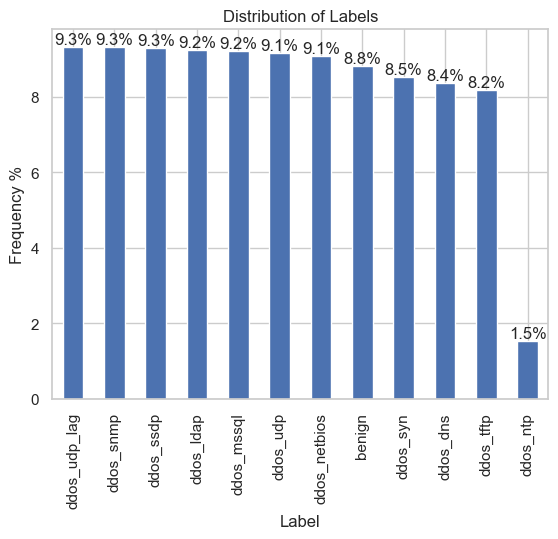

In [95]:
result_df.plot(x='label', y='Frequency (%)', kind='bar', legend=False)
plt.title('Distribution of Labels')
plt.xlabel("Label")
plt.ylabel("Frequency %")

percentages = result_df['Frequency (%)']

# Add text annotations with percentage values on the bars
for index, value in enumerate(percentages):
    plt.annotate(f'{value:.1f}%', xy=(index, value), ha='center', va='bottom')

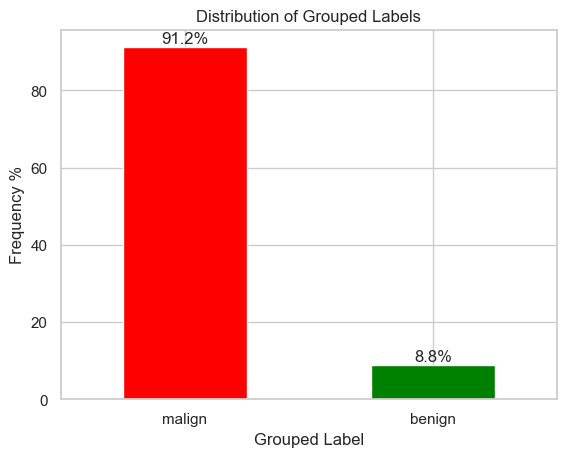

In [96]:
# We regrouped under the name "malign" all the types of DOS attacks
df['Grouped_Label'] = df['label'].apply(lambda x: 'benign' if x == 'benign' else 'malign')

# Plot the distribution of the grouped labels
grouped_classes = pd.Series(df['Grouped_Label']).value_counts(sort=True) / df['Grouped_Label'].count() * 100
ax = grouped_classes.plot(kind='bar', color=['red', 'green'])
plt.title('Distribution of Grouped Labels')
plt.xlabel("Grouped Label")
plt.ylabel("Frequency %")

ax.set_xticklabels(ax.get_xticklabels(), rotation=0) # rotate the x-axis labels

for i, v in enumerate(grouped_classes):
    ax.text(i, v + 1, f'{v:.1f}%', ha='center')

## Traffic Level

(1543655460.0, 1543671600.0)

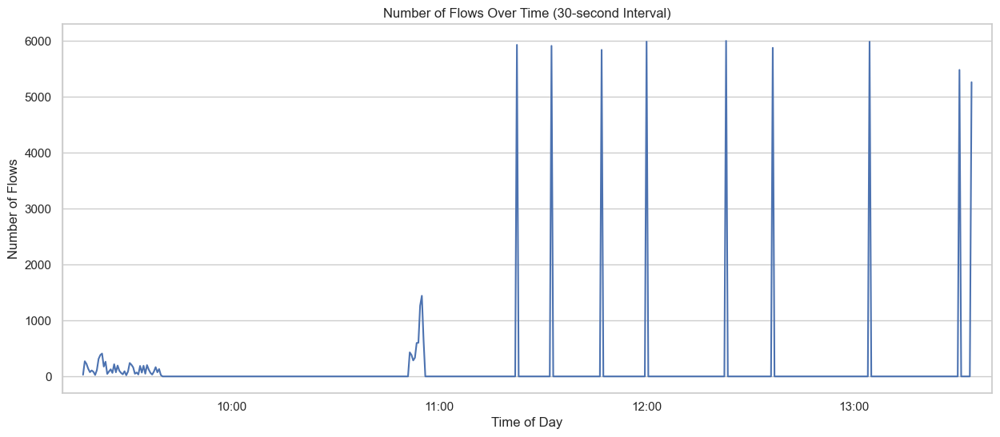

In [97]:
# Group data in intervals of 30 seconds
flows_per_time_interval = df.resample('30S', on='Timestamp').size()

# Plot the number of flows over time with a 30-second interval
plt.figure(figsize=(15, 6))
flows_per_time_interval.plot(linestyle='-', markersize=5)
plt.title('Number of Flows Over Time (30-second Interval)')
plt.xlabel('Time of Day')
plt.ylabel('Number of Flows')

# Set the desired start and end times
start_time = pd.to_datetime('2018-12-01 9:11')
end_time = pd.to_datetime('2018-12-01 13:40')

plt.xlim(start_time, end_time)

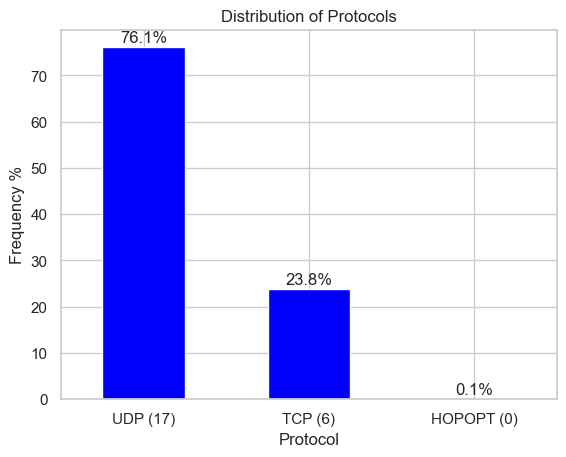

In [98]:
# Mapping protocol numbers to names
protocol_mapping = {
    0: 'HOPOPT (0)',
    6: 'TCP (6)',
    17: 'UDP (17)'
}

# Replace numeric labels with protocol names
df['Protocol_Name'] = df['Protocol'].map(protocol_mapping)

# Plot the distribution of protocols
protocol_distribution = df['Protocol_Name'].value_counts(sort=True) / len(df) * 100
ax = protocol_distribution.plot(kind='bar', color='blue')
plt.title('Distribution of Protocols')
plt.xlabel("Protocol")
plt.ylabel("Frequency %")

ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

for i, v in enumerate(protocol_distribution):
    ax.text(i, v + 1, f'{v:.1f}%', ha='center')

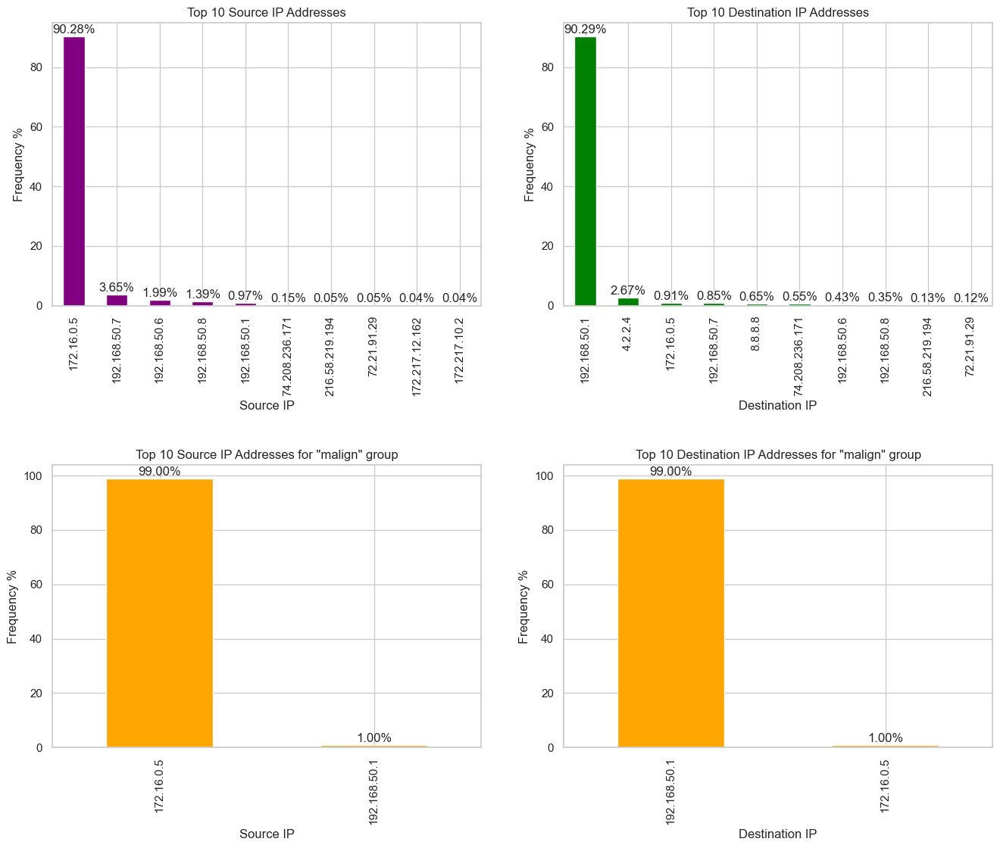

In [99]:
plt.figure(figsize=(14, 12))

# Plot the distribution of Top 10 Source IP addresses
plt.subplot(2, 2, 1)

source_ip_distribution = df['Source_IP'].value_counts().head(10) / len(df) * 100
ax = source_ip_distribution.plot(kind='bar', color='purple')
plt.title('Top 10 Source IP Addresses')
plt.xlabel("Source IP")
plt.ylabel("Frequency %")

for i, v in enumerate(source_ip_distribution):
    ax.text(i, v + 1, f'{v:.2f}%', ha='center')

# Plot the distribution of Top 10 Destination IP addresses
plt.subplot(2, 2, 2)

destination_ip_distribution = df['Destination_IP'].value_counts().head(10) / len(df) * 100
ax = destination_ip_distribution.plot(kind='bar', color='green')
plt.title('Top 10 Destination IP Addresses')
plt.xlabel("Destination IP")
plt.ylabel("Frequency %")

for i, v in enumerate(destination_ip_distribution):
    ax.text(i, v + 1, f'{v:.2f}%', ha='center')

# Plot the distribution of Top 10 Source IP addresses for 'malign' group
malign_packets = df[df['Grouped_Label'] == 'malign']

plt.subplot(2, 2, 3)

source_ip_distribution_malign = malign_packets['Source_IP'].value_counts().head(10) / len(malign_packets) * 100
ax = source_ip_distribution_malign.plot(kind='bar', color='orange')
plt.title('Top 10 Source IP Addresses for "malign" group')
plt.xlabel("Source IP")
plt.ylabel("Frequency %")

for i, v in enumerate(source_ip_distribution_malign):
    ax.text(i, v + 1, f'{v:.2f}%', ha='center')

# Plot the distribution of Top 10 Destination IP addresses for 'malign' group
plt.subplot(2, 2, 4)

destination_ip_distribution_malign = malign_packets['Destination_IP'].value_counts().head(10) / len(malign_packets) * 100
ax = destination_ip_distribution_malign.plot(kind='bar', color='orange')
plt.title('Top 10 Destination IP Addresses for "malign" group')
plt.xlabel("Destination IP")
plt.ylabel("Frequency %")

for i, v in enumerate(destination_ip_distribution_malign):
    ax.text(i, v + 1, f'{v:.2f}%', ha='center')

plt.tight_layout(pad=3)

(1543655460.0, 1543671600.0)

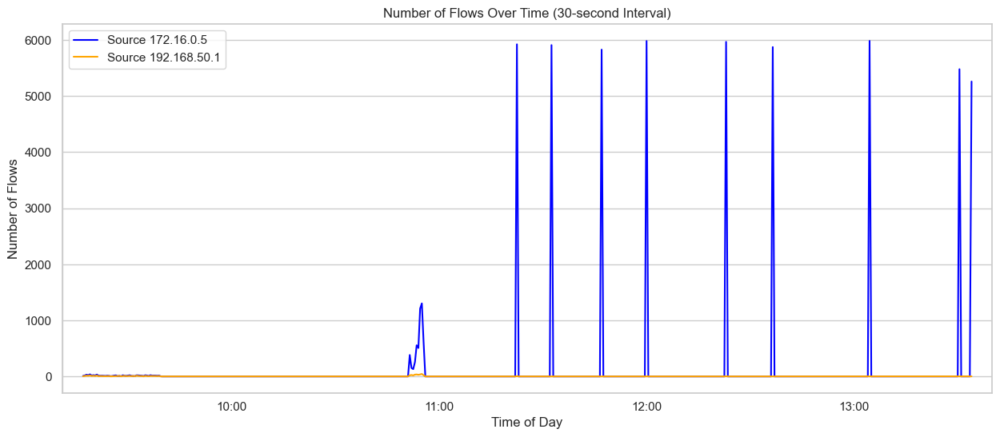

In [100]:
df_source_172 = df[(df['Grouped_Label'] == 'malign') & (df['Source_IP'] == '172.16.0.5') & (df['Destination_IP'] == '192.168.50.1')]
df_source_192 = df[(df['Grouped_Label'] == 'malign') & (df['Source_IP'] == '192.168.50.1') & (df['Destination_IP'] == '172.16.0.5')]

# Group data in intervals of 30 seconds for both DataFrames
flows_per_time_interval_172 = df_source_172.resample('30S', on='Timestamp').size()
flows_per_time_interval_192 = df_source_192.resample('30S', on='Timestamp').size()

# Plot the number of flows over time with a 30-second interval
plt.figure(figsize=(15, 6))

# Plot the first graph (df_source_172) with a beautiful color
flows_per_time_interval_172.plot(linestyle='-', markersize=5, label='Source 172.16.0.5', color='blue')

# Plot the second graph (df_source_192) with a different beautiful color
flows_per_time_interval_192.plot(linestyle='-', markersize=5, label='Source 192.168.50.1', color='orange')

plt.title('Number of Flows Over Time (30-second Interval)')
plt.xlabel('Time of Day')
plt.ylabel('Number of Flows')
plt.legend()  # Add legend to distinguish the two sources

# Set the desired start and end times
start_time = pd.to_datetime('2018-12-01 9:11')
end_time = pd.to_datetime('2018-12-01 13:40')

plt.xlim(start_time, end_time)

(0.0, 6000.0)

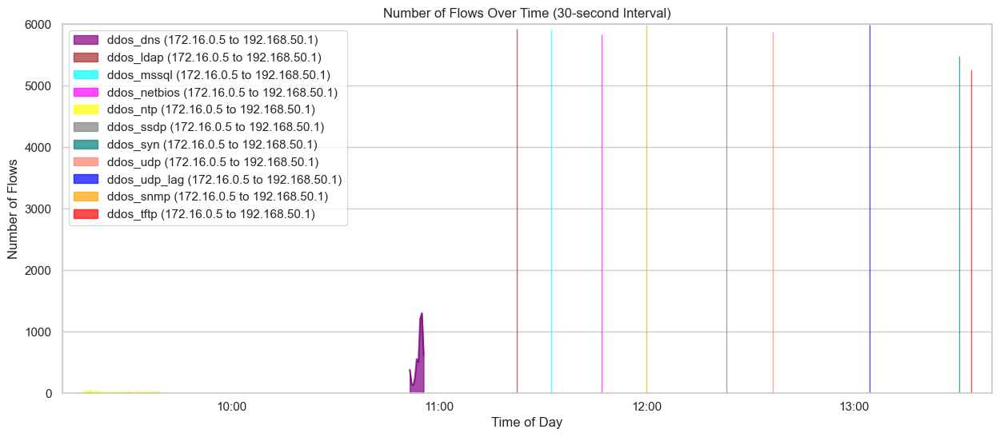

In [101]:
def plot_flows_over_time(df, label, source_ip, destination_ip, start_time, end_time, color):
    # Filter data for the specified label, source IP, and destination IP
    df_source = df[(df['label'] == label) & (df['Source_IP'] == source_ip) & (df['Destination_IP'] == destination_ip)]

    # Check if the DataFrame is not empty
    if not df_source.empty:
        # Use .loc to avoid SettingWithCopyWarning
        df_source.loc[:, 'Timestamp'] = pd.to_datetime(df_source['Timestamp'])

        # Set 'Timestamp' as the index
        df_source.set_index('Timestamp', inplace=True)

        # Group data in intervals of 30 seconds
        flows_per_time_interval = df_source.resample('30S').size()

        # Plot the number of flows over time with a 30-second interval using an area plot
        flows_per_time_interval.plot(kind='area', label=f'{label} ({source_ip} to {destination_ip})', color=color, alpha=0.7)

plt.figure(figsize=(15, 6))

# List of labels and corresponding colors
labels = ['benign', 'ddos_dns', 'ddos_ldap', 'ddos_mssql', 'ddos_netbios', 'ddos_ntp', 'ddos_ssdp', 'ddos_syn', 'ddos_udp', 'ddos_udp_lag', 'ddos_snmp', 'ddos_tftp']
colors = ['green', 'purple', 'brown', 'cyan', 'magenta', 'yellow', 'gray', 'teal', 'salmon', 'blue', 'orange', 'red']

# Iterate through labels and plot flows for each label
for label, color in zip(labels, colors):
    plot_flows_over_time(df, label, '172.16.0.5', '192.168.50.1', start_time, end_time, color)

plt.title('Number of Flows Over Time (30-second Interval)')
plt.xlabel('Time of Day')
plt.ylabel('Number of Flows')
plt.legend()
plt.xlim(start_time, end_time)
plt.ylim(0, 6000)

## Flow Analysis

In [102]:
# Display the top ten Flow IDs with most packet sent
df.nlargest(10, 'Total_Fwd_Packets')[['Flow_ID', 'Total_Fwd_Packets', 'Timestamp']]

,Flow_ID,Total_Fwd_Packets,Timestamp
5984,172.16.0.5-192.168.50.1-0-0-0,85894,2018-12-01 11:22:40.254769
11913,172.16.0.5-192.168.50.1-0-0-0,60959,2018-12-01 11:32:32.915441
35635,172.16.0.5-192.168.50.1-0-0-0,49476,2018-12-01 12:23:13.663425
47603,172.16.0.5-192.168.50.1-0-0-0,4360,2018-12-01 13:30:30.750958
17832,172.16.0.5-192.168.50.1-0-0-0,4114,2018-12-01 11:47:08.465544
5972,172.16.0.5-192.168.50.1-0-0-0,2768,2018-12-01 10:55:44.590386
1588,172.16.0.5-192.168.50.1-0-0-0,1942,2018-12-01 10:53:40.214163
3433,172.16.0.5-192.168.50.1-0-0-0,1290,2018-12-01 10:54:47.671297
17,172.16.0.5-192.168.50.1-0-0-0,1014,2018-12-01 10:51:40.212271
26719,172.217.9.230-192.168.50.7-443-50904-6,916,2018-12-01 09:26:27.501955


In [103]:
# Group the DataFrame by 'Flow_ID' and calculate the sum of 'Total_Fwd_Packets' for each group
grouped_Flow_ID = df.groupby('Flow_ID').agg({
    'Total_Fwd_Packets': 'sum',
    'Grouped_Label': lambda x: x.nunique() == 1 and x.iloc[0] or 'both'
}).reset_index()

# Count the number of Flow_ID where 'Grouped_Label' is 'both'
count_both = grouped_Flow_ID[grouped_Flow_ID['Grouped_Label'] == 'both'].shape[0]

print(f"The number of Flow_IDs which are both 'malign' and 'benign' in the dataset is: {count_both}")

The number of Flow_IDs which are both 'malign' and 'benign' in the dataset is: 0


In [104]:
# Group the DataFrame by 'Flow_ID' and calculate the sum of 'Total_Fwd_Packets' for each group
grouped_flow_packets = df.groupby(['Flow_ID', 'Grouped_Label'])['Total_Fwd_Packets'].sum()

# Display the top ten Flow_IDs with the largest sum of Total_Fwd_Packets
grouped_flow_packets.nlargest(10)

Flow_ID                                  Grouped_Label
172.16.0.5-192.168.50.1-0-0-0            malign           212815
172.217.9.230-192.168.50.7-443-50904-6   benign              926
192.168.50.253-224.0.0.5-0-0-0           benign              684
192.168.50.7-125.56.201.90-50700-80-6    benign              673
172.217.12.198-192.168.50.7-443-50529-6  benign              553
192.168.50.7-125.56.201.112-50765-80-6   benign              537
192.168.50.7-8.253.140.119-50687-80-6    benign              537
192.168.50.254-224.0.0.5-0-0-0           benign              513
192.168.50.7-216.58.219.194-50944-443-6  benign              499
172.217.3.102-192.168.50.7-443-50604-6   benign              446
Name: Total_Fwd_Packets, dtype: int64

### Analysis of the Flows: '172.16.0.5-192.168.50.1-0-0-0'

In [105]:
malign_df = df[(df['Grouped_Label'] == 'malign') & (df['Flow_ID'] == '172.16.0.5-192.168.50.1-0-0-0')]

In [106]:
# Group the DataFrame by 'label' and calculate the mean for other columns
grouped_data = malign_df.groupby('label').agg({
    'Total_Fwd_Packets': 'mean',
    'Total_Backward_Packets': 'mean',
    'Flow_Duration': 'mean',
    'Flow_Packets/s': 'mean'
}).reset_index()

# Add a new column 'Label_Count' with the count of each label
label_counts = malign_df['label'].value_counts().reset_index()
label_counts.columns = ['label', 'Number_of_Attacks']

# Merge the two DataFrames on the 'label' column
grouped_data = pd.merge(grouped_data, label_counts, on='label')

# Rearrange columns to have 'Label_Count' as the second column
grouped_data = grouped_data[['label', 'Number_of_Attacks', 'Total_Fwd_Packets', 'Total_Backward_Packets', 'Flow_Duration', 'Flow_Packets/s']]

grouped_data

,label,Number_of_Attacks,Total_Fwd_Packets,Total_Backward_Packets,Flow_Duration,Flow_Packets/s
0,ddos_dns,4,1753.500000,151.000000,9.052713e+07,22.553654
1,ddos_ldap,1,85894.000000,28.000000,9.141643e+06,9398.966903
2,ddos_mssql,1,60959.000000,462.000000,1.191511e+08,515.488390
3,ddos_netbios,1,4114.000000,194.000000,1.197084e+08,35.987459
4,ddos_ntp,7,3.428571,3.428571,4.000913e+07,14666.297939
5,ddos_ssdp,1,49476.000000,214.000000,1.197142e+08,415.071792
6,ddos_syn,1,4360.000000,232.000000,1.194617e+08,38.439097
7,ddos_tftp,1,252.000000,222.000000,1.194945e+08,3.966711
8,ddos_udp,1,722.000000,194.000000,1.200000e+08,7.633336


Text(0, 0.5, 'Frequency')

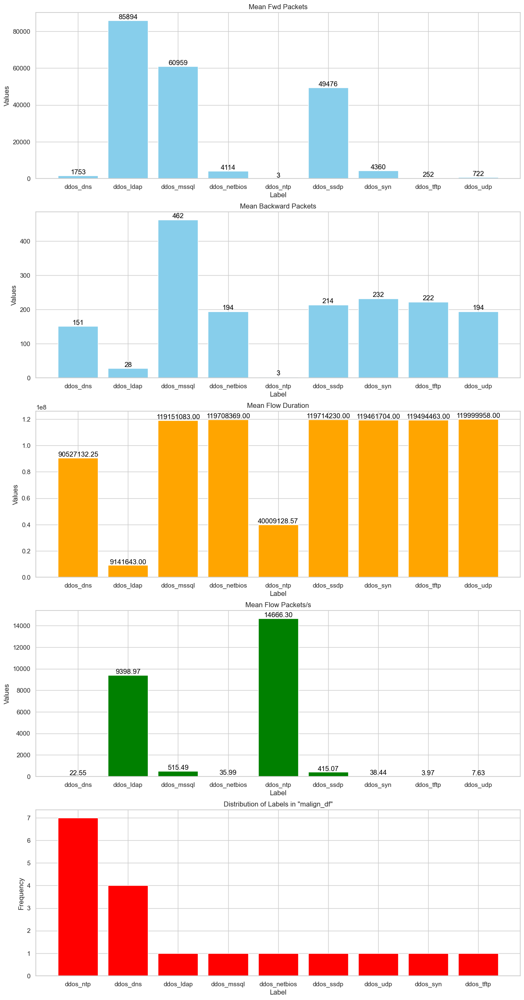

In [107]:
fig, axes = plt.subplots(nrows=5, figsize=(15, 30))

# Plot bar chart for Mean Fwd Packets
axes[0].bar(grouped_data['label'], grouped_data['Total_Fwd_Packets'], color='skyblue')
axes[0].set_title('Mean Fwd Packets')
axes[0].set_xlabel('Label')
axes[0].set_ylabel('Values')

for i, v in enumerate(grouped_data['Total_Fwd_Packets']):
    axes[0].text(i, v + 1, str(int(v)), ha='center', va='bottom', color='black')

# Plot bar chart for Mean Backward Packets
axes[1].bar(grouped_data['label'], grouped_data['Total_Backward_Packets'], color='skyblue')
axes[1].set_title('Mean Backward Packets')
axes[1].set_xlabel('Label')
axes[1].set_ylabel('Values')

for i, v in enumerate(grouped_data['Total_Backward_Packets']):
    axes[1].text(i, v + 1, str(int(v)), ha='center', va='bottom', color='black')

# Plot bar chart for Mean Flow Duration
axes[2].bar(grouped_data['label'], grouped_data['Flow_Duration'], color='orange')
axes[2].set_title('Mean Flow Duration')
axes[2].set_xlabel('Label')
axes[2].set_ylabel('Values')

for i, v in enumerate(grouped_data['Flow_Duration']):
    axes[2].text(i, v + 1, f'{v:.2f}', ha='center', va='bottom', color='black')

# Plot bar chart for Mean Flow Packets/s
axes[3].bar(grouped_data['label'], grouped_data['Flow_Packets/s'], color='green')
axes[3].set_title('Mean Flow Packets/s')
axes[3].set_xlabel('Label')
axes[3].set_ylabel('Values')

for i, v in enumerate(grouped_data['Flow_Packets/s']):
    axes[3].text(i, v + 0.1, f'{v:.2f}', ha='center', va='bottom', color='black')

# Count occurrences in malign_df
malign_counts = malign_df['label'].value_counts()

# Plot bar graph for distribution of labels in "malign_df"
axes[4].bar(malign_counts.index, malign_counts.values, color='red')
axes[4].set_title('Distribution of Labels in "malign_df"')
axes[4].set_xlabel("Label")
axes[4].set_ylabel("Frequency")

### Analysis of the other flows

In [108]:
malign_df = df[(df['Grouped_Label'] == 'malign') & (df['Flow_ID'] != '172.16.0.5-192.168.50.1-0-0-0')]

In [109]:
# Group the DataFrame by 'label' and calculate the mean for other columns
grouped_data = malign_df.groupby('label').agg({
    'Total_Fwd_Packets': 'mean',
    'Total_Backward_Packets': 'mean',
    'Flow_Duration': 'mean',
    'Flow_Packets/s': 'mean'
}).reset_index()

# Add a new column 'Label_Count' with the count of each label
label_counts = malign_df['label'].value_counts().reset_index()
label_counts.columns = ['label', 'Number_of_Attacks']

# Merge the two DataFrames on the 'label' column
grouped_data = pd.merge(grouped_data, label_counts, on='label')

# Rearrange columns to have 'Label_Count' as the second column
grouped_data = grouped_data[['label', 'Number_of_Attacks', 'Total_Fwd_Packets', 'Total_Backward_Packets', 'Flow_Duration', 'Flow_Packets/s']]

grouped_data

,label,Number_of_Attacks,Total_Fwd_Packets,Total_Backward_Packets,Flow_Duration,Flow_Packets/s
0,ddos_dns,5365,146.929171,0.169991,1.788298e+05,2.048789e+05
1,ddos_ldap,5927,2.002700,0.001518,6.929212e+02,1.612206e+06
2,ddos_mssql,5910,2.005922,0.001354,6.089494e+03,1.557511e+06
3,ddos_netbios,5829,2.001372,0.000000,3.217452e+03,1.758987e+06
4,ddos_ntp,979,4.762002,4.591420,2.941168e+06,4.268626e+04
5,ddos_snmp,5984,2.008021,0.000000,8.033757e+00,1.560540e+06
6,ddos_ssdp,5969,2.004356,0.000335,6.903557e+03,1.015560e+06
7,ddos_syn,5479,7.403358,0.807447,4.637450e+07,8.356718e+05
8,ddos_tftp,5260,2.403042,0.277947,2.318245e+06,1.180627e+06
9,ddos_udp,5875,3.718128,0.000000,9.273344e+04,8.272651e+05


### Analysis of Ports

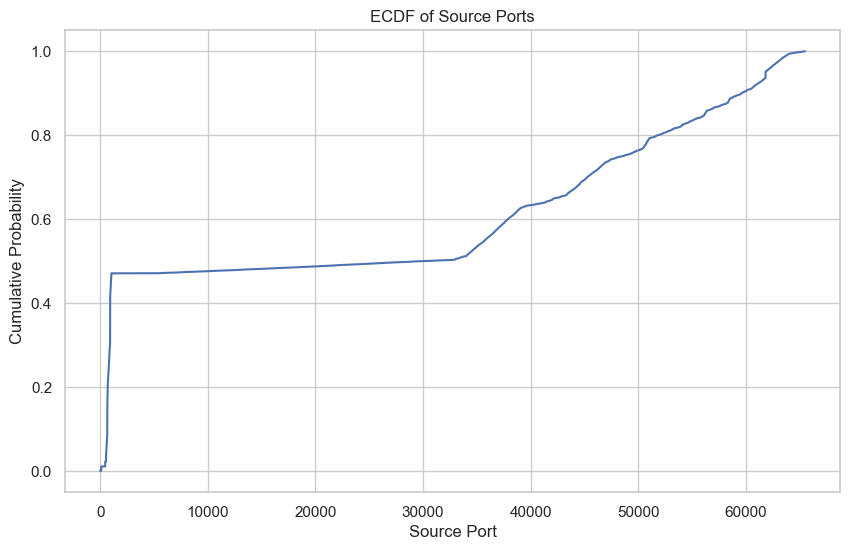

In [110]:
data = df['Source_Port'].values
sorted_data = np.sort(data)
y = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

plt.figure(figsize=(10, 6))
plt.plot(sorted_data, y, linestyle='-', color='b')

plt.title('ECDF of Source Ports')
plt.xlabel('Source Port')
plt.ylabel('Cumulative Probability')

plt.grid(True)

Text(0.5, 1.0, 'Violin Plot for Source Port')

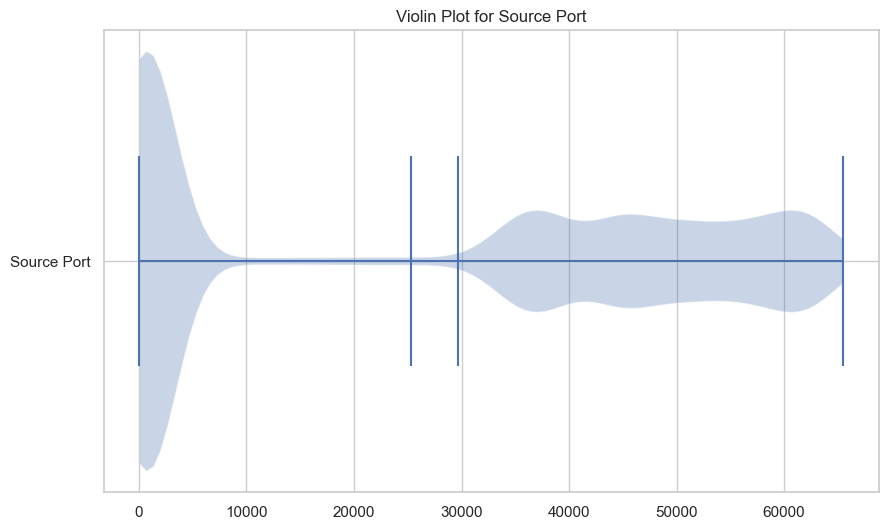

In [111]:
fig, ax = plt.subplots(figsize=(10, 6))

# Create a violin plot for Source Port
ax.violinplot(df['Source_Port'], vert=False, widths=0.7, showmeans=True, showextrema=True, showmedians=True)
ax.set_yticks([1], labels=['Source Port'])
ax.set_title('Violin Plot for Source Port')

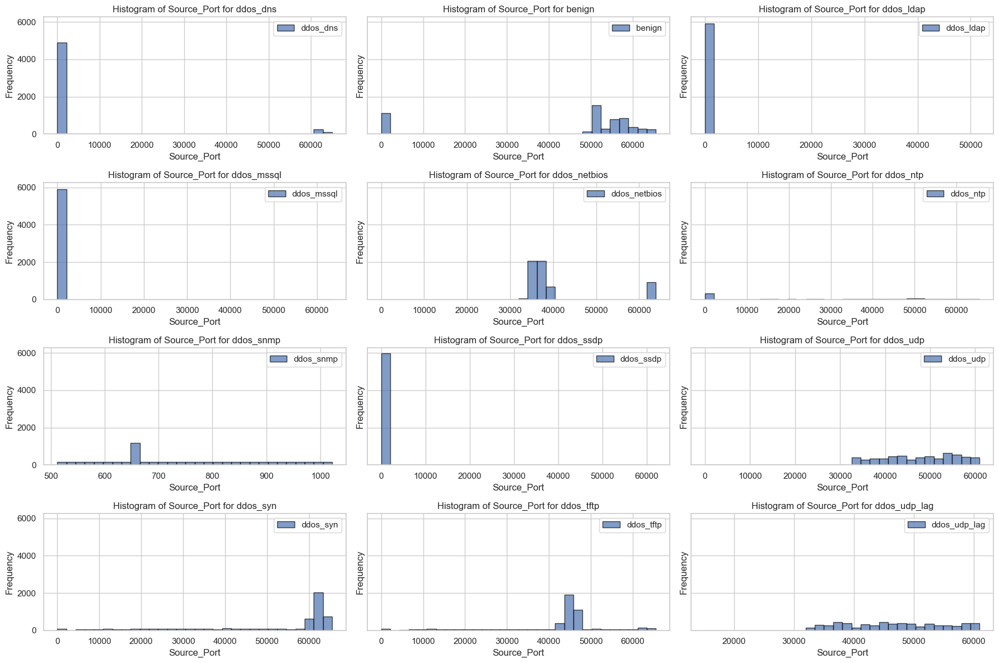

In [112]:
# Get unique labels
unique_labels = df['label'].unique()

# Create subplots with a 4x3 grid and a shared y-axis
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 12), sharey=True)

# Flatten the 2D array of subplots into a 1D array
axes = axes.flatten()

# Plot histograms for each flow type
for i, label in enumerate(unique_labels):
    subset_data = df[df['label'] == label]['Source_Port']
    axes[i].hist(subset_data, bins=30, alpha=0.7, label=f'{label}', edgecolor='black')
    
    # Add labels, title, and legend for each subplot
    axes[i].set_xlabel('Source_Port')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Histogram of Source_Port for {label}')
    axes[i].legend()

# Hide empty subplots
for j in range(len(unique_labels), len(axes)):
    axes[j].axis('off')

plt.tight_layout()

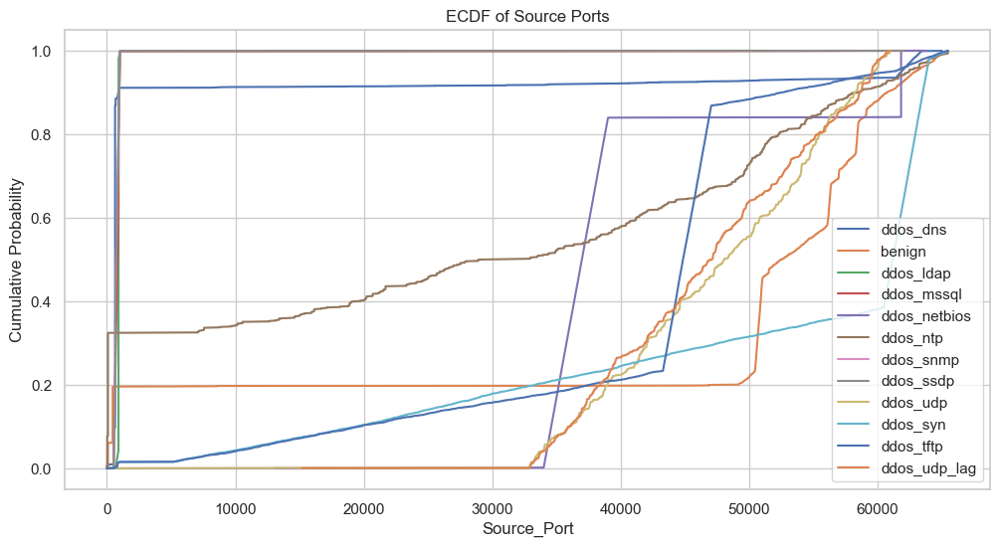

In [113]:
fig, ax = plt.subplots(figsize=(12, 6))

# ECDF for each label
labels = df['label'].unique()

for label in labels:
    subset_data = df[df['label'] == label]['Source_Port']
    sorted_data = np.sort(subset_data)
    y = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    ax.plot(sorted_data, y, label=f'{label}')

ax.set_xlabel('Source_Port')
ax.set_ylabel('Cumulative Probability')
ax.set_title('ECDF of Source Ports')
ax.legend()

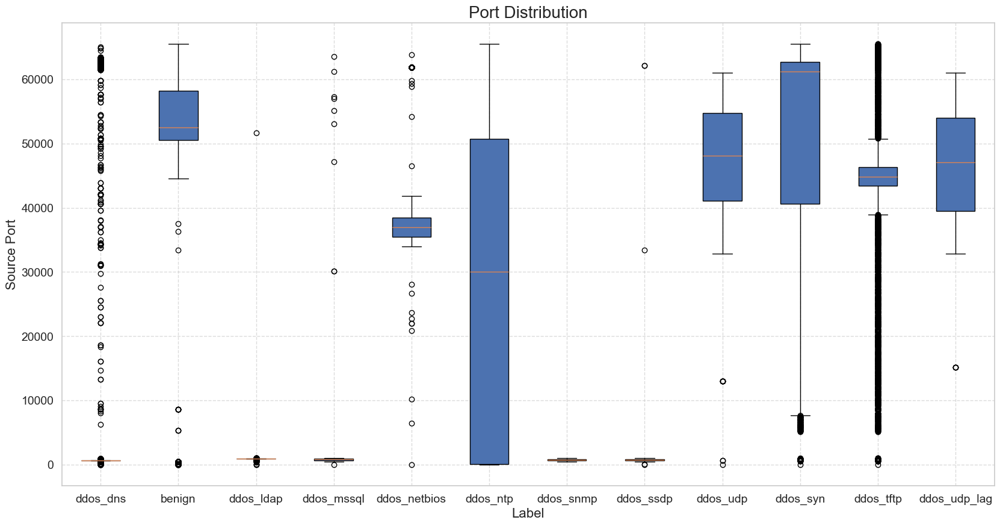

In [114]:
labels = df['label'].unique()
data_to_plot = [df[df['label'] == label]['Source_Port'].values for label in labels]

fig, ax = plt.subplots(figsize=(20, 10))

# Create a boxplot
box = ax.boxplot(data_to_plot, patch_artist=True, widths=0.5)

ax.set_title('Port Distribution', fontsize=20)
ax.set_xlabel('Label', fontsize=16)
ax.set_ylabel('Source Port', fontsize=16)

ax.set_xticklabels(labels, fontsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.grid(True, linestyle='--', alpha=0.7)

In [115]:
statistics_by_label = df.groupby('label')['Source_Port'].describe()
statistics_by_label

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
benign,5658.0,44557.279251,22271.290969,0.0,50519.25,52505.0,58226.00,65504.0
ddos_dns,5369.0,5565.382008,16275.859442,0.0,634.00,634.0,634.00,65020.0
ddos_ldap,5928.0,903.629049,660.967444,0.0,900.00,900.0,900.00,51684.0
ddos_mssql,5911.0,866.453730,1997.512383,0.0,664.00,827.0,900.00,63514.0
ddos_netbios,5830.0,40535.258319,9425.903012,0.0,35490.25,36988.5,38487.75,63873.0
ddos_ntp,986.0,28612.516227,23645.490013,0.0,80.00,30031.5,50768.50,65518.0
ddos_snmp,5984.0,745.417614,140.003142,512.0,648.00,713.5,865.00,1022.0
ddos_ssdp,5970.0,779.405863,1207.967602,0.0,670.00,723.0,872.75,62102.0
ddos_syn,5480.0,50693.637956,17997.035407,0.0,40658.50,61195.0,62668.50,65498.0


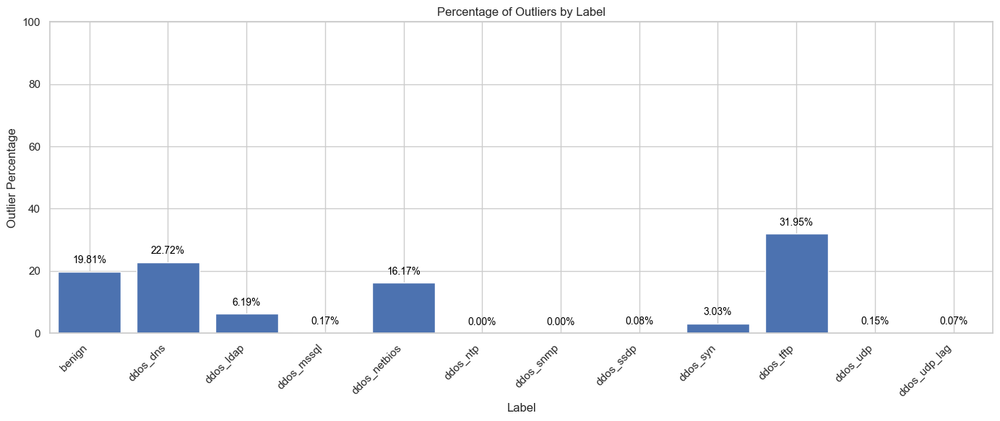

In [116]:
# Calculate the percentage of outliers for each label
outlier_percentages = df.groupby('label')['Source_Port'].apply(lambda data: len(data[(data < data.quantile(0.25) - 1.5 * (data.quantile(0.75) - data.quantile(0.25))) | (data > data.quantile(0.75) + 1.5 * (data.quantile(0.75) - data.quantile(0.25)))]) / len(data) * 100).reset_index()
outlier_percentages.columns = ['label', 'Outlier Percentage']

fig, ax = plt.subplots(figsize=(14, 6))
bars = ax.bar(outlier_percentages['label'], outlier_percentages['Outlier Percentage'])

# Add percentage values on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 2, f'{yval:.2f}%', ha='center', va='bottom', fontsize=10, color='black')

ax.set_ylim(0, 100)
ax.set_xlim(-0.5, len(outlier_percentages['label']) - 0.5)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

plt.title('Percentage of Outliers by Label')
plt.xlabel('Label')
plt.ylabel('Outlier Percentage')

plt.tight_layout()  

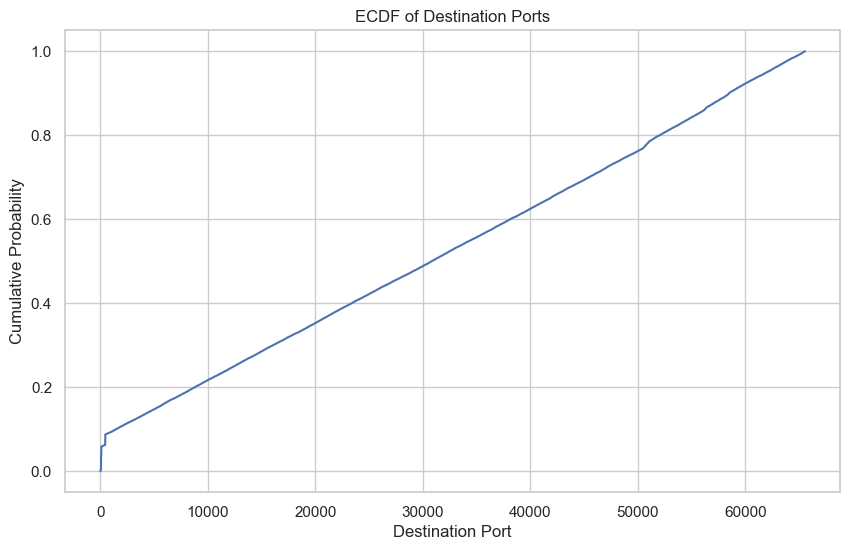

In [117]:
data = df['Destination_Port'].values
sorted_data = np.sort(data)
y = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

plt.figure(figsize=(10, 6))
plt.plot(sorted_data, y, linestyle='-', color='b')

plt.title('ECDF of Destination Ports')
plt.xlabel('Destination Port')
plt.ylabel('Cumulative Probability')

plt.grid(True)

Text(0.5, 1.0, 'Violin Plot for Destination Port')

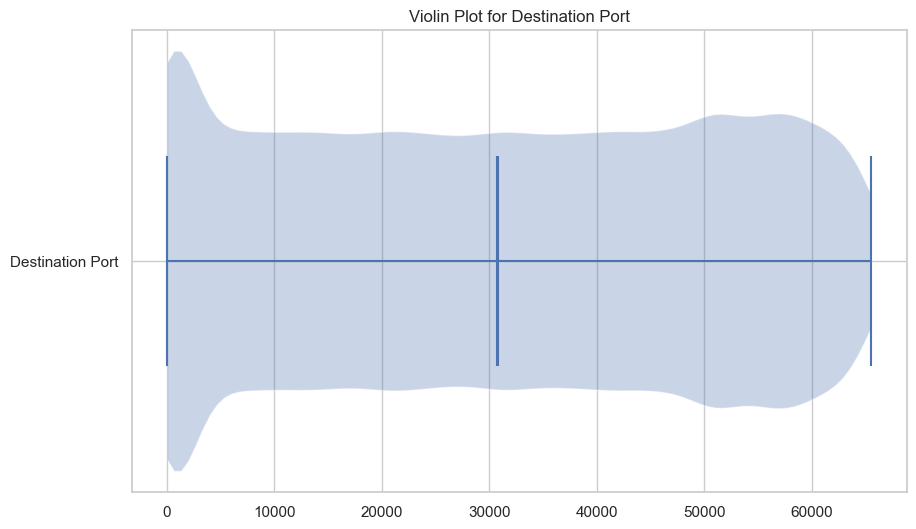

In [118]:
fig, ax = plt.subplots(figsize=(10, 6))

# Create a violin plot for Destination Port
ax.violinplot(df['Destination_Port'], vert=False, widths=0.7, showmeans=True, showextrema=True, showmedians=True)
ax.set_yticks([1], labels=['Destination Port'])
ax.set_title('Violin Plot for Destination Port')

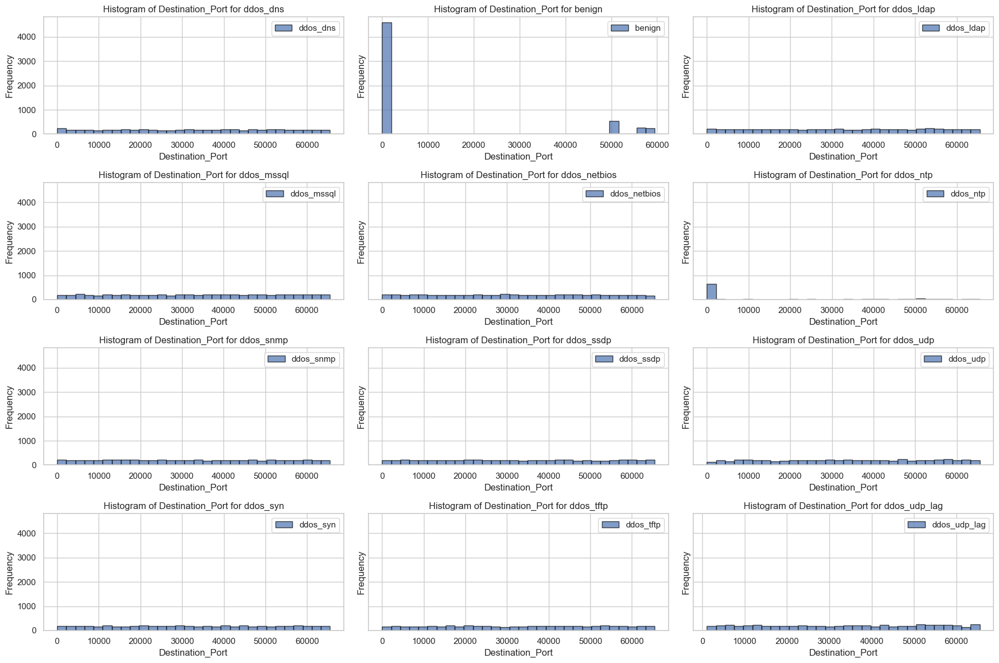

In [119]:
# Get unique labels
unique_labels = df['label'].unique()

# Create subplots with a 4x3 grid and a shared y-axis
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 12), sharey=True)

# Flatten the 2D array of subplots into a 1D array
axes = axes.flatten()

# Plot histograms for each flow type
for i, label in enumerate(unique_labels):
    subset_data = df[df['label'] == label]['Destination_Port']
    axes[i].hist(subset_data, bins=30, alpha=0.7, label=f'{label}', edgecolor='black')
    
    axes[i].set_xlabel('Destination_Port')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Histogram of Destination_Port for {label}')
    axes[i].legend()

# Hide empty subplots
for j in range(len(unique_labels), len(axes)):
    axes[j].axis('off')

plt.tight_layout()

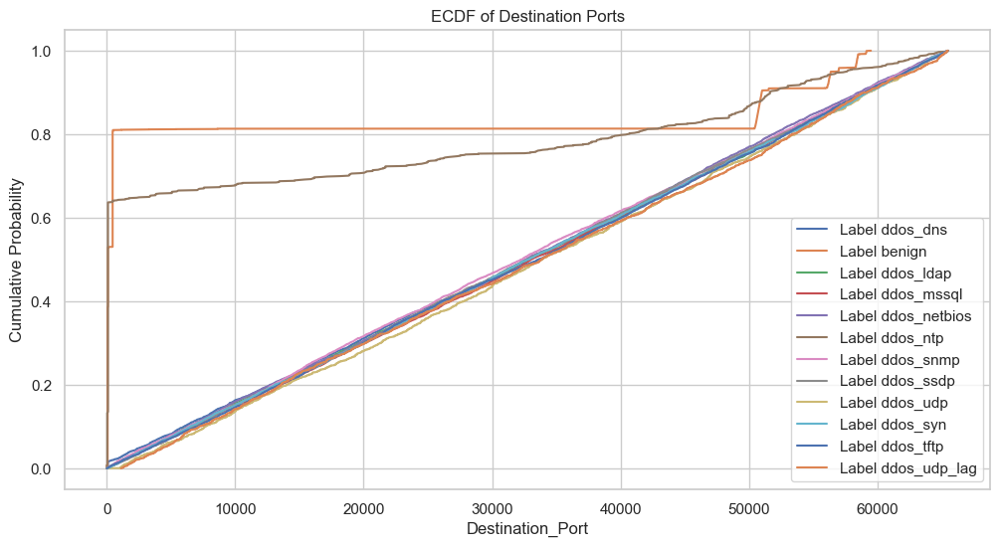

In [120]:
fig, ax = plt.subplots(figsize=(12, 6))

# ECDF for each label
labels = df['label'].unique()

for label in labels:
    subset_data = df[df['label'] == label]['Destination_Port']
    sorted_data = np.sort(subset_data)
    y = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    ax.plot(sorted_data, y, label=f'Label {label}')

ax.set_xlabel('Destination_Port')
ax.set_ylabel('Cumulative Probability')
ax.set_title('ECDF of Destination Ports')
ax.legend()

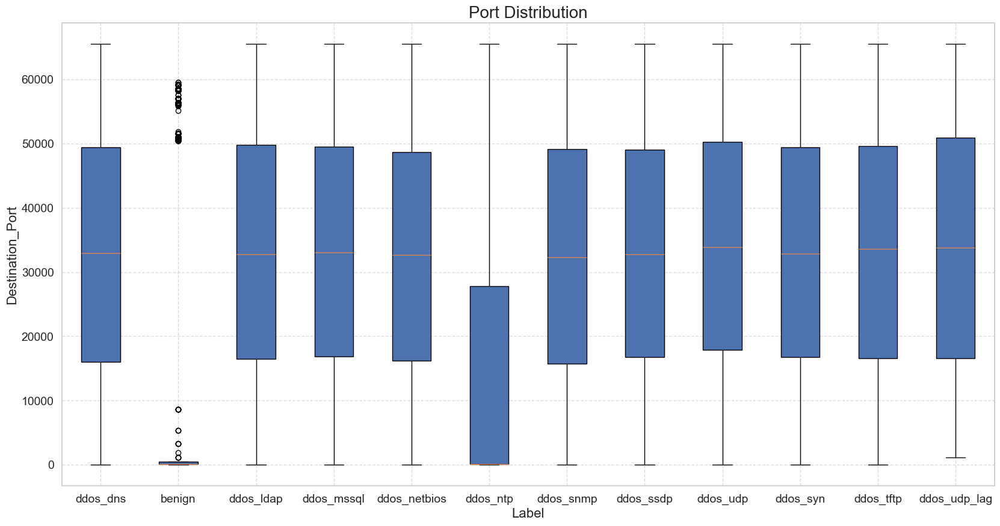

In [121]:
labels = df['label'].unique()
data_to_plot = [df[df['label'] == label]['Destination_Port'].values for label in labels]

fig, ax = plt.subplots(figsize=(20, 10))

# Create a boxplot
box = ax.boxplot(data_to_plot, patch_artist=True, widths=0.5)

ax.set_title('Port Distribution', fontsize=20)
ax.set_xlabel('Label', fontsize=16)
ax.set_ylabel('Destination_Port', fontsize=16)

ax.set_xticklabels(labels, fontsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.grid(True, linestyle='--', alpha=0.7)

In [122]:
# Explore descriptive statistics for each label
statistics_by_label = df.groupby('label')['Destination_Port'].describe()
statistics_by_label

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
benign,5658.0,10254.177801,21010.863942,0.0,53.00,80.0,443.00,59514.0
ddos_dns,5369.0,32678.987521,19175.755566,0.0,15980.00,32946.0,49462.00,65528.0
ddos_ldap,5928.0,32871.126687,19010.912193,0.0,16435.25,32763.0,49767.00,65530.0
ddos_mssql,5911.0,33100.338691,18930.418794,0.0,16894.00,33028.0,49516.00,65535.0
ddos_netbios,5830.0,32591.560549,18847.135276,0.0,16148.75,32629.0,48690.25,65530.0
ddos_ntp,986.0,14102.842799,21677.002051,0.0,80.00,80.0,27781.50,65518.0
ddos_snmp,5984.0,32456.630849,18997.393263,7.0,15740.00,32280.0,49124.00,65535.0
ddos_ssdp,5970.0,32852.197320,18920.354382,0.0,16720.75,32752.0,49085.25,65528.0
ddos_syn,5480.0,32982.425365,19009.024627,0.0,16732.00,32834.5,49458.75,65513.0


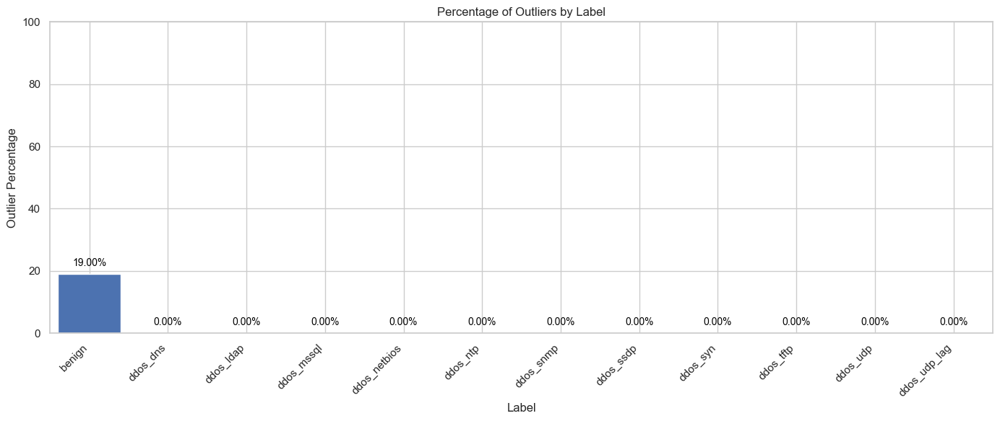

In [123]:
# Calculate the percentage of outliers for each label
outlier_percentages = df.groupby('label')['Destination_Port'].apply(lambda data: len(data[(data < data.quantile(0.25) - 1.5 * (data.quantile(0.75) - data.quantile(0.25))) | (data > data.quantile(0.75) + 1.5 * (data.quantile(0.75) - data.quantile(0.25)))]) / len(data) * 100).reset_index()
outlier_percentages.columns = ['label', 'Outlier Percentage']

fig, ax = plt.subplots(figsize=(14, 6))
bars = ax.bar(outlier_percentages['label'], outlier_percentages['Outlier Percentage'])

# Add percentage values on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 2, f'{yval:.2f}%', ha='center', va='bottom', fontsize=10, color='black')

ax.set_ylim(0, 100)
ax.set_xlim(-0.5, len(outlier_percentages['label']) - 0.5)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

plt.title('Percentage of Outliers by Label')
plt.xlabel('Label')
plt.ylabel('Outlier Percentage')

plt.tight_layout()  

Text(0, 0.5, 'Destination Port')

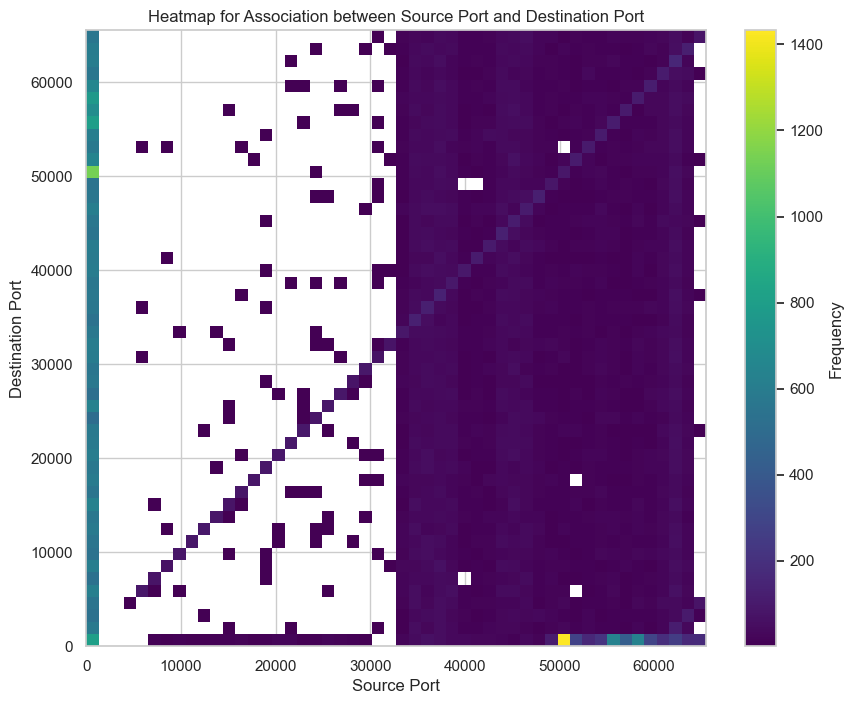

In [124]:
# Create a 2D histogram (heatmap) for Source Port vs. Destination Port
plt.figure(figsize=(10, 8))
heatmap, xedges, yedges, image = plt.hist2d(df['Source_Port'], df['Destination_Port'], bins=(50, 50), cmap='viridis', cmin=1)

cbar = plt.colorbar()
cbar.set_label('Frequency')

plt.title('Heatmap for Association between Source Port and Destination Port')
plt.xlabel('Source Port')
plt.ylabel('Destination Port')

In [125]:
# Group data by 'label' and calculate statistics for relevant features
class_stats = df.groupby('label')[['Total_Fwd_Packets', 'Total_Backward_Packets', 'Flow_Duration', 'Flow_Packets/s']].describe()
display(class_stats)

Total_Fwd_Packets                                              \
                         count        mean          std  min    25%    50%   
label                                                                        
benign                  5658.0    8.310180    30.443370  1.0    1.0    2.0   
ddos_dns                5369.0  148.126094    96.006415  1.0  150.0  200.0   
ddos_ldap               5928.0   16.491903  1115.574573  2.0    2.0    2.0   
ddos_mssql              5911.0   12.318389   792.853729  2.0    2.0    2.0   
ddos_netbios            5830.0    2.706690    53.854114  2.0    2.0    2.0   
ddos_ntp                 986.0    4.752535     6.759961  1.0    1.0    1.0   
ddos_snmp               5984.0    2.008021     0.219253  2.0    2.0    2.0   
ddos_ssdp               5970.0   10.291457   640.309333  2.0    2.0    2.0   
ddos_syn                5480.0    8.197628    59.158057  2.0    2.0    2.0   
ddos_tftp               5261.0    2.450485     3.537532  2.0    2.0    2.0   
ddos_udp                5876.0    3.840368     9.768366  2.0    2.0    4.0   
ddos_udp_lag            5986.0    3.584698     2.611572  2.0    2.0    2.0   

                             Total_Backward_Packets             ...  \
                75%      max                  count       mean  ...   
label                                                           ...   
benign          3.0    916.0                 5658.0  12.422057  ...   
ddos_dns      200.0   2768.0                 5369.0   0.282362  ...   
ddos_ldap       2.0  85894.0                 5928.0   0.006242  ...   
ddos_mssql      2.0  60959.0                 5911.0   0.079513  ...   
ddos_netbios    2.0   4114.0                 5830.0   0.033276  ...   
ddos_ntp        7.0     35.0                  986.0   4.583164  ...   
ddos_snmp       2.0      8.0                 5984.0   0.000000  ...   
ddos_ssdp       2.0  49476.0                 5970.0   0.036181  ...   
ddos_syn       14.0   4360.0                 5480.0   0.849635  ...   
ddos_tftp       2.0    252.0                 5261.0   0.320091  ...   
ddos_udp        4.0    722.0                 5876.0   0.033016  ...   
ddos_udp_lag    4.0     20.0                 5986.0   0.000000  ...   

             Flow_Duration              Flow_Packets/s                \
                       75%          max          count          mean   
label                                                                  
benign        9.138725e+04  119995906.0         5658.0  1.308859e+05   
ddos_dns      5.128000e+04  119819608.0         5369.0  2.047263e+05   
ddos_ldap     2.000000e+00    9141643.0         5928.0  1.611936e+06   
ddos_mssql    2.000000e+00  119151083.0         5911.0  1.557248e+06   
ddos_netbios  1.000000e+00  119708369.0         5830.0  1.758685e+06   
ddos_ntp      4.847836e+06  114745742.0          986.0  4.248734e+04   
ddos_snmp     2.000000e+00       1165.0         5984.0  1.560540e+06   
ddos_ssdp     3.000000e+00  119714230.0         5970.0  1.015390e+06   
ddos_syn      1.095189e+08  119999653.0         5480.0  8.355193e+05   
ddos_tftp     9.900000e+01  119494463.0         5261.0  1.180403e+06   
ddos_udp      1.089662e+05  119999958.0         5876.0  8.271243e+05   
ddos_udp_lag  1.088970e+05     989583.0         5986.0  8.110906e+05   

                                                                      \
                        std          min           25%           50%   
label                                                                  
benign        450377.294143     0.062493  5.523675e+01  1.924141e+02   
ddos_dns      477892.468761     0.122070  3.397662e+03  6.428594e+03   
ddos_ldap     606982.366572     4.306560  1.000000e+06  2.000000e+06   
ddos_mssql    633841.109670     0.259374  1.000000e+06  2.000000e+06   
ddos_netbios  561981.271604     0.622821  2.000000e+06  2.000000e+06   
ddos_ntp      197260.915224     0.054253  4.002012e+00  9.592381e+03   
ddos_snmp     708618.849402  6866.952790  1.000

In [126]:
# Group by 'Flow_ID' and calculate aggregate statistics
flow_statistics = df.groupby('Flow_ID')[['Total_Fwd_Packets', 'Total_Backward_Packets', 'Flow_Duration', 'Flow_Packets/s']].agg(['mean', 'min', 'max', 'quantile'])

# Rename columns for clarity
flow_statistics.columns = ['_'.join(col).strip() for col in flow_statistics.columns.values]

# Reset index to make 'Flow_ID' a regular column
flow_statistics.reset_index(inplace=True)
display(flow_statistics)

# Merge flow_statistics back to the original DataFrame based on 'Flow_ID'
df = pd.merge(df, flow_statistics, on='Flow_ID', how='left')

display(df.head())

,Flow_ID,Total_Fwd_Packets_mean,Total_Fwd_Packets_min,Total_Fwd_Packets_max,Total_Fwd_Packets_quantile,Total_Backward_Packets_mean,Total_Backward_Packets_min,Total_Backward_Packets_max,Total_Backward_Packets_quantile,Flow_Duration_mean,Flow_Duration_min,Flow_Duration_max,Flow_Duration_quantile,Flow_Packets/s_mean,Flow_Packets/s_min,Flow_Packets/s_max,Flow_Packets/s_quantile
0,172.16.0.5-192.168.50.1-0-0-0,11823.055556,2,85894,868.0,120.777778,2,462,101.0,7.604688e+07,117,119999958,105210267.5,6.287214e+03,6.971936e-02,3.418803e+04,3.330343e+01
1,172.16.0.5-192.168.50.1-1000-15560-17,2.000000,2,2,2.0,0.000000,0,0,0.0,1.000000e+00,1,1,1.0,2.000000e+06,2.000000e+06,2.000000e+06,2.000000e+06
2,172.16.0.5-192.168.50.1-1000-18759-17,2.000000,2,2,2.0,0.000000,0,0,0.0,5.200000e+01,52,52,52.0,3.846154e+04,3.846154e+04,3.846154e+04,3.846154e+04
3,172.16.0.5-192.168.50.1-1000-22456-17,2.000000,2,2,2.0,0.000000,0,0,0.0,2.000000e+00,2,2,2.0,1.000000e+06,1.000000e+06,1.000000e+06,1.000000e+06
4,172.16.0.5-192.168.50.1-1000-24649-17,2.000000,2,2,2.0,0.000000,0,0,0.0,2.000000e+00,2,2,2.0,1.000000e+06,1.000000e+06,1.000000e+06,1.000000e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60953,192.168.50.8-96.6.27.46-59153-443-6,13.000000,2,37,8.0,12.400000,0,42,6.0,3.907721e+07,1,119743393,25443974.0,4.089891e+05,4.781018e-01,2.000000e+06,6.597441e-01
60954,192.168.50.8-96.6.27.46-59154-443-6,12.600000,2,35,8.0,12.000000,0,40,6.0,3.801026e+07,1,114813861,25023002.0,4.050003e+05,4.779533e-01,2.000000e+06,6.532312e-01
60955,192.168.50.9-91.189.89.199-45323-123-17,2.000000,2,2,2.0,2.000000,2,2,2.0,8.497600e+04,84976,84976,84976.0,4.707211e+01,4.707211e+01,4.707211e+01,4.707211e+01
60956,255.255.255.255-0.0.0.0-67-68-17,9.750000,3,18,7.0,0.000000,0,0,0.0,6.504930e+07,10707696,115214652,44721380.5,1.643270e-01,1.283178e-01,2.801723e-01,1.504433e-01


,Unnamed:_0,Flow_ID,Source_IP,Source_Port,Destination_IP,Destination_Port,Protocol,Timestamp,Flow_Duration,Total_Fwd_Packets,...,Total_Backward_Packets_max,Total_Backward_Packets_quantile,Flow_Duration_mean,Flow_Duration_min,Flow_Duration_max,Flow_Duration_quantile,Flow_Packets/s_mean,Flow_Packets/s_min,Flow_Packets/s_max,Flow_Packets/s_quantile
0,0,172.16.0.5-192.168.50.1-634-60495-17,172.16.0.5,634,192.168.50.1,60495,17,2018-12-01 10:51:39.813448,28415,97,...,0,0.0,28415.0,28415,28415,28415.0,3413.689952,3413.689952,3413.689952,3413.689952
1,1,172.16.0.5-192.168.50.1-60495-634-17,192.168.50.1,634,172.16.0.5,60495,17,2018-12-01 10:51:39.820842,2,2,...,0,0.0,2.0,2,2,2.0,1000000.000000,1000000.000000,1000000.000000,1000000.000000
2,2,172.16.0.5-192.168.50.1-634-46391-17,172.16.0.5,634,192.168.50.1,46391,17,2018-12-01 10:51:39.852499,48549,200,...,0,0.0,48549.0,48549,48549,48549.0,4119.549321,4119.549321,4119.549321,4119.549321
3,3,172.16.0.5-192.168.50.1-634-11894-17,172.16.0.5,634,192.168.50.1,11894,17,2018-12-01 10:51:39.890213,48337,200,...,0,0.0,48337.0,48337,48337,48337.0,4137.617146,4137.617146,4137.617146,4137.617146
4,4,172.16.0.5-192.168.50.1-634-27878-17,172.16.0.5,634,192.168.50.1,27878,17,2018-12-01 10:51:39.941151,32026,200,...,0,0.0,32026.0,32026,32026,32026.0,6244.925998,6244.925998,6244.925998,6244.925998


In [127]:
print("This Dataset has {} rows and {} columns".format(df.shape[0], df.shape[1]))

This Dataset has 64239 rows and 94 columns


In [128]:
numerical_features = [feature for feature in df.columns[1:] if df[feature].dtypes != 'O']      
print("The number of numerical features is",len(numerical_features),"and they are : \n",numerical_features)

categorical_features = [feature for feature in df.columns[1:] if df[feature].dtypes == 'O']
print("The number of categorical features is",len(categorical_features),"and they are : \n",categorical_features)

The number of numerical features is 87 and they are : 
 ['Source_Port', 'Destination_Port', 'Protocol', 'Timestamp', 'Flow_Duration', 'Total_Fwd_Packets', 'Total_Backward_Packets', 'Total_Length_of_Fwd_Packets', 'Total_Length_of_Bwd_Packets', 'Fwd_Packet_Length_Max', 'Fwd_Packet_Length_Min', 'Fwd_Packet_Length_Mean', 'Fwd_Packet_Length_Std', 'Bwd_Packet_Length_Max', 'Bwd_Packet_Length_Min', 'Bwd_Packet_Length_Mean', 'Bwd_Packet_Length_Std', 'Flow_Bytes/s', 'Flow_Packets/s', 'Flow_IAT_Mean', 'Flow_IAT_Std', 'Flow_IAT_Max', 'Flow_IAT_Min', 'Fwd_IAT_Total', 'Fwd_IAT_Mean', 'Fwd_IAT_Std', 'Fwd_IAT_Max', 'Fwd_IAT_Min', 'Bwd_IAT_Total', 'Bwd_IAT_Mean', 'Bwd_IAT_Std', 'Bwd_IAT_Max', 'Bwd_IAT_Min', 'Fwd_PSH_Flags', 'Fwd_Header_Length', 'Bwd_Header_Length', 'Fwd_Packets/s', 'Bwd_Packets/s', 'Min_Packet_Length', 'Max_Packet_Length', 'Packet_Length_Mean', 'Packet_Length_Std', 'Packet_Length_Variance', 'SYN_Flag_Count', 'RST_Flag_Count', 'ACK_Flag_Count', 'URG_Flag_Count', 'CWE_Flag_Count', 'Down/

### Categorial features encoding

In [129]:
df_label = pd.DataFrame(df['label'])

# Applying LabelEncoder to each categorical column
label_encoder = LabelEncoder()
for feature in categorical_features:
    if feature == 'label':
        df_label['intLabel'] = label_encoder.fit_transform(df[feature])
    else:  
        df[feature] = label_encoder.fit_transform(df[feature])

reference_date = pd.to_datetime('2018-12-01 10:51:39.813448')
df['Timestamp'] = (df['Timestamp'] - reference_date).dt.total_seconds()

In [130]:
df_copy = df.copy()

# define the scaler
scaler = StandardScaler()
# -1: in order to excluse the Unnamed column
labels_df = df[['label']].copy()
columns = df.columns[1:].drop('label')
feature_tmp = scaler.fit_transform(df[columns])
feature_new = pd.DataFrame(feature_tmp, columns=columns)

In [131]:
print("This Dataset has {} rows and {} columns".format(feature_new.shape[0], feature_new.shape[1]))

This Dataset has 64239 rows and 92 columns


Text(0.5, 1.0, 'Correlation matrix')

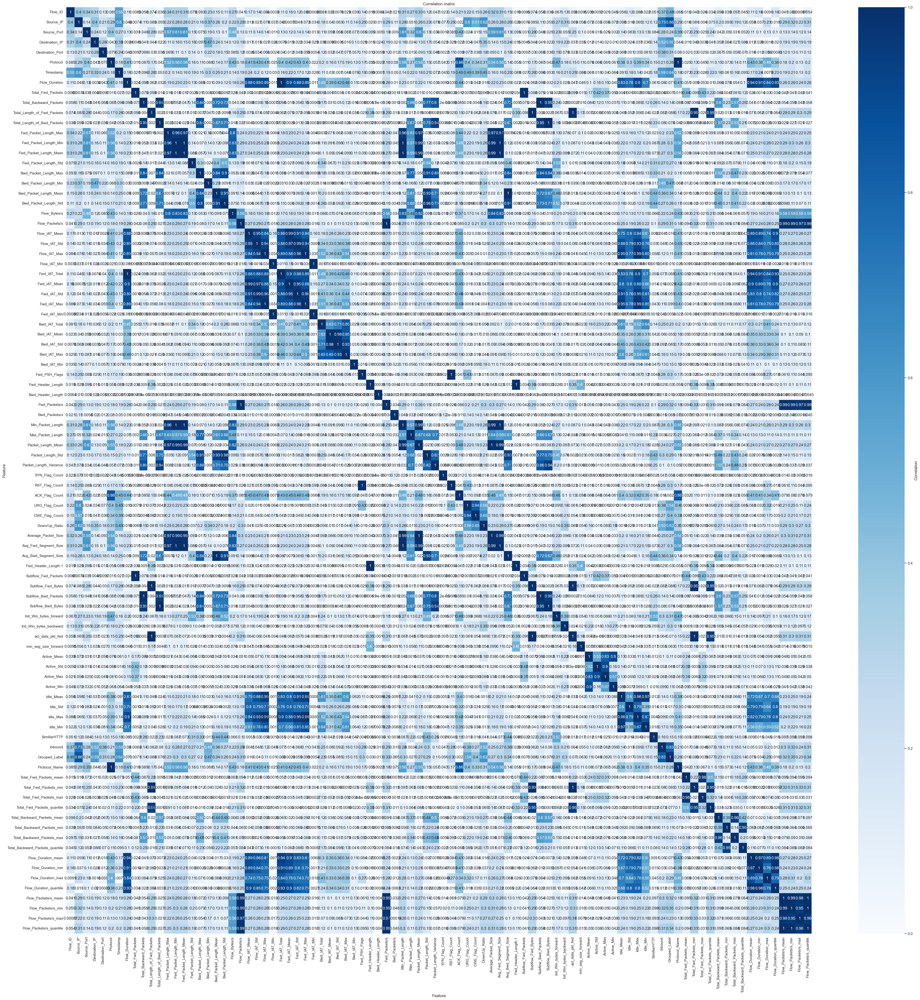

In [132]:
correlation_matrix = feature_new.corr().abs()

plt.figure(figsize=(50,50))
sns.heatmap(correlation_matrix, cmap='Blues', annot=True, vmin=.0, vmax=1, cbar_kws={'label':'Correlation'})

plt.xlabel('Feature')
plt.ylabel('Feature')
plt.title('Correlation matrix')

In [133]:
# Extract features having a correlation > 0.8
c = correlation_matrix[correlation_matrix > 0.8]
s = c.unstack()
so = s.sort_values(ascending=False).reset_index()

# Get strongly correlatead features, removing pairs having correlation = 1 because of the diagonal, i.e., correlation between one feature and itself
so = so[(so[0].isnull()==False) & (so["level_0"] != so["level_1"])]
to_be_deleted = []
candidates = list(so["level_0"])

# Get the unique set of features to be deleted
# Notice that we discard one feature per time considering the case where a feature is strongly correlated with multiple features
subset_so = so
for candidate in candidates:
    if (candidate in list(subset_so["level_0"])): 
        to_be_deleted.append(candidate) # add the feature to the removed candidates
        subset_so = subset_so[(subset_so["level_0"] != candidate) & (subset_so["level_1"] != candidate)] # remove the rows that the removed feature is involved

print(len(to_be_deleted), 'features to be removed')

53 features to be removed


In [134]:
newdf = feature_new.copy()
newdf = newdf.drop(columns=to_be_deleted)
newdf

,Flow_ID,Source_IP,Source_Port,Destination_IP,Destination_Port,Timestamp,Total_Fwd_Packets,Fwd_Packet_Length_Max,Fwd_Packet_Length_Std,Bwd_Packet_Length_Max,...,Idle_Min,SimillarHTTP,Inbound,Total_Fwd_Packets_max,Total_Fwd_Packets_quantile,Total_Backward_Packets_mean,Total_Backward_Packets_min,Flow_Duration_min,Flow_Duration_max,Flow_Packets/s_max
0,0.269683,-0.294846,-0.996890,-0.156273,1.463534,-0.981207,0.169121,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.038928,1.675266,-0.086732,-0.056847,-0.204912,-0.273600,-1.180782
1,-0.202971,2.322551,-0.996890,-2.966318,1.463534,-0.981205,-0.036372,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,-3.381206,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,-0.074012
2,0.214301,-0.294846,-0.996890,-0.156273,0.770389,-0.981198,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203933,-0.272839,-1.179998
3,0.087634,-0.294846,-0.996890,-0.156273,-0.924976,-0.981189,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203944,-0.272847,-1.179978
4,0.146771,-0.294846,-0.996890,-0.156273,-0.139438,-0.981176,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.204737,-0.273463,-1.177637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,-1.202225,-0.294846,0.540571,-0.156273,1.589149,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64235,-0.289219,-0.294846,1.350236,-0.156273,-0.577568,0.942099,-0.027720,-0.377323,0.521580,-0.069596,...,-0.194882,-0.086584,0.295752,-0.024347,-0.189023,-0.086732,-0.056847,-0.195974,-0.266653,-1.184541
64236,-0.848784,-0.294846,0.843239,-0.156273,1.670387,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64237,-0.187013,-0.294846,1.433360,-0.156273,-0.996433,0.942099,-0.032046,-0.384152,0.501315,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.200996,-0.270556,-1.184532


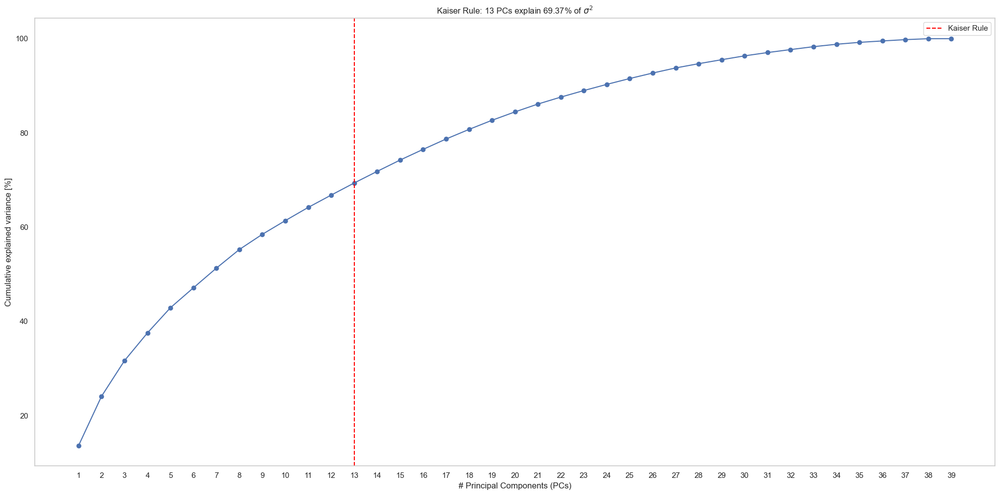

In [135]:
pca = PCA(random_state=15)
pca.fit(newdf)
explained_variance = pca.explained_variance_
cumul_exp_var = np.cumsum(explained_variance)
perc_cumul_exp_var = cumul_exp_var / np.sum(explained_variance) * 100

# Find the number of principal components using Kaiser's rule (eigenvalues > 1)
num_pcs_kaiser = np.sum(explained_variance > 1)

plt.figure(figsize=(20, 10))
plt.plot(perc_cumul_exp_var, marker='o')
plt.axvline(x=num_pcs_kaiser - 1, color='red', linestyle='--', label='Kaiser Rule')
plt.xlabel('# Principal Components (PCs)')
plt.xticks([i for i in range(39)], [i for i in range(1,40)])
plt.ylabel('Cumulative explained variance [%]')
plt.grid()

plt.title(f'Kaiser Rule: {num_pcs_kaiser} PCs explain {round(perc_cumul_exp_var[num_pcs_kaiser - 1], 2)}% of $\sigma^2$')
plt.legend()

plt.tight_layout()

In [136]:
pca = PCA(n_components=13, random_state=15)         # initialize PCA with 10 components
pca.fit(newdf)

explained_variance = pca.explained_variance_ratio_  # Get the explained variance 
cumul_exp_var = np.cumsum(explained_variance)       # Get the cumulative explained variance
perc_cumul_exp_var = cumul_exp_var*100              # Get the percentages
print(perc_cumul_exp_var[-1])

# Transform the dataset
pca_result = pca.transform(newdf)
pca_result = pd.DataFrame(pca_result, columns=[f'PC{i}' for i in range(13)])

69.36283666328129


In [137]:
pca_result['label'] = df_label['label']
display(pca_result)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,label
0,-0.497853,0.269008,-0.439555,1.166305,1.228420,-0.307081,-0.732815,-0.038035,-0.688656,-1.694481,0.303062,-0.560213,0.073780,ddos_dns
1,0.655276,0.969196,-0.648095,0.817083,-0.541430,0.810247,-0.667882,-0.671754,0.311623,-0.617925,0.399022,-0.486882,0.008768,ddos_dns
2,-0.386542,0.301398,-0.447756,1.827595,2.234631,-0.592570,-0.789255,-0.102392,-0.683072,-2.283051,0.413974,-0.589844,0.082962,ddos_dns
3,-0.128647,0.381430,-0.488267,1.714469,2.294606,-0.783261,-0.465710,-0.080441,-0.351211,-2.285381,0.480134,-0.369371,0.043932,ddos_dns
4,-0.248949,0.345304,-0.469305,1.766458,2.266301,-0.694298,-0.615081,-0.090982,-0.504646,-2.283123,0.449195,-0.471461,0.062002,ddos_dns
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,-1.361482,-0.869139,-0.444776,-0.696592,-0.028630,0.871675,-0.156956,0.019440,0.239505,0.445714,-0.125247,-0.266798,0.035068,ddos_udp_lag
64235,-0.093106,-0.950849,-0.748264,-0.832519,0.710180,-0.017894,0.095121,0.075057,0.518146,-0.632305,0.375623,-0.215341,-0.001577,ddos_udp_lag
64236,-1.283930,-0.832718,-0.472793,-0.727931,-0.060833,0.863682,-0.112879,0.027254,0.261596,0.492055,-0.131645,-0.277137,0.035639,ddos_udp_lag
64237,-0.004078,-0.909629,-0.774343,-0.877218,0.693508,-0.066692,0.196309,0.089093,0.609371,-0.606519,0.386347,-0.158464,-0.012084,ddos_udp_lag


In [138]:
num_pcs = 13
loadings = pca.components_

# Display top features for each principal component
for i in range(num_pcs):
    pc_loadings = pd.DataFrame(loadings[i], index=newdf.columns, columns=[f'PC{i}_Loading'])
    pc_loadings_sorted = pc_loadings.abs().sort_values(by=f'PC{i}_Loading', ascending=False)

    print(f"Top 5 features for PC{i}:")
    print(pc_loadings_sorted.head())
    print("\n" + "="*40 + "\n")

Top 5 features for PC0:
                        PC0_Loading
Inbound                    0.338132
Source_IP                  0.328715
Down/Up_Ratio              0.274838
Init_Win_bytes_forward     0.235626
Flow_Duration_max          0.221426


Top 5 features for PC1:
                   PC1_Loading
Timestamp             0.350500
Flow_Duration_min     0.322639
ACK_Flag_Count        0.316398
Flow_ID               0.301980
Idle_Std              0.280771


Top 5 features for PC2:
                       PC2_Loading
Max_Packet_Length         0.419812
Bwd_Packet_Length_Max     0.328006
Fwd_Packet_Length_Max     0.295512
Bwd_IAT_Total             0.256811
Idle_Min                  0.240567


Top 5 features for PC3:
                            PC3_Loading
Total_Fwd_Packets_quantile     0.304814
Source_Port                    0.297509
Flow_Duration_max              0.266154
Init_Win_bytes_forward         0.264224
SimillarHTTP                   0.248379


Top 5 features for PC4:
                    

Text(0.5, 0.92, '13 PCs explain 69.36% of $\\sigma^2$ -- Training')

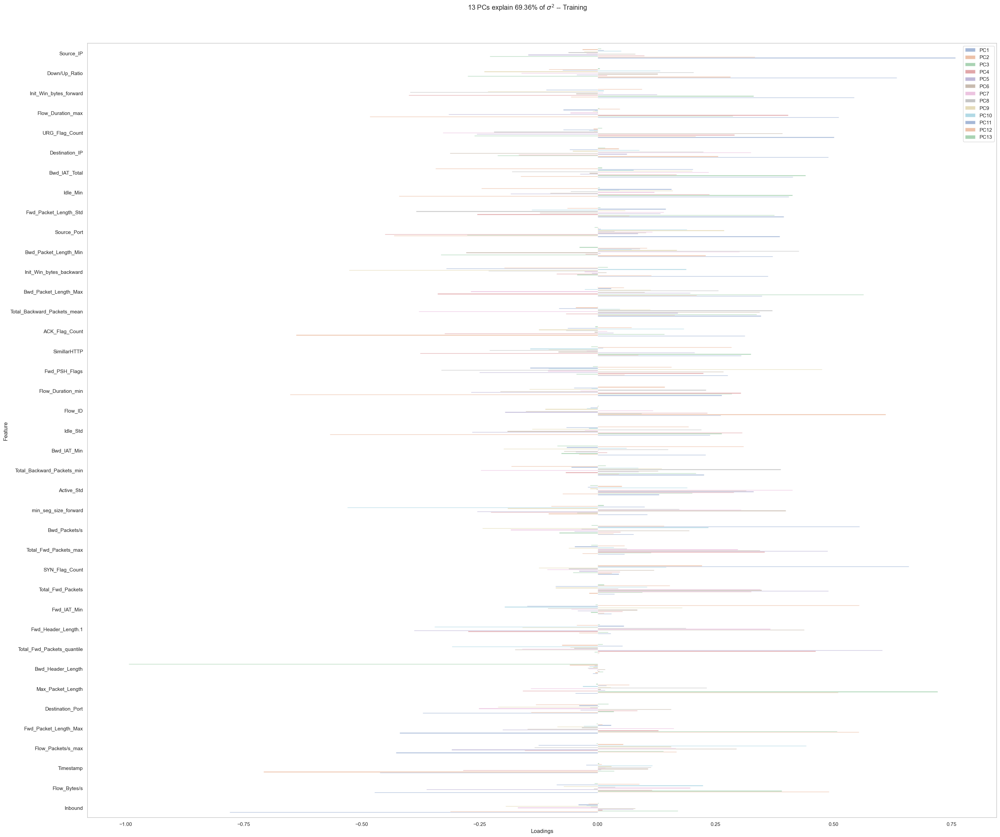

In [139]:
loadings = pd.DataFrame(
    data=pca.components_.T * np.sqrt(pca.explained_variance_),
    columns=[f'PC{i}' for i in range(1, 14)],
    index=newdf.columns
)

fig, ax = plt.subplots(figsize=(35, 30), facecolor='white')  # Specify facecolor for white background
loadings = loadings[['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13']]
loadings.sort_values(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13']).plot.barh(ax=ax, alpha=0.5)
plt.grid()

plt.xlabel('Loadings')
plt.ylabel('Feature')
plt.suptitle(f'13 PCs explain {round(perc_cumul_exp_var[12], 2)}% of $\\sigma^2$ -- Training', y=0.92)  # Adjust y position

In [140]:
print("This Dataset has {} rows and {} columns".format(newdf.shape[0], newdf.shape[1]))

This Dataset has 64239 rows and 39 columns


Text(0.5, 1.0, 'Correlation matrix')

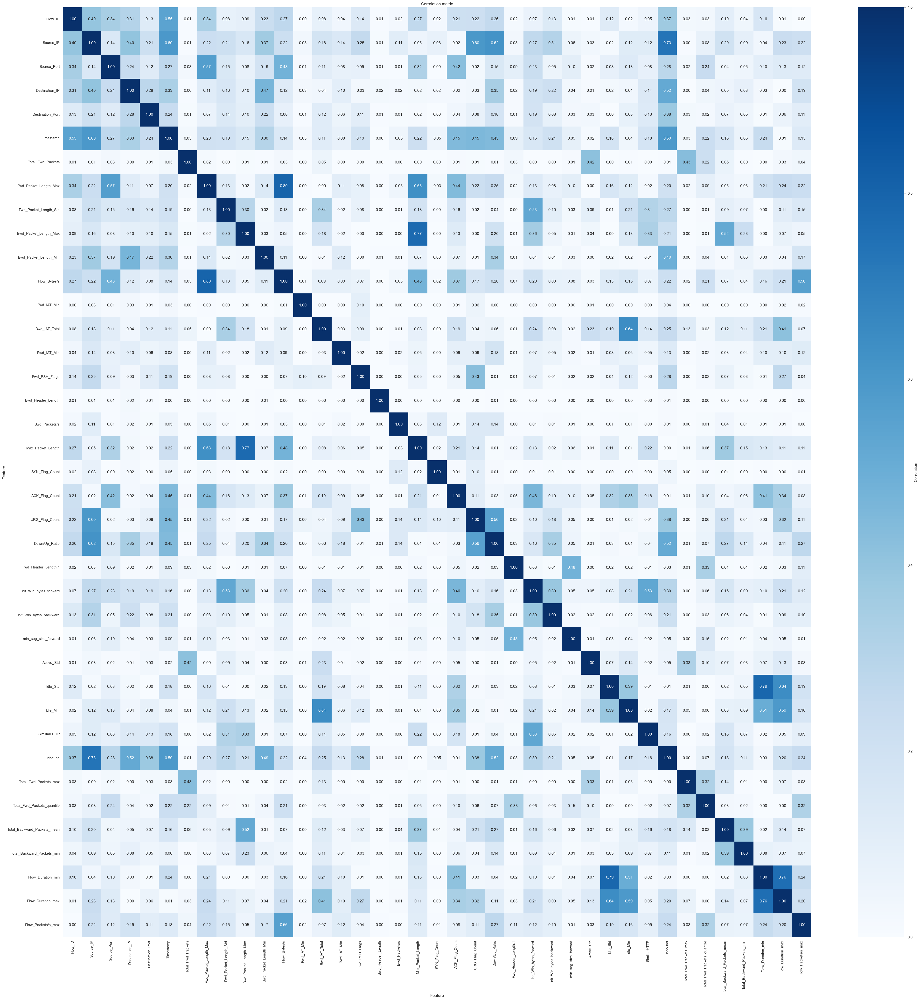

In [141]:
correlation_matrix_pca = newdf.corr().abs()

plt.figure(figsize=(50,50))
sns.heatmap(correlation_matrix_pca, cmap='Blues', annot=True, vmin=.0, vmax=1, cbar_kws={'label':'Correlation'}, fmt='.2f')
plt.xlabel('Feature')
plt.ylabel('Feature')
plt.title('Correlation matrix')

The final obtained Dataframe is:

In [142]:
newdf

,Flow_ID,Source_IP,Source_Port,Destination_IP,Destination_Port,Timestamp,Total_Fwd_Packets,Fwd_Packet_Length_Max,Fwd_Packet_Length_Std,Bwd_Packet_Length_Max,...,Idle_Min,SimillarHTTP,Inbound,Total_Fwd_Packets_max,Total_Fwd_Packets_quantile,Total_Backward_Packets_mean,Total_Backward_Packets_min,Flow_Duration_min,Flow_Duration_max,Flow_Packets/s_max
0,0.269683,-0.294846,-0.996890,-0.156273,1.463534,-0.981207,0.169121,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.038928,1.675266,-0.086732,-0.056847,-0.204912,-0.273600,-1.180782
1,-0.202971,2.322551,-0.996890,-2.966318,1.463534,-0.981205,-0.036372,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,-3.381206,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,-0.074012
2,0.214301,-0.294846,-0.996890,-0.156273,0.770389,-0.981198,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203933,-0.272839,-1.179998
3,0.087634,-0.294846,-0.996890,-0.156273,-0.924976,-0.981189,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203944,-0.272847,-1.179978
4,0.146771,-0.294846,-0.996890,-0.156273,-0.139438,-0.981176,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.204737,-0.273463,-1.177637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,-1.202225,-0.294846,0.540571,-0.156273,1.589149,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64235,-0.289219,-0.294846,1.350236,-0.156273,-0.577568,0.942099,-0.027720,-0.377323,0.521580,-0.069596,...,-0.194882,-0.086584,0.295752,-0.024347,-0.189023,-0.086732,-0.056847,-0.195974,-0.266653,-1.184541
64236,-0.848784,-0.294846,0.843239,-0.156273,1.670387,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64237,-0.187013,-0.294846,1.433360,-0.156273,-0.996433,0.942099,-0.032046,-0.384152,0.501315,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.200996,-0.270556,-1.184532


## ECDF of PC0 and PC1

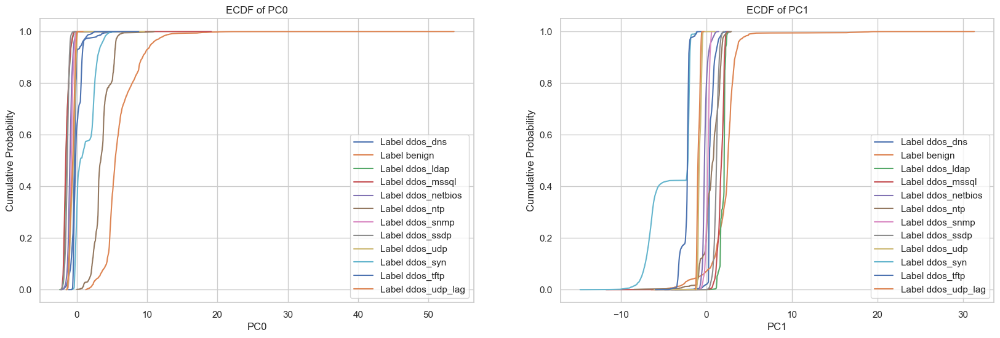

In [143]:
fig, ax = plt.subplots(1, 2 , figsize=(20, 6))

# ECDF for each label
pc_label = pca_result['label'].unique()

for label in pc_label:
    subset_data = pca_result[pca_result['label'] == label]['PC0']
    sorted_data = np.sort(subset_data)
    y = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    ax[0].plot(sorted_data, y, label=f'Label {label}')

ax[0].set_xlabel('PC0')
ax[0].set_ylabel('Cumulative Probability')
ax[0].set_title('ECDF of PC0')
ax[0].legend()


for label in pc_label:
    subset_data = pca_result[pca_result['label'] == label]['PC1']
    sorted_data = np.sort(subset_data)
    y = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    ax[1].plot(sorted_data, y, label=f'Label {label}')

ax[1].set_xlabel('PC1')
ax[1].set_ylabel('Cumulative Probability')
ax[1].set_title('ECDF of PC1')
ax[1].legend()

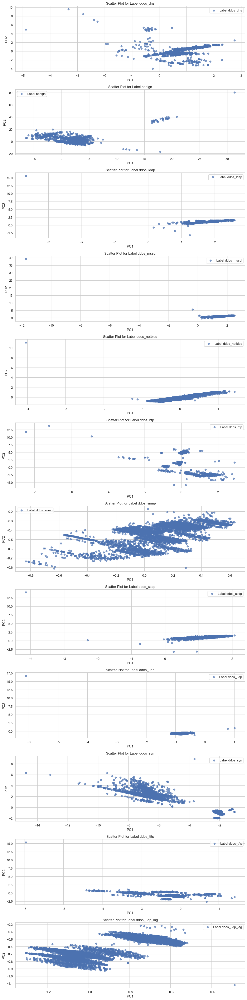

In [144]:
unique_labels = pca_result['label'].unique()
fig, axs = plt.subplots(nrows=len(unique_labels), ncols=1, figsize=(12, 4*len(unique_labels)))

for i, label in enumerate(unique_labels):
    label_df = pca_result[pca_result['label'] == label]
    axs[i].scatter(label_df['PC1'], label_df['PC2'], label=f'Label {label}', alpha=0.7)

    axs[i].set_xlabel('PC1')
    axs[i].set_ylabel('PC2')
    axs[i].set_title(f'Scatter Plot for Label {label}')
    axs[i].legend()

plt.tight_layout()

# Section 2

## Perform a split to segment the dataset into training and test dataset, in a stratified way with respect to the labels.

In [145]:
y = df_label['intLabel']
X, X_test, y, y_test = train_test_split(newdf, y, stratify=y, train_size=0.7, random_state=15)

In [146]:
X_train, X_val, y_train, y_val = train_test_split(
    X, y,
    stratify = y, 
    train_size = 0.5/0.7, 
    random_state = 15
)

## Choosing 3 ML methods
For supervised learning, the 3 following algorithms have been chosen:
- Random Forest
- K-Nearest Neighbor
- SVM 

### Random Forest

In [147]:
rf_clf = RandomForestClassifier()
rf_clf.fit(X_train, y_train)
y_train_pred_rf = rf_clf.predict(X_train)
y_val_pred_rf = rf_clf.predict(X_val)

#### Classification Report (Confusion Matrix, precision, Recall, F1-score)

Training set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2829
           1       1.00      1.00      1.00      2684
           2       1.00      1.00      1.00      2963
           3       1.00      1.00      1.00      2956
           4       1.00      1.00      1.00      2915
           5       1.00      1.00      1.00       493
           6       1.00      1.00      1.00      2992
           7       1.00      1.00      1.00      2985
           8       1.00      1.00      1.00      2740
           9       1.00      1.00      1.00      2631
          10       1.00      1.00      1.00      2938
          11       1.00      1.00      1.00      2993

    accuracy                           1.00     32119
   macro avg       1.00      1.00      1.00     32119
weighted avg       1.00      1.00      1.00     32119

Validation set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1

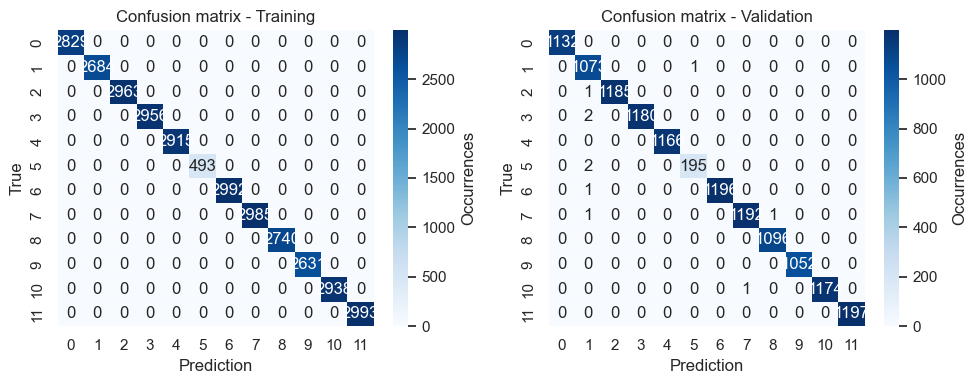

In [148]:
# classification report
print('Training set')
print(classification_report(y_train, y_train_pred_rf))
print('Validation set')
print(classification_report(y_val, y_val_pred_rf))

# get the confusion matrix & visualize the confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

confusion_train = confusion_matrix(y_train, y_train_pred_rf)
sns.heatmap(confusion_train, cmap='Blues', annot=True, ax=ax1, cbar_kws={'label':'Occurrences'}, fmt='d')
ax1.set_xlabel('Prediction')
ax1.set_ylabel('True')
ax1.set_title('Confusion matrix - Training')

confusion_val = confusion_matrix(y_val, y_val_pred_rf)
sns.heatmap(confusion_val, cmap='Blues', annot=True, ax=ax2, cbar_kws={'label':'Occurrences'}, fmt='d')
ax2.set_xlabel('Prediction')
ax2.set_ylabel('True')
ax2.set_title('Confusion matrix - Validation')

plt.tight_layout()

### K-Nearest Neighbors

In [149]:
knn_clf = KNeighborsClassifier()
knn_clf.fit(X_train, y_train)
y_train_pred_knn = knn_clf.predict(X_train)
y_val_pred_knn = knn_clf.predict(X_val)

#### Classification Report (Confusion Matrix, precision, Recall, F1-score)

Training set
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2829
           1       0.99      0.98      0.98      2684
           2       0.98      0.98      0.98      2963
           3       0.98      0.98      0.98      2956
           4       1.00      1.00      1.00      2915
           5       0.95      0.97      0.96       493
           6       1.00      1.00      1.00      2992
           7       1.00      1.00      1.00      2985
           8       0.99      0.99      0.99      2740
           9       0.99      0.99      0.99      2631
          10       1.00      1.00      1.00      2938
          11       1.00      1.00      1.00      2993

    accuracy                           0.99     32119
   macro avg       0.99      0.99      0.99     32119
weighted avg       0.99      0.99      0.99     32119

Validation set
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1

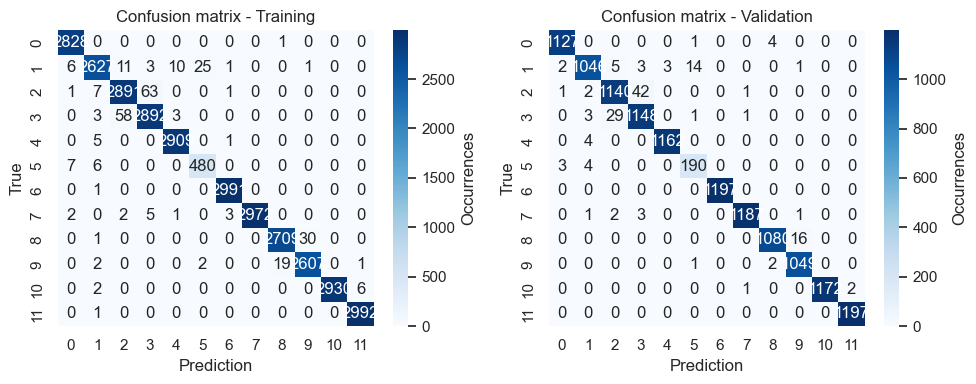

In [150]:
# classification report
print('Training set')
print(classification_report(y_train, y_train_pred_knn))
print('Validation set')
print(classification_report(y_val, y_val_pred_knn))

# get the confusion matrix & visualize the confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

confusion_train = confusion_matrix(y_train, y_train_pred_knn)
sns.heatmap(confusion_train, cmap='Blues', annot=True, ax=ax1, cbar_kws={'label':'Occurrences'}, fmt='d')
ax1.set_xlabel('Prediction')
ax1.set_ylabel('True')
ax1.set_title('Confusion matrix - Training')

confusion_val = confusion_matrix(y_val, y_val_pred_knn)
sns.heatmap(confusion_val, cmap='Blues', annot=True, ax=ax2, cbar_kws={'label':'Occurrences'}, fmt='d')
ax2.set_xlabel('Prediction')
ax2.set_ylabel('True')
ax2.set_title('Confusion matrix - Validation')

plt.tight_layout()

### SVM

In [151]:
svm_classifier = SVC()
svm_classifier.fit(X_train, y_train)
svm_train_predictions = svm_classifier.predict(X_train)
svm_val_predictions = svm_classifier.predict(X_val)

#### Classification Report (Confusion Matrix, precision, Recall, F1-score)

Training set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2829
           1       0.99      0.98      0.99      2684
           2       0.96      0.99      0.98      2963
           3       0.99      0.97      0.98      2956
           4       1.00      1.00      1.00      2915
           5       0.97      1.00      0.98       493
           6       1.00      1.00      1.00      2992
           7       1.00      1.00      1.00      2985
           8       0.96      0.98      0.97      2740
           9       0.98      0.95      0.97      2631
          10       1.00      1.00      1.00      2938
          11       1.00      1.00      1.00      2993

    accuracy                           0.99     32119
   macro avg       0.99      0.99      0.99     32119
weighted avg       0.99      0.99      0.99     32119

Validation set
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1

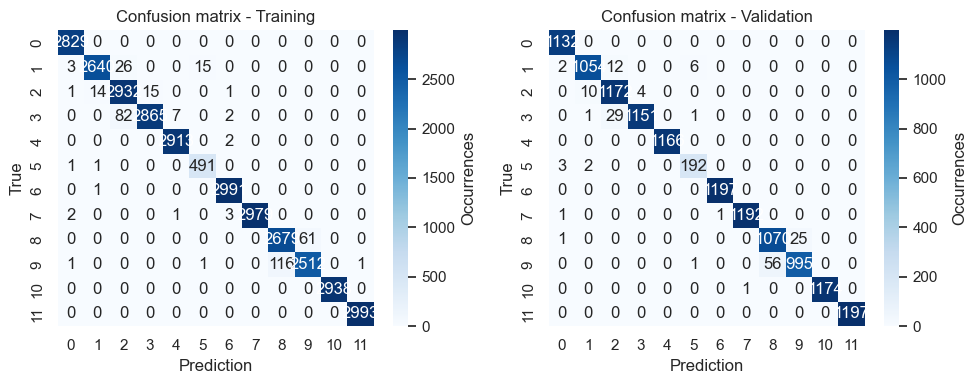

In [152]:
# classification report
print('Training set')
print(classification_report(y_train, svm_train_predictions))
print('Validation set')
print(classification_report(y_val, svm_val_predictions))

# get the confusion matrix & visualize the confusion matrix
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

confusion_train = confusion_matrix(y_train, svm_train_predictions)
sns.heatmap(confusion_train, cmap='Blues', annot=True, ax=ax1, cbar_kws={'label':'Occurrences'}, fmt='d')
ax1.set_xlabel('Prediction')
ax1.set_ylabel('True')
ax1.set_title('Confusion matrix - Training')

confusion_val = confusion_matrix(y_val, svm_val_predictions)
sns.heatmap(confusion_val, cmap='Blues', annot=True, ax=ax2, cbar_kws={'label':'Occurrences'}, fmt='d')
ax2.set_xlabel('Prediction')
ax2.set_ylabel('True')
ax2.set_title('Confusion matrix - Validation')

plt.tight_layout()

## Tune the hyper-parameters of the models through cross-validation. How do performance vary? Which model generates the best performance?

### Validation Curve for Random Forest

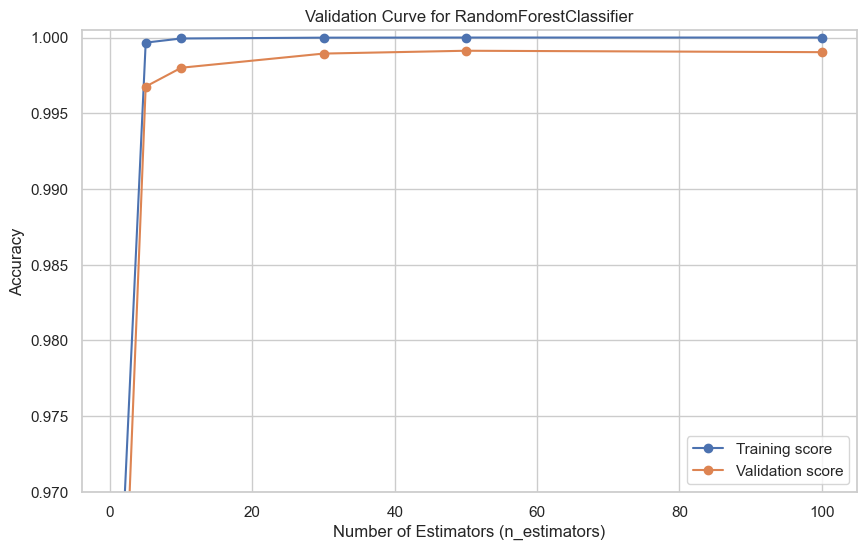

In [153]:
# Vary the number of trees (n_estimators)
param_range = [1, 5, 10, 30, 50, 100]
train_scores, val_scores = validation_curve(
    RandomForestClassifier(), X_train, y_train,
    param_name="n_estimators", param_range=param_range, cv=5
)

plt.figure(figsize=(10, 6))
plt.plot(param_range, np.mean(train_scores, axis=1), label="Training score", marker='o')
plt.plot(param_range, np.mean(val_scores, axis=1), label="Validation score", marker='o')
plt.xlabel("Number of Estimators (n_estimators)")
plt.ylabel("Accuracy")
plt.ylim(0.97, 1.0005)

plt.title("Validation Curve for RandomForestClassifier")
plt.legend()

### Validation Curve for K-Nearest Neighbors

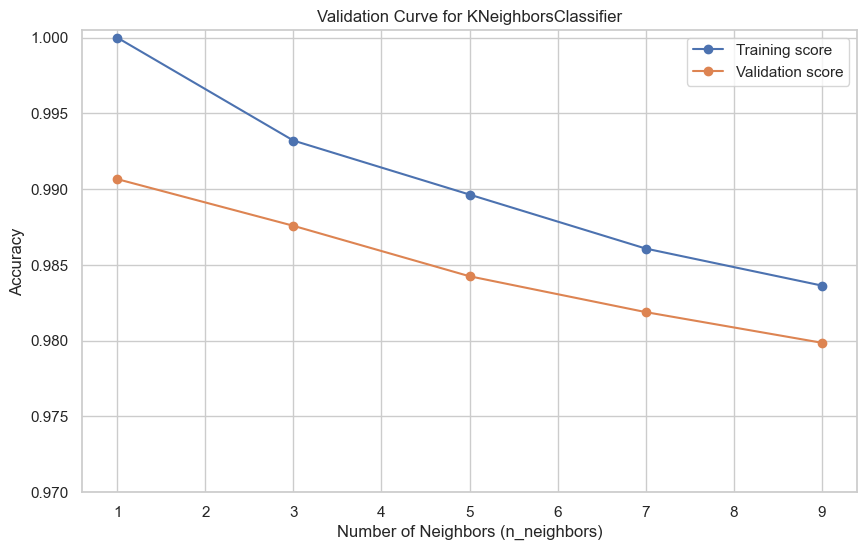

In [154]:
# Vary the number of neighbors (n_neighbors)
param_range = [1, 3, 5, 7, 9]
train_scores, test_scores = validation_curve(
    KNeighborsClassifier(), X_train, y_train,
    param_name="n_neighbors", param_range=param_range, cv=5
)

plt.figure(figsize=(10, 6))
plt.plot(param_range, np.mean(train_scores, axis=1), label="Training score", marker='o')
plt.plot(param_range, np.mean(test_scores, axis=1), label="Validation score", marker='o')
plt.xlabel("Number of Neighbors (n_neighbors)")
plt.ylabel("Accuracy")
plt.ylim(0.97, 1.0005)

plt.title("Validation Curve for KNeighborsClassifier")
plt.legend()

### Validation Curve for SVC

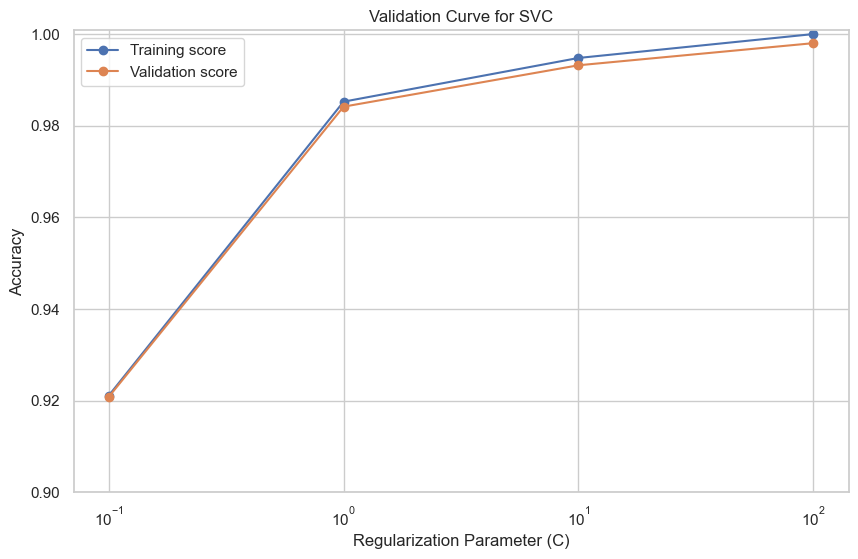

In [155]:
# Vary the regularization parameter (C)
param_range = [0.1, 1, 10, 100]
train_scores, test_scores = validation_curve(
    SVC(), X_train, y_train,
    param_name="C", param_range=param_range, cv=5
)

plt.figure(figsize=(10, 6))
plt.semilogx(param_range, np.mean(train_scores, axis=1), label="Training score", marker='o')
plt.semilogx(param_range, np.mean(test_scores, axis=1), label="Validation score", marker='o')
plt.xlabel("Regularization Parameter (C)")
plt.ylabel("Accuracy")
plt.ylim(0.90, 1.0008)

plt.title("Validation Curve for SVC")
plt.legend()

## Investigate the False Positive and False Negative.

### ROC Curve for Random Forest

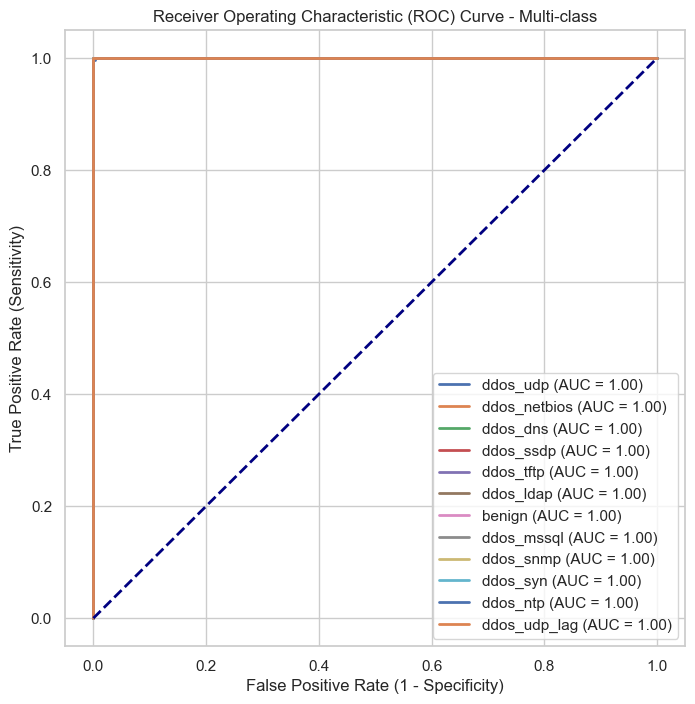

In [156]:
classes = y.unique()

# Compute ROC curve and AUC for each class
plt.figure(figsize=(8, 8))
for i in classes:
    y_true = (y_test == i).astype(int)
    y_score = rf_clf.predict_proba(X_test)[:, i]
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, lw=2, label=f'{df_label[df_label["intLabel"] == i]["label"].iloc[0]} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve - Multi-class')
plt.legend(loc='lower right')

### Feature importance analysis related to missclassifications

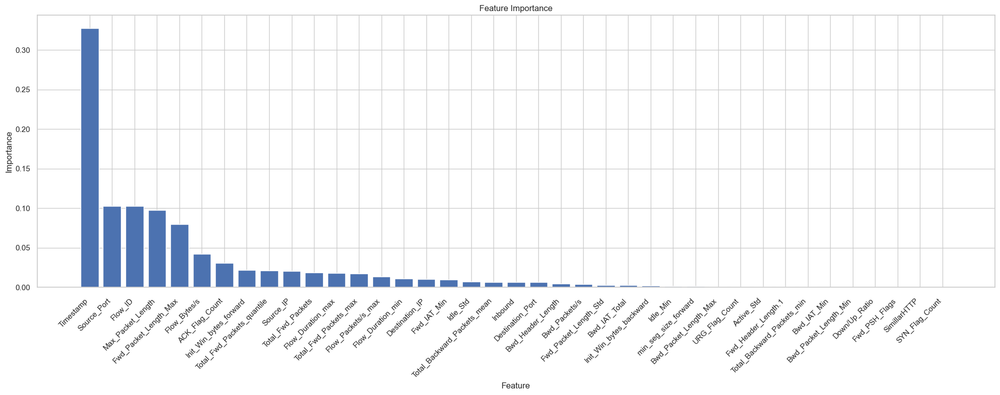

In [157]:
feature_names = newdf.columns

# Get feature importances from the trained model
feature_importances = rf_clf.feature_importances_

# Get the indices of features sorted by importance
sorted_feature_indices = np.argsort(feature_importances)[::-1]

# Get the names of features based on indices
sorted_feature_names = feature_names[sorted_feature_indices]

plt.figure(figsize=(20, 8))
plt.bar(range(X_train.shape[1]), feature_importances[sorted_feature_indices])
plt.xticks(range(X_train.shape[1]), sorted_feature_names, rotation=45, ha='right')
plt.tick_params(axis='x', which='major', pad=8)

plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()

### Confusion matrix of each class for Random Forest model

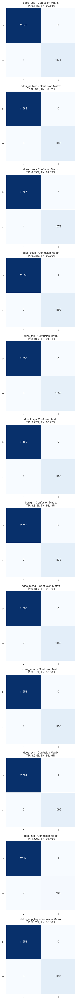

In [158]:
classes = y.unique()
sns.set(style="whitegrid")

# Plot confusion matrix for each class on a separate line
plt.figure(figsize=(15, 5 * len(classes)))
for i, class_name in enumerate(classes, 1):
    plt.subplot(len(classes), 1, i)
    
    # Create a binary confusion matrix for the current class
    y_true_binary = (y_val == class_name).astype(int)
    y_pred_binary = (y_val_pred_rf == class_name).astype(int)
    
    cm = confusion_matrix(y_true_binary, y_pred_binary)
    
    # Calculate TP, TN, FP, FN
    tp = cm[1, 1] if cm.shape == (2, 2) else 0
    tn = cm[0, 0] if cm.shape == (2, 2) else cm[0, 0] + cm[1, 1]
    fp = cm[0, 1] if cm.shape == (2, 2) else 0
    fn = cm[1, 0] if cm.shape == (2, 2) else 0
    
    # Calculate percentage of TP and TN
    total_samples = len(y_val)
    tp_percentage = (tp / total_samples) * 100
    tn_percentage = (tn / total_samples) * 100
    
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, square=True, linewidths=0.5)
    plt.title(f'{df_label[df_label["intLabel"] == class_name]["label"].iloc[0]} - Confusion Matrix\nTP: {tp_percentage:.2f}%, TN: {tn_percentage:.2f}%', fontsize=12)

plt.tight_layout()

### Classification report for Test Data (Random Forest)

In [159]:
rf_final = RandomForestClassifier(n_estimators=10, random_state=0)
rf_final.fit(X, y)

y_pred = rf_final.predict(X_test)

# Classification report
classification_report(y_test, y_pred)

'              precision    recall  f1-score   support\n\n           0       1.00      1.00      1.00      1697\n           1       1.00      1.00      1.00      1611\n           2       1.00      1.00      1.00      1779\n           3       1.00      1.00      1.00      1773\n           4       1.00      1.00      1.00      1749\n           5       0.99      1.00      0.99       296\n           6       1.00      1.00      1.00      1795\n           7       1.00      1.00      1.00      1791\n           8       1.00      1.00      1.00      1644\n           9       1.00      1.00      1.00      1578\n          10       1.00      1.00      1.00      1763\n          11       1.00      1.00      1.00      1796\n\n    accuracy                           1.00     19272\n   macro avg       1.00      1.00      1.00     19272\nweighted avg       1.00      1.00      1.00     19272\n'

#### Confusion Matrix

Text(0.5, 1.0, 'Confusion matrix')

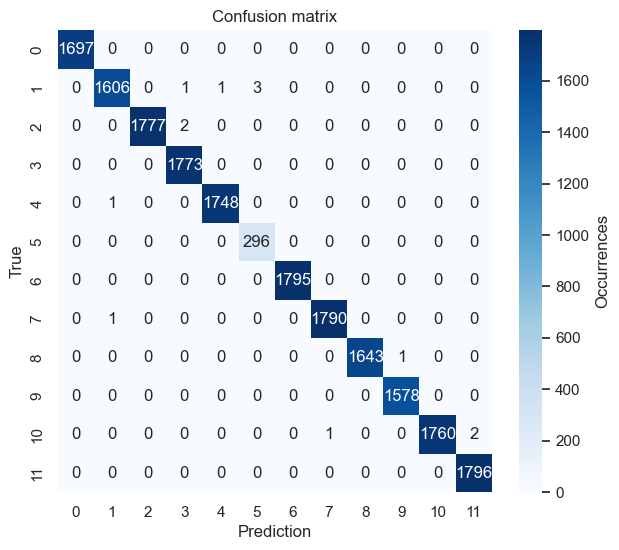

In [160]:
# get the confusion matrix of test set
confusion = confusion_matrix(y_test, y_pred)

# visualize the confusion matrix
plt.figure(figsize=(7,6))
sns.heatmap(confusion, cmap='Blues', annot=True, cbar_kws={'label':'Occurrences'}, fmt='d')

plt.xlabel('Prediction')
plt.ylabel('True')
plt.title('Confusion matrix')

# SECTION 3

In [161]:
display(newdf)

newdf_cluster = newdf.copy()
features_cluster = newdf_cluster.columns    # the dataset containing only the features
y = df_label['label'].values                # the labels of our dataset
y_int = df_label['intLabel'].values         # the encoded labels for permitting computation

,Flow_ID,Source_IP,Source_Port,Destination_IP,Destination_Port,Timestamp,Total_Fwd_Packets,Fwd_Packet_Length_Max,Fwd_Packet_Length_Std,Bwd_Packet_Length_Max,...,Idle_Min,SimillarHTTP,Inbound,Total_Fwd_Packets_max,Total_Fwd_Packets_quantile,Total_Backward_Packets_mean,Total_Backward_Packets_min,Flow_Duration_min,Flow_Duration_max,Flow_Packets/s_max
0,0.269683,-0.294846,-0.996890,-0.156273,1.463534,-0.981207,0.169121,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.038928,1.675266,-0.086732,-0.056847,-0.204912,-0.273600,-1.180782
1,-0.202971,2.322551,-0.996890,-2.966318,1.463534,-0.981205,-0.036372,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,-3.381206,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,-0.074012
2,0.214301,-0.294846,-0.996890,-0.156273,0.770389,-0.981198,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203933,-0.272839,-1.179998
3,0.087634,-0.294846,-0.996890,-0.156273,-0.924976,-0.981189,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203944,-0.272847,-1.179978
4,0.146771,-0.294846,-0.996890,-0.156273,-0.139438,-0.981176,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.204737,-0.273463,-1.177637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,-1.202225,-0.294846,0.540571,-0.156273,1.589149,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64235,-0.289219,-0.294846,1.350236,-0.156273,-0.577568,0.942099,-0.027720,-0.377323,0.521580,-0.069596,...,-0.194882,-0.086584,0.295752,-0.024347,-0.189023,-0.086732,-0.056847,-0.195974,-0.266653,-1.184541
64236,-0.848784,-0.294846,0.843239,-0.156273,1.670387,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64237,-0.187013,-0.294846,1.433360,-0.156273,-0.996433,0.942099,-0.032046,-0.384152,0.501315,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.200996,-0.270556,-1.184532


## Data distribution by means of 2 PCs

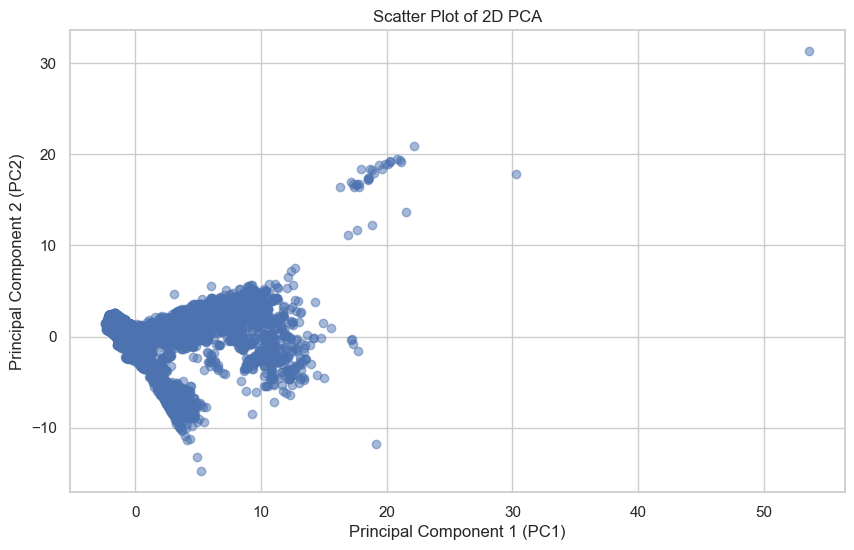

In [162]:
#2D PCA
pca = PCA(n_components=2)
projection = pca.fit_transform(newdf_cluster)
projection = pd.DataFrame(projection, columns=['PC1', 'PC2'])

plt.figure(figsize=(10, 6))
plt.scatter(projection['PC1'], projection['PC2'], alpha=0.5)
plt.title('Scatter Plot of 2D PCA')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.grid(True)

## K-MEANS

In [163]:
kmeans = KMeans(n_clusters=12, init='random', random_state=None, n_init=10) #let's start from 12 clusters because it is the number of labels
kmeans.fit(newdf_cluster)

print('The clustered labels are:\n', kmeans.labels_)
print('\nThe centroids are:\n', kmeans.cluster_centers_)

The clustered labels are:
 [2 3 2 ... 3 8 3]

The centroids are:
 [[ 5.38245006e-01 -2.89025155e-01 -9.17217192e-01 -1.59840228e-01
   1.06533924e-01 -7.69322496e-02 -3.62469228e-02  1.42377867e+00
  -1.71161114e-01 -6.95963104e-02 -1.46260845e-01  4.28735680e-01
  -9.50619005e-03 -1.12383517e-01 -1.13509549e-01 -9.60313477e-02
   3.94220350e-03 -4.49658564e-02  8.69984853e-01 -2.43288120e-02
  -4.85071250e-01 -2.23637968e-01 -2.65523166e-01  8.94899531e-02
  -2.66311118e-01 -1.02881329e-01 -1.20069868e-01 -3.16756569e-02
  -1.65076328e-01 -1.93470059e-01 -8.65837494e-02  2.88053194e-01
  -2.70686813e-02 -2.69691398e-01 -8.66966633e-02 -5.68469653e-02
  -2.05872157e-01 -2.72273343e-01 -2.69206208e-01]
 [ 1.84072287e-01 -2.93234128e-01 -9.96607623e-01 -1.56249192e-01
  -6.98045663e-01 -9.42443715e-01  3.75899805e-01 -2.97453050e-01
  -8.03994584e-02 -6.95963104e-02 -1.46260845e-01 -7.64266429e-01
  -1.40345490e-02 -1.12383517e-01 -1.13607529e-01 -9.60313477e-02
   3.94220302e-03 -4.4977

In [164]:
# Explicitly set n_init to avoid the warning
n_init_value = 10

# k-Means with n_clusters=12
kmeans = KMeans(n_clusters=12, n_init=n_init_value)
cl_labels = kmeans.fit_predict(newdf)  # Get clusters ID

# Unsupervised metric
silhouette = silhouette_score(newdf, cl_labels)

# Supervised metrics
ri = rand_score(np.ravel(y_int), cl_labels)
ari = adjusted_rand_score(np.ravel(y_int), cl_labels)

print('k-Means with 12 clusters')
(unique, counts) = np.unique(cl_labels, return_counts=True)

print("Size of each cluster: ", counts)
print(f'k_means clustering error: {round(kmeans.inertia_, 2)}')
print(f'Silhouette: {round(silhouette, 2)}')
print(f'RI: {round(ri, 2)}')
print(f'ARI: {round(ari, 2)}')

k-Means with 12 clusters
Size of each cluster:  [ 9652    27   520  2652  2323 26299   582 18892   451    17  2823     1]
k_means clustering error: 1222572.33
Silhouette: 0.31
RI: 0.78
ARI: 0.31


### Determine the number of clusters

#### Silhouette Analysis & Clustering Error

Best number of clusters (k): 2  with corresponding silhouette score: 0.5615507359075457


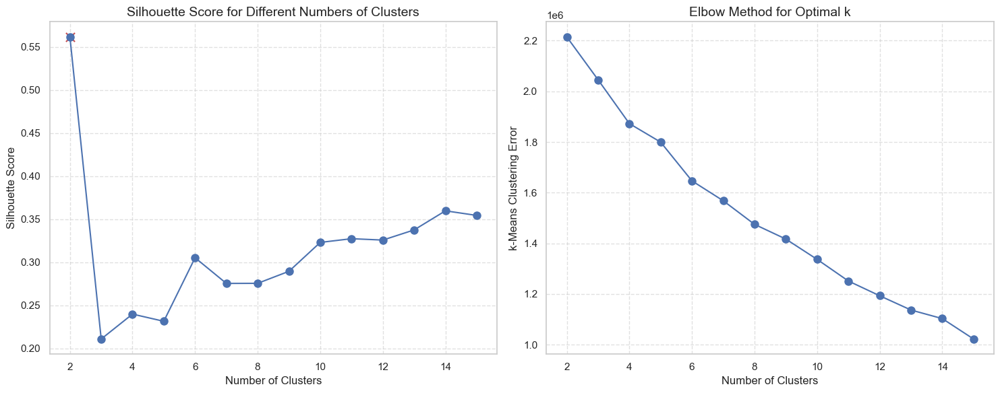

In [165]:
# Set n_init explicitly to suppress the warning
n_init_value = 10

# Initialize lists to store metrics
n_cluster_list = []
shs_list = []
ri_list = []
ari_list = []
inertia_list = []

# Loop over different values of n_clusters
for n_clusters in range(2, 16):
    kmeans = KMeans(n_clusters=n_clusters, n_init=n_init_value)
    cl_labels = kmeans.fit_predict(newdf)
    
    # Unsupervised metric
    silhouette = silhouette_score(newdf, cl_labels)
    
    # Store metrics in lists
    n_cluster_list.append(n_clusters)
    shs_list.append(silhouette)
    ri_list.append(rand_score(np.ravel(y_int), cl_labels))
    ari_list.append(adjusted_rand_score(np.ravel(y_int), cl_labels))
    inertia_list.append(kmeans.inertia_)

# Find the best number of clusters and the corresponding silhouette score
best_sh = np.max(shs_list)
best_n = n_cluster_list[np.argmax(shs_list)]

print("Best number of clusters (k):", best_n, " with corresponding silhouette score:", best_sh)

fig, axs = plt.subplots(1, 2, figsize=(15, 6))

axs[0].plot(n_cluster_list, shs_list, marker='o', markersize=8, linestyle='-', color='b')
axs[0].scatter(best_n, best_sh, color='r', marker='x', s=90)
axs[0].grid(True, linestyle='--', alpha=0.6)

axs[0].set_xlabel('Number of Clusters', fontsize=12)
axs[0].set_ylabel('Silhouette Score', fontsize=12)
axs[0].set_title('Silhouette Score for Different Numbers of Clusters', fontsize=14)

axs[1].plot(n_cluster_list, inertia_list, marker='o', markersize=8, linestyle='-', color='b')
axs[1].grid(True, linestyle='--', alpha=0.6)

axs[1].set_xlabel('Number of Clusters', fontsize=12)
axs[1].set_ylabel('k-Means Clustering Error', fontsize=12)
axs[1].set_title('Elbow Method for Optimal k', fontsize=14)

plt.tight_layout()

### Data distribution by means of 2 PCs, considering different numbers of clusters and the GT labels

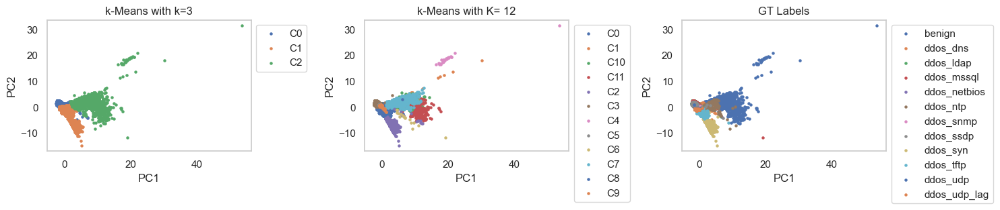

In [166]:
# From the previous analysise we set best_n as 3 because it as high Silhouette and a little bit lower Clustering Error
best_n = 3

# 2D PCA
pca = PCA(n_components=2)
projection = pca.fit_transform(newdf_cluster)
projection = pd.DataFrame(projection)

# running again k-Means with k=3 and best k to save the labels
kmeans = KMeans(n_clusters=12, n_init = n_init_value)
cl_labels = kmeans.fit_predict(newdf_cluster)
kmeans3 = KMeans(n_clusters=best_n, n_init = n_init_value)
cl_labels3 = kmeans3.fit_predict(newdf_cluster)   
    
projection['cid3'] = [f'C{x}' for x in cl_labels3]
projection['cidBest'] = [f'C{x}' for x in cl_labels]
projection['label'] = y.reshape(-1)

fig, axs = plt.subplots(1, 3, figsize=(15, 3))

for i in np.unique(projection.cid3):
    subdf = projection[projection.cid3==i]
    axs[0].scatter(subdf[0], subdf[1], label=i, s=5)
    
axs[0].grid()
lgnd = axs[0].legend(bbox_to_anchor=(1, 1), loc="upper left")
axs[0].set_xlabel('PC1')
axs[0].set_ylabel('PC2')
axs[0].set_title('k-Means with k=' + f'{best_n}')
    
for i in np.unique(projection.cidBest):
    subdf = projection[projection.cidBest==i]
    axs[1].scatter(subdf[0], subdf[1], label=i, s=5)
    
axs[1].grid()
lgnd = axs[1].legend(bbox_to_anchor=(1, 1), loc="upper left")

axs[1].set_xlabel('PC1')
axs[1].set_ylabel('PC2')
axs[1].set_title(f'k-Means with K= 12')

for i in np.unique(y):
    subdf = projection[projection.label==i]
    axs[2].scatter(subdf[0], subdf[1], label=i, s=5)
    
axs[2].grid()
lgnd = axs[2].legend(bbox_to_anchor=(1, 1), loc="upper left")
axs[2].set_xlabel('PC1')
axs[2].set_ylabel('PC2')
axs[2].set_title('GT Labels')

plt.tight_layout()

### Hyper-parameter tuning

In [167]:
best_silhouette_score = -1
best_random_state = None
best_init = None

# Explicitly set n_init to suppress the warning
n_init_value = 10

for rand_state in [0, 15, 42, 99]:
    for init_method in ['k-means++', 'random']:
        kmeans = KMeans(n_clusters=best_n, random_state=rand_state, init=init_method, n_init=n_init_value)
        kmeans.fit(newdf_cluster)
        silhouette_avg = silhouette_score(newdf_cluster, kmeans.labels_)
        
        # Check if the current combination is better than the previous best
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_random_state = rand_state
            best_init = init_method

print("best_init:", best_init)
print("best_random_state:", best_random_state)

best_init: random
best_random_state: 15


In [168]:
best_random_state_kM = best_random_state
best_init_kM = best_init

kmeans = KMeans(n_clusters=best_n, init=best_init_kM, random_state=best_random_state_kM, n_init=10)
display(kmeans.fit(newdf_cluster))

print("Sum of squared distances of the samples from their centroid: ", kmeans.inertia_)
print("Mean squared distances of the samples from their centroid: ", kmeans.inertia_/len(newdf_cluster))
print("Silhouette score of the samples: ",silhouette_score(newdf_cluster, kmeans.labels_))

KMeans(init='random', n_clusters=3, n_init=10, random_state=15)

Sum of squared distances of the samples from their centroid:  2026510.298451703
Mean squared distances of the samples from their centroid:  31.546417261347514
Silhouette score of the samples:  0.5558096048426602


### Clusters distribution with centroids

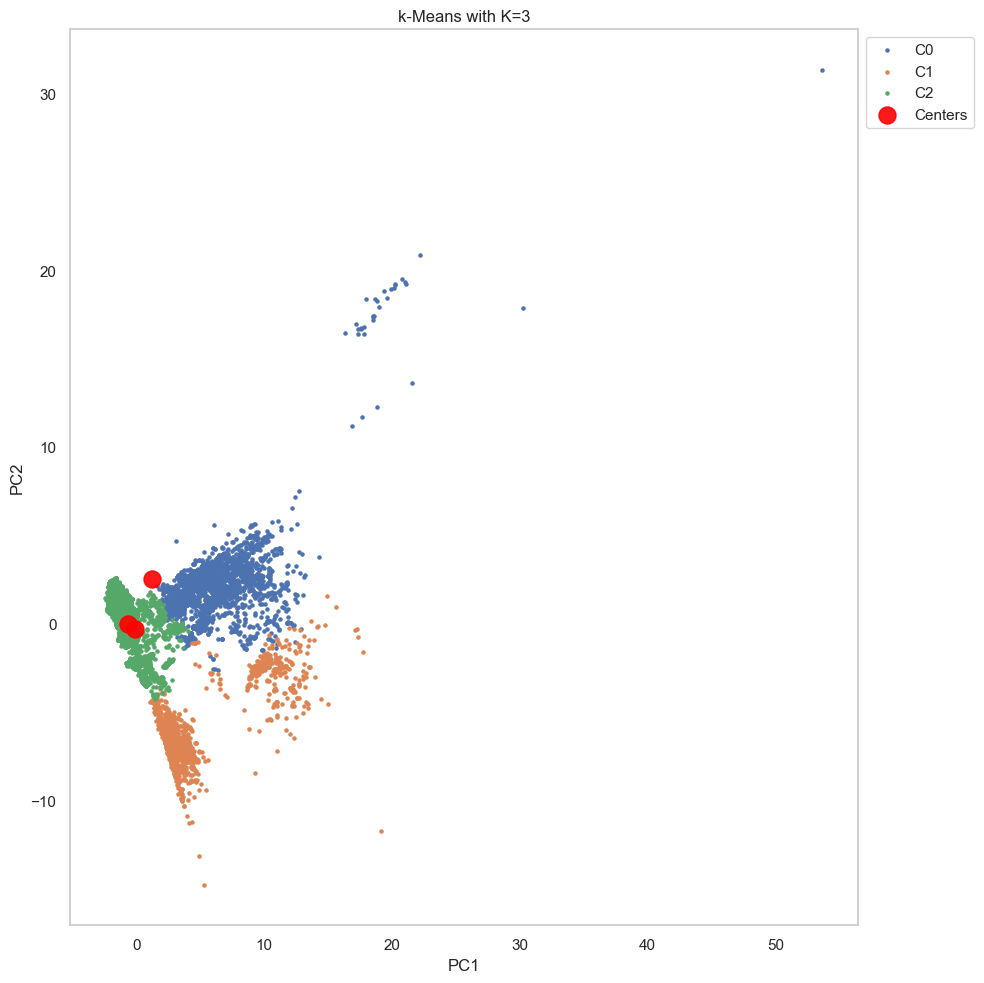

In [169]:
cl_labels = kmeans.fit_predict(newdf_cluster)
projection['cidBest'] = [f'C{x}' for x in cl_labels]

plt.figure(figsize=(10, 10))

for i in np.unique(projection.cidBest):
    subdf = projection[projection.cidBest == i]
    plt.scatter(subdf[0], subdf[1], label=i, s=5)

if kmeans.cluster_centers_ is not None:
    plt.scatter(
        kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c="red", s=150, alpha=0.9, label="Centers"
    )

plt.grid()
plt.legend(bbox_to_anchor=(1, 1), loc="upper left")
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'k-Means with K={best_n}')

plt.tight_layout()

## GMM

In [170]:
# let's start from 12 number of clusters, as the number of labels
gmm = GaussianMixture(n_components=12, init_params='kmeans')                                    
display(gmm.fit(newdf_cluster))

print('The centroids are:\n', gmm.means_)
print('\nThe covariance matrices are:\n', gmm.covariances_)
print('\nThe effective sizes are:\n', gmm.weights_, '\n')

gmm_probs = gmm.predict_proba(newdf_cluster[features_cluster])
with np.printoptions(precision=4, suppress=True): 
    print('The degrees of belonging (probabilities) for the samples are:\n', gmm_probs)
      
gmm_labels = gmm.predict(newdf_cluster[features_cluster])
print('\nThe clustered labels are:\n', gmm_labels)

GaussianMixture(n_components=12)

The centroids are:
 [[-5.55996249e-01 -2.71458241e-01  3.17423464e-01 -1.81116033e-01
   1.21316946e-01  3.28070727e-01 -3.45215727e-02 -3.99048805e-01
  -1.65930671e-02 -6.95963104e-02 -1.46260845e-01 -3.01530286e-01
  -1.40183295e-02 -1.12383517e-01 -1.13607529e-01 -9.60313477e-02
   3.94220302e-03 -4.49771014e-02 -2.94705151e-01 -2.43288120e-02
  -4.85071250e-01 -2.24105242e-01 -2.65523166e-01  9.77317947e-02
  -2.66314478e-01 -1.02881355e-01  2.02022980e-01 -3.42593532e-02
  -1.65954834e-01 -1.94881949e-01 -8.65837494e-02  2.63240516e-01
  -2.65190296e-02 -2.53230670e-01 -8.67320329e-02 -5.68469653e-02
  -2.04075171e-01 -2.72948908e-01  1.65590549e-01]
 [ 2.10004958e-01 -2.94846400e-01 -9.96680765e-01 -1.56273008e-01
   1.03443762e-01 -9.41267539e-01  5.08957126e-01 -3.00808076e-01
  -8.39534915e-02 -6.95963104e-02 -1.46260845e-01 -7.64336765e-01
  -1.40345543e-02 -7.57373179e-02 -1.11692650e-01 -9.60313477e-02
   3.94220302e-03 -4.44438315e-02 -2.31934539e-01 -2.43288120e-02
  -4.

In [171]:
print('GMM with 12 clusters')
print("Total log-likelihood score: ", gmm.score(newdf_cluster[features_cluster]) )
print("Silhouette score of the samples: ",silhouette_score(newdf_cluster[features_cluster], gmm_labels))

ri = rand_score(np.ravel(y_int), gmm_labels)
ari = adjusted_rand_score(np.ravel(y_int), gmm_labels)

print("RI between clustering and given classes is ", ri)
print("ARI between clustering and given classes is ", ari)

GMM with 12 clusters
Total log-likelihood score:  154.17217363702653
Silhouette score of the samples:  0.35377211617472
RI between clustering and given classes is  0.8199369548313098
ARI between clustering and given classes is  0.35250766079221296


### Determine the number of clusters

best k:  2  with corresponding silhouette:  0.5084628647412628


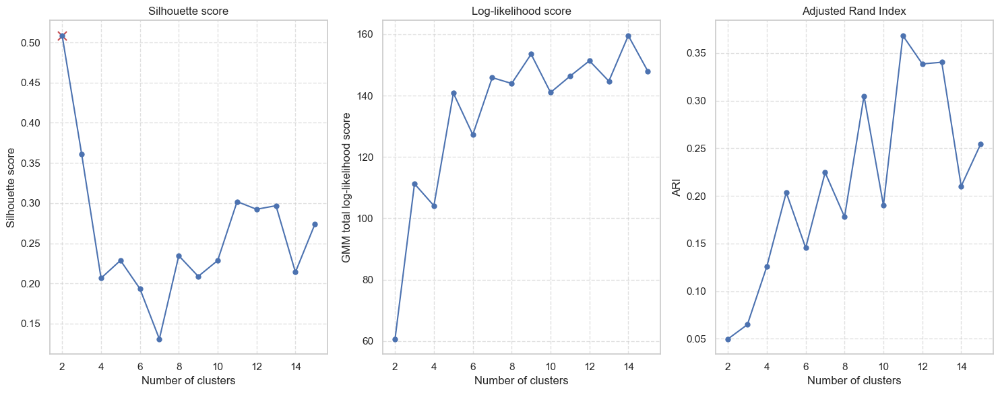

In [172]:
n_cluster_list=[]
shs_list = []
ri_list = []
ari_list = []
log_l_list=[]

for n_clusters in range(2, 16):
    gmm = GaussianMixture(n_components=n_clusters)
    cl_labels = gmm.fit_predict(newdf)
    silhouette  = silhouette_score(newdf, cl_labels)
    
    n_cluster_list.append(n_clusters)
    shs_list.append(silhouette)
    ri_list.append(rand_score(np.ravel(y_int), cl_labels))
    ari_list.append(adjusted_rand_score(np.ravel(y_int), cl_labels))
    log_l_list.append(gmm.score(newdf))

# Get n_clusters leading to the highest silhouette
best_sh= np.max(shs_list)
best_gmm=n_cluster_list[np.argmax(shs_list)]
print("best k: ",best_gmm, " with corresponding silhouette: ", best_sh)

fig, axs = plt.subplots(1, 3, figsize=(15, 6))

axs[0].plot(n_cluster_list,shs_list, marker='o', markersize=5)
axs[0].scatter(best_gmm, best_sh, color='r', marker='x', s=90)
axs[0].grid(True, linestyle='--', alpha=0.6)
axs[0].set_xlabel('Number of clusters')
axs[0].set_ylabel('Silhouette score')
axs[0].set_title('Silhouette score')

axs[1].plot(n_cluster_list,log_l_list, marker='o', markersize=5)
axs[1].grid(True, linestyle='--', alpha=0.6)
axs[1].set_xlabel('Number of clusters')
axs[1].set_ylabel('GMM total log-likelihood score')
axs[1].set_title('Log-likelihood score')

axs[2].plot(n_cluster_list,ari_list, marker='o', markersize=5)
axs[2].grid(True, linestyle='--', alpha=0.6)
axs[2].set_xlabel('Number of clusters')
axs[2].set_ylabel('ARI')
axs[2].set_title('Adjusted Rand Index')

plt.tight_layout()

### Data distribution by means of 2 PCs, considering different numbers of clusters and the GT labels

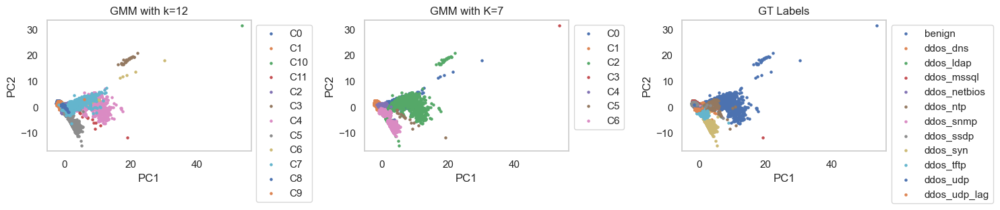

In [173]:
best_gmm = 7

# running again GMM with k=7 and best k to save the labels
gmm = GaussianMixture(n_components=12)
gmm_labels12 = gmm.fit_predict(newdf_cluster)
gmm7 = GaussianMixture(n_components=best_gmm)
gmm_labels7 = gmm7.fit_predict(newdf_cluster)   
    
projection['cid12'] = [f'C{x}' for x in gmm_labels12]
projection['cidBest'] = [f'C{x}' for x in gmm_labels7]
projection['label'] = y.reshape(-1)

fig, axs = plt.subplots(1, 3, figsize=(15, 3))

for i in np.unique(projection.cid12):
    subdf = projection[projection.cid12==i]
    axs[0].scatter(subdf[0], subdf[1], label=i, s=5)
    
axs[0].grid()
lgnd = axs[0].legend(bbox_to_anchor=(1, 1), loc="upper left")
axs[0].set_xlabel('PC1')
axs[0].set_ylabel('PC2')
axs[0].set_title('GMM with k=12')
    
for i in np.unique(projection.cidBest):
    subdf = projection[projection.cidBest==i]
    axs[1].scatter(subdf[0], subdf[1], label=i, s=5)
    
axs[1].grid()
lgnd = axs[1].legend(bbox_to_anchor=(1, 1), loc="upper left")

axs[1].set_xlabel('PC1')
axs[1].set_ylabel('PC2')
axs[1].set_title(f'GMM with K={best_gmm}')

for i in np.unique(y):
    subdf = projection[projection.label==i]
    axs[2].scatter(subdf[0], subdf[1], label=i, s=5)
    
axs[2].grid()
lgnd = axs[2].legend(bbox_to_anchor=(1, 1), loc="upper left")
axs[2].set_xlabel('PC1')
axs[2].set_ylabel('PC2')
axs[2].set_title('GT Labels')

plt.tight_layout()

### Hyper-parameter tuning

In [174]:
best_silhouette_score = -1
best_random_state = None
best_init = None

# Explicitly set n_init to suppress the warning
n_init_value = 10

for rand_state in [0, 15, 42, 99]:
    for init_method in ['k-means++', 'random']:
        gmm = GaussianMixture(n_components=best_gmm, random_state=rand_state, init_params=init_method, n_init=n_init_value)
        gmm.fit(newdf_cluster)
        silhouette_avg = silhouette_score(newdf_cluster, gmm.predict(newdf_cluster))
        
        # Check if the current combination is better than the previous best
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_random_state = rand_state
            best_init = init_method

print("best_init:", best_init)
print("best_random_state:", best_random_state)

best_init: random
best_random_state: 0


In [175]:
best_init_gmm = best_init
best_random_state_gmm = best_random_state

gmm = GaussianMixture(n_components=best_gmm, init_params=best_init_gmm, random_state=best_random_state_gmm, n_init=10)
display(gmm.fit(newdf_cluster))

ssd = gmm.score(newdf_cluster)
print("Sum of squared distances of the samples from their centroid: ", -ssd)  # GMM's score returns the log-likelihood, so negate it.

mean_ssd = -ssd / len(newdf_cluster)
print("Mean squared distances of the samples from their centroid: ", mean_ssd)

silhouette_avg = silhouette_score(newdf_cluster, gmm.predict(newdf_cluster))
print("Silhouette score of the samples: ", silhouette_avg)

GaussianMixture(init_params='random', n_components=7, n_init=10, random_state=0)

Sum of squared distances of the samples from their centroid:  -139.8859989671282
Mean squared distances of the samples from their centroid:  -0.0021775868081247867
Silhouette score of the samples:  0.41501047234039046


### Data distribution by means of 2 PCs, considering the given number of clusters

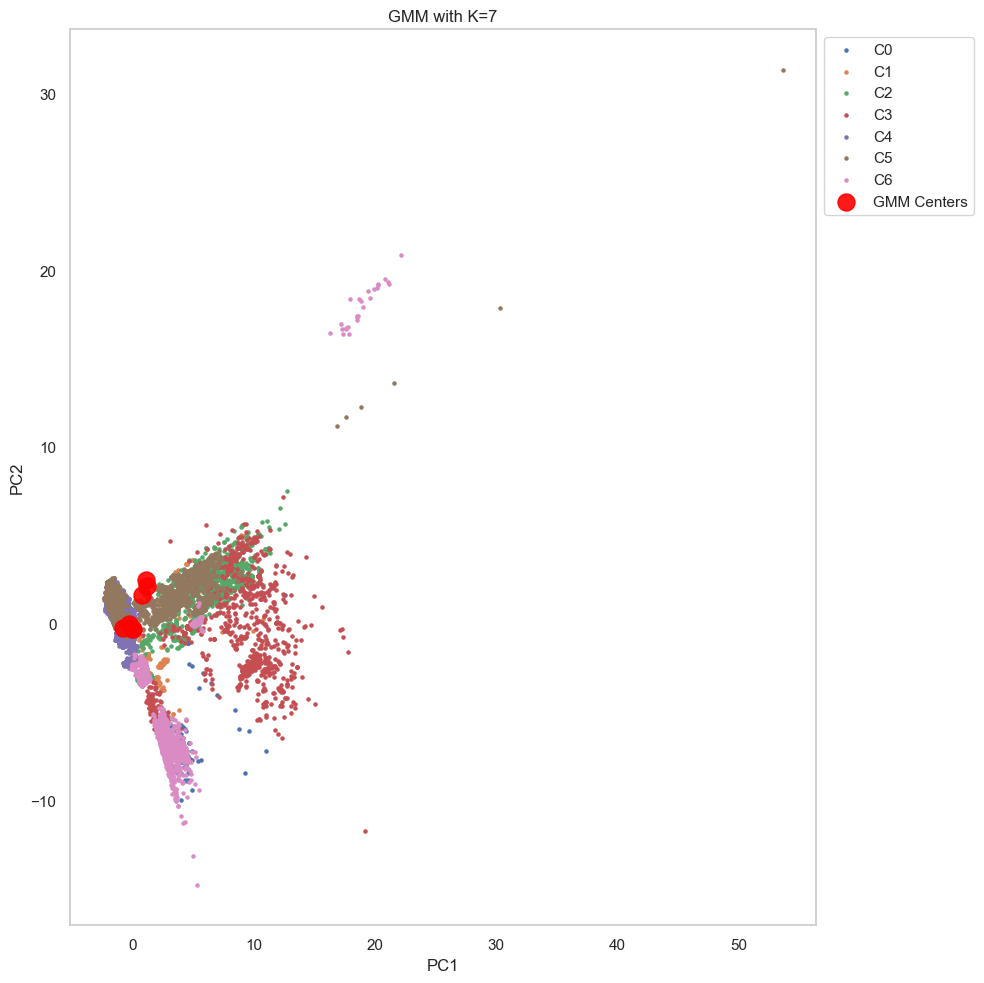

In [176]:
# Get cluster labels for each data point
gmm_labels = gmm.predict(newdf_cluster)

projection['cidBest_GMM'] = [f'C{x}' for x in gmm_labels]
plt.figure(figsize=(10, 10))

for i in np.unique(projection.cidBest_GMM):
    subdf = projection[projection.cidBest_GMM == i]
    plt.scatter(subdf[0], subdf[1], label=i, s=5)

if gmm.means_ is not None:
    plt.scatter(
        gmm.means_[:, 0], gmm.means_[:, 1], c="red", s=150, alpha=0.9, label="GMM Centers"
    )

plt.grid()
plt.legend(bbox_to_anchor=(1, 1), loc="upper left")
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'GMM with K={best_gmm}')

plt.tight_layout()

### ECDF of number of flows per Cluster

Text(0, 0.5, 'Cumulative Probability')

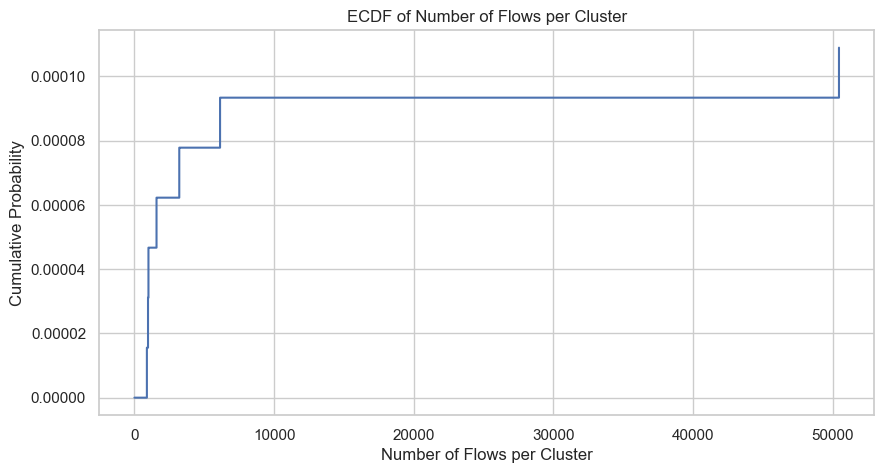

In [177]:
flows_per_cluster = [np.sum(gmm_labels == i) for i in np.unique(gmm_labels)]
ecdf = np.cumsum(np.bincount(flows_per_cluster)) / len(gmm_labels)

plt.figure(figsize=(10, 5))
plt.step(range(len(ecdf)), ecdf, where='post')
plt.title('ECDF of Number of Flows per Cluster')
plt.xlabel('Number of Flows per Cluster')
plt.ylabel('Cumulative Probability')

### Silhouette Analysis for Clusters

Text(0, 0.5, 'Cluster Label')

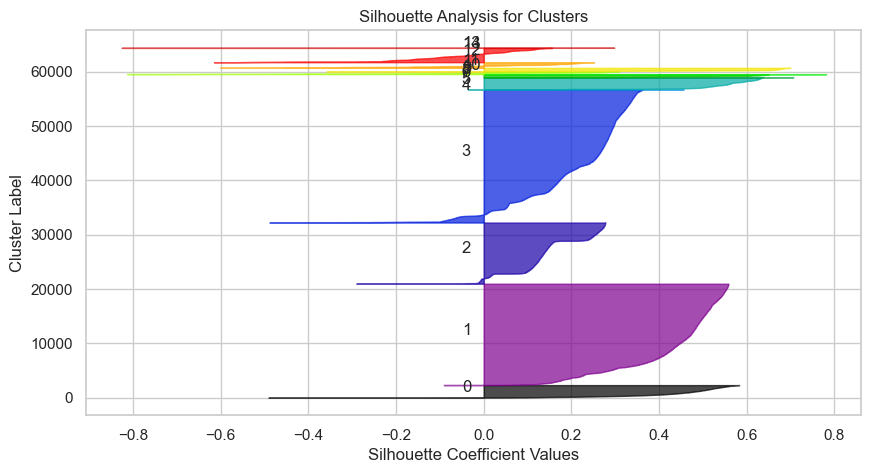

In [178]:
silhouette_avg = silhouette_score(newdf_cluster, cl_labels)
silhouette_values = silhouette_samples(newdf_cluster, cl_labels)

plt.figure(figsize=(10, 5))
y_lower = 10

for i in range(np.max(cl_labels) + 1):
    cluster_silhouette_values = silhouette_values[cl_labels == i]
    cluster_silhouette_values.sort()
    size_cluster_i = len(cluster_silhouette_values)
    
    y_upper = y_lower + size_cluster_i
    color = plt.cm.nipy_spectral(float(i) / np.max(cl_labels))
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

plt.title('Silhouette Analysis for Clusters')
plt.xlabel('Silhouette Coefficient Values')
plt.ylabel('Cluster Label')

Text(0, 0.5, 'Cluster Label')

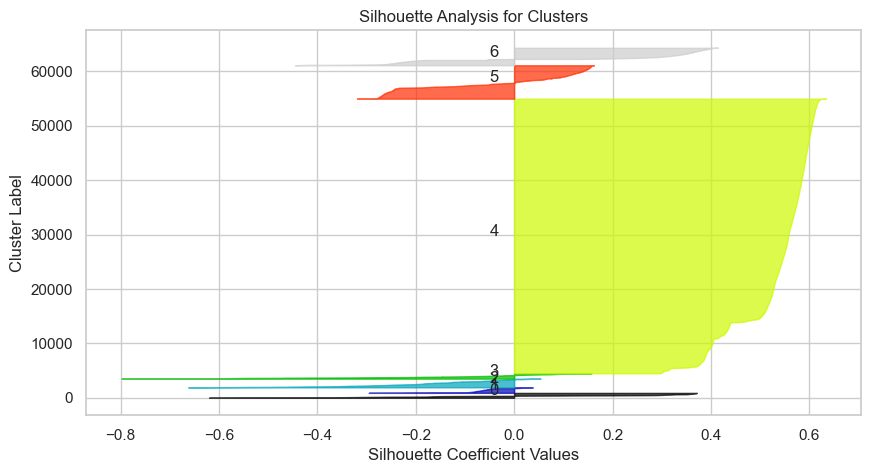

In [179]:
silhouette_avg = silhouette_score(newdf_cluster, gmm_labels)
silhouette_values = silhouette_samples(newdf_cluster, gmm_labels)

plt.figure(figsize=(10, 5))
y_lower = 10

for i in range(np.max(gmm_labels) + 1):
    cluster_silhouette_values = silhouette_values[gmm_labels == i]
    cluster_silhouette_values.sort()
    size_cluster_i = len(cluster_silhouette_values)
    
    y_upper = y_lower + size_cluster_i
    color = plt.cm.nipy_spectral(float(i) / np.max(gmm_labels))
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

plt.title('Silhouette Analysis for Clusters')
plt.xlabel('Silhouette Coefficient Values')
plt.ylabel('Cluster Label')

# Section 4

In [180]:
ari_k = adjusted_rand_score(y_int, cl_labels)
print(f"Adjusted Rand Index (k=3): {ari_k}")

nmi_k = normalized_mutual_info_score(y_int, cl_labels)
print(f"Normalized Mutual Information (k=3): {nmi_k}")

Adjusted Rand Index (k=3): 0.2543650673175264
Normalized Mutual Information (k=3): 0.5272087462984397


In [181]:
ari_gmm = adjusted_rand_score(y_int, gmm_labels)
print(f"Adjusted Rand Index (k=7 GMM): {ari_gmm}")

nmi_gmm = normalized_mutual_info_score(y_int, gmm_labels)
print(f"Normalized Mutual Information (k=7 GMM): {nmi_gmm}")

Adjusted Rand Index (k=7 GMM): 0.04574615591817277
Normalized Mutual Information (k=7 GMM): 0.2555645629681538


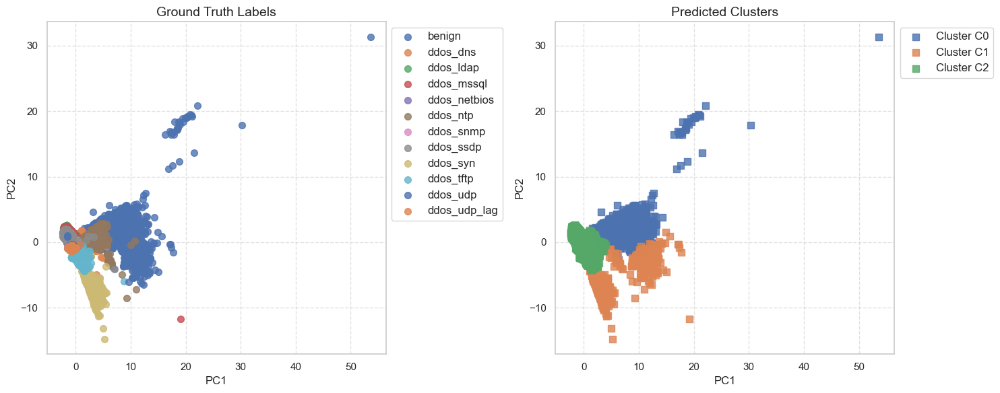

In [182]:
best_n = 3 

kmeans = KMeans(n_clusters=best_n, init='random', random_state=15, n_init=10)
cl_labels = kmeans.fit_predict(newdf_cluster)
projection['cidBest'] = [f'C{x}' for x in cl_labels]

fig, axs = plt.subplots(1, 2, figsize=(15, 6))

for label in np.unique(projection['label']):
    subdf = projection[projection['label'] == label]
    axs[0].scatter(subdf[0], subdf[1], label=f'{label}', s=50, marker='o', alpha=0.8)

axs[0].grid(True, linestyle='--', alpha=0.6)
axs[0].legend(bbox_to_anchor=(1, 1), loc="upper left", fontsize='medium')
axs[0].set_xlabel('PC1', fontsize=12)
axs[0].set_ylabel('PC2', fontsize=12)
axs[0].set_title('Ground Truth Labels', fontsize=14)

for cluster_label in np.unique(projection['cidBest']):
    subdf = projection[projection['cidBest'] == cluster_label]
    axs[1].scatter(subdf[0], subdf[1], label=f'Cluster {cluster_label}', s=50, marker='s', alpha=0.8)

axs[1].grid(True, linestyle='--', alpha=0.6)
axs[1].legend(bbox_to_anchor=(1, 1), loc="upper left", fontsize='medium')
axs[1].set_xlabel('PC1', fontsize=12)
axs[1].set_ylabel('PC2', fontsize=12)
axs[1].set_title('Predicted Clusters', fontsize=14)

plt.tight_layout()

Text(0.5, 0.98, 'ECDF of Clusters Assigned to Each Class')

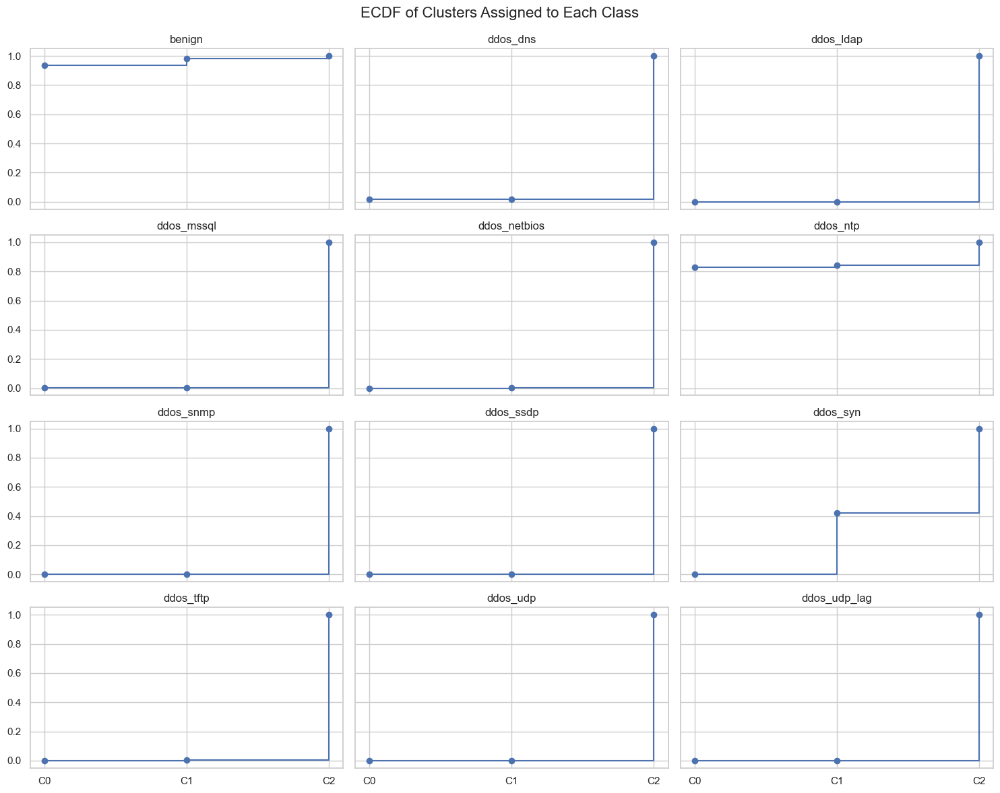

In [183]:
df_clusters = pd.DataFrame({'y': y, 'cluster': cl_labels})

# Group by ground truth labels and count the occurrences of each cluster
class_clusters_counts = df_clusters.groupby('y')['cluster'].value_counts().unstack(fill_value=0)

# Calculate the cumulative sum along columns (axis=1) to get the ECDF
ecdf = class_clusters_counts.cumsum(axis=1) / class_clusters_counts.to_numpy().sum(axis=1)[:, np.newaxis]

fig, axs = plt.subplots(4, 3, figsize=(15, 12), sharex=True, sharey=True)
axs = axs.flatten()

for i, ax in enumerate(axs):
    ax.step(ecdf.columns, ecdf.iloc[i], where='post', marker='o', label=f'Class {i + 1}')
    ax.set_title(f'{df_label[df_label["intLabel"] == i]["label"].iloc[0]}')

    ax.set_xticks(np.arange(len(ecdf.columns)))
    ax.set_xticklabels([f'C{c}' for c in range(len(ecdf.columns))])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.suptitle('ECDF of Clusters Assigned to Each Class', fontsize=16)

In [184]:
class_clusters_counts

cluster,0,1,2
y,,,
benign,5297,271,90
ddos_dns,100,5,5264
ddos_ldap,2,1,5925
ddos_mssql,1,1,5909
ddos_netbios,0,1,5829
ddos_ntp,815,14,157
ddos_snmp,0,0,5984
ddos_ssdp,3,1,5966
ddos_syn,0,2318,3162


In [185]:
# Create a DataFrame with ground truth labels and cluster labels
df_clusters = pd.DataFrame({'y': y, 'cluster': cl_labels})

# Group by ground truth labels and count the occurrences of each cluster
class_clusters_counts = df_clusters.groupby('y')['cluster'].value_counts().unstack(fill_value=0)

# Calculate the cumulative sum along columns (axis=1) to get the ECDF
ecdf = class_clusters_counts.cumsum(axis=1) / class_clusters_counts.to_numpy().sum(axis=1)[:, np.newaxis]

for i in range(len(ecdf)):
    ecdf_values = ecdf.iloc[i].values
    class_label = f'Class {i + 1}'
    ecdf_str = ', '.join([f'{cluster}: {value:.2f}' for cluster, value in zip(ecdf.columns, ecdf_values)])
    print(f'{class_label}: {ecdf_str}')

Class 1: 0: 0.94, 1: 0.98, 2: 1.00
Class 2: 0: 0.02, 1: 0.02, 2: 1.00
Class 3: 0: 0.00, 1: 0.00, 2: 1.00
Class 4: 0: 0.00, 1: 0.00, 2: 1.00
Class 5: 0: 0.00, 1: 0.00, 2: 1.00
Class 6: 0: 0.83, 1: 0.84, 2: 1.00
Class 7: 0: 0.00, 1: 0.00, 2: 1.00
Class 8: 0: 0.00, 1: 0.00, 2: 1.00
Class 9: 0: 0.00, 1: 0.42, 2: 1.00
Class 10: 0: 0.00, 1: 0.00, 2: 1.00
Class 11: 0: 0.00, 1: 0.00, 2: 1.00
Class 12: 0: 0.00, 1: 0.00, 2: 1.00


## Feature Importance Analysis

In [186]:
best_n = 3

In [187]:
clustered_data = newdf_cluster.copy()

In [188]:
clustered_data

,Flow_ID,Source_IP,Source_Port,Destination_IP,Destination_Port,Timestamp,Total_Fwd_Packets,Fwd_Packet_Length_Max,Fwd_Packet_Length_Std,Bwd_Packet_Length_Max,...,Idle_Min,SimillarHTTP,Inbound,Total_Fwd_Packets_max,Total_Fwd_Packets_quantile,Total_Backward_Packets_mean,Total_Backward_Packets_min,Flow_Duration_min,Flow_Duration_max,Flow_Packets/s_max
0,0.269683,-0.294846,-0.996890,-0.156273,1.463534,-0.981207,0.169121,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.038928,1.675266,-0.086732,-0.056847,-0.204912,-0.273600,-1.180782
1,-0.202971,2.322551,-0.996890,-2.966318,1.463534,-0.981205,-0.036372,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,-3.381206,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,-0.074012
2,0.214301,-0.294846,-0.996890,-0.156273,0.770389,-0.981198,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203933,-0.272839,-1.179998
3,0.087634,-0.294846,-0.996890,-0.156273,-0.924976,-0.981189,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203944,-0.272847,-1.179978
4,0.146771,-0.294846,-0.996890,-0.156273,-0.139438,-0.981176,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.204737,-0.273463,-1.177637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,-1.202225,-0.294846,0.540571,-0.156273,1.589149,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64235,-0.289219,-0.294846,1.350236,-0.156273,-0.577568,0.942099,-0.027720,-0.377323,0.521580,-0.069596,...,-0.194882,-0.086584,0.295752,-0.024347,-0.189023,-0.086732,-0.056847,-0.195974,-0.266653,-1.184541
64236,-0.848784,-0.294846,0.843239,-0.156273,1.670387,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64237,-0.187013,-0.294846,1.433360,-0.156273,-0.996433,0.942099,-0.032046,-0.384152,0.501315,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.200996,-0.270556,-1.184532


In [189]:
! git clone https://github.com/YousefGh/kmeans-feature-importance.git
! mv "./kmeans-feature-importance/kmeans_interp/" "."
! pip install -r "kmeans-feature-importance/requirements.txt"

fatal: destination path 'kmeans-feature-importance' already exists and is not an empty directory.
mv: cannot move './kmeans-feature-importance/kmeans_interp/' to './kmeans_interp': Directory not empty


  Using cached scikit-learn-0.24.2.tar.gz (7.5 MB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'error'


DEPRECATION: Loading egg at c:\python311\lib\site-packages\vboxapi-1.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
  error: subprocess-exited-with-error
  
  Preparing metadata (pyproject.toml) did not run successfully.
  exit code: 1
  
  [62 lines of output]
  <string>:17: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  Partial import of sklearn during the build process.
  <string>:116: DeprecationWarning:
  
    `numpy.distutils` is deprecated since NumPy 1.23.0, as a result
    of the deprecation of `distutils` itself. It will be removed for
    Python >= 3.12. For older Python versions it will remain present.
    It is recommended to use `setuptools < 60.0` for those Python versions.
    For more details, see:
      https://numpy.org/devdocs/reference/d

In [190]:
kms = KMeansInterp(n_clusters=best_n, 
                   random_state=15, 
                   init = 'random',
                   n_init = 10,
                   ordered_feature_names = clustered_data.columns,
                   feature_importance_method='wcss_min',
                  ).fit(clustered_data)

labels = kms.labels_
clustered_data['cluster']=labels

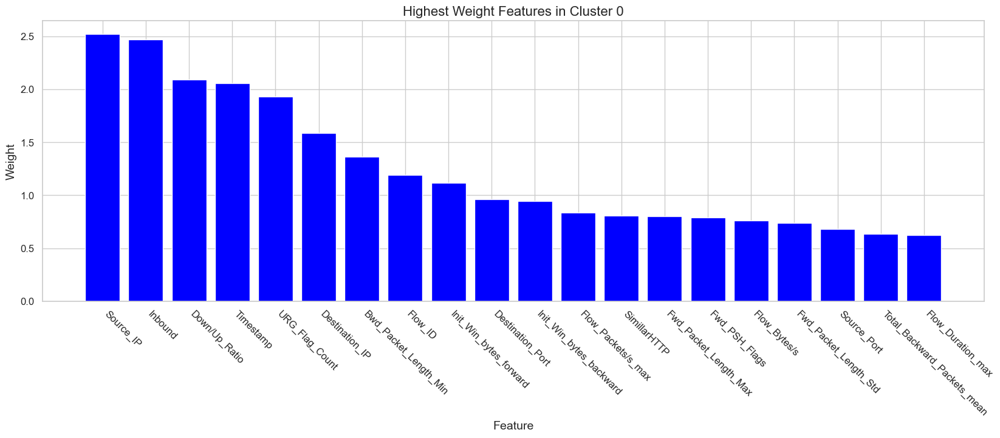

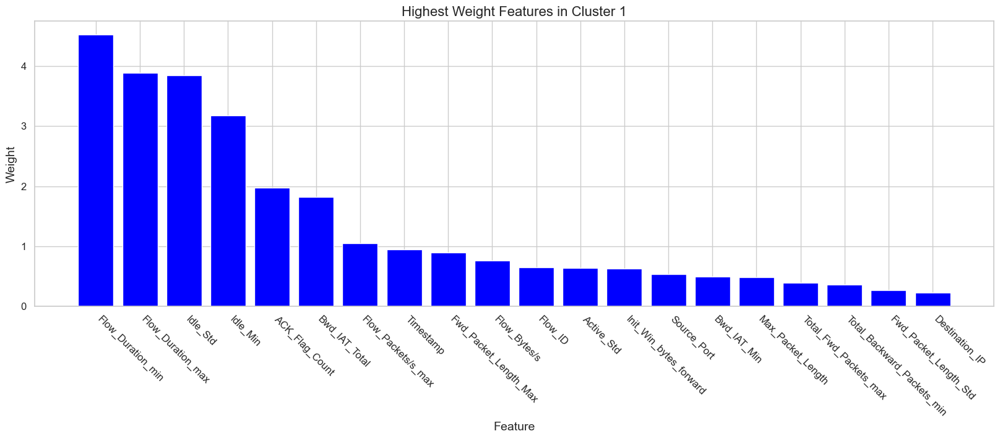

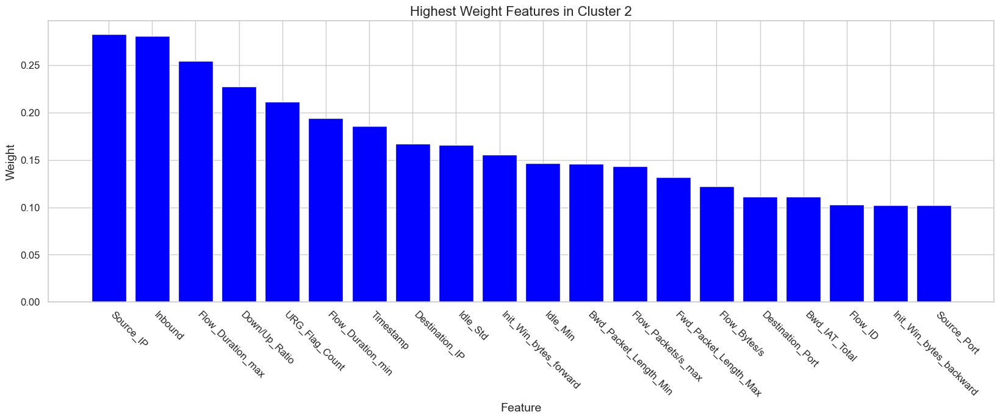

In [191]:
for cluster_label, feature_weights in kms.feature_importances_.items():    
    df_feature_weight = pd.DataFrame(feature_weights[:20], columns=["Feature", "Weight"])
    fig, ax = plt.subplots(figsize=(20, 6))
    
    features = df_feature_weight["Feature"]
    weights = df_feature_weight["Weight"]
    
    ax.bar(features, weights, color='blue')
    
    plt.xticks(rotation=-45, ha="left")
    ax.tick_params(axis='both', which='major', labelsize=12)
    plt.title(f'Highest Weight Features in Cluster {cluster_label}', fontsize=16)
    plt.xlabel('Feature', fontsize=14)
    plt.ylabel('Weight', fontsize=14)

### Sub-Attack analysis (sub-cluster two)

In [192]:
cluster_subAttack = clustered_data[clustered_data['cluster'] == 2].drop(columns='cluster')

In [193]:
cluster_subAttack

,Flow_ID,Source_IP,Source_Port,Destination_IP,Destination_Port,Timestamp,Total_Fwd_Packets,Fwd_Packet_Length_Max,Fwd_Packet_Length_Std,Bwd_Packet_Length_Max,...,Idle_Min,SimillarHTTP,Inbound,Total_Fwd_Packets_max,Total_Fwd_Packets_quantile,Total_Backward_Packets_mean,Total_Backward_Packets_min,Flow_Duration_min,Flow_Duration_max,Flow_Packets/s_max
0,0.269683,-0.294846,-0.996890,-0.156273,1.463534,-0.981207,0.169121,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.038928,1.675266,-0.086732,-0.056847,-0.204912,-0.273600,-1.180782
1,-0.202971,2.322551,-0.996890,-2.966318,1.463534,-0.981205,-0.036372,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,-3.381206,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,-0.074012
2,0.214301,-0.294846,-0.996890,-0.156273,0.770389,-0.981198,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203933,-0.272839,-1.179998
3,0.087634,-0.294846,-0.996890,-0.156273,-0.924976,-0.981189,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203944,-0.272847,-1.179978
4,0.146771,-0.294846,-0.996890,-0.156273,-0.139438,-0.981176,0.391920,-0.297075,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.204737,-0.273463,-1.177637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,-1.202225,-0.294846,0.540571,-0.156273,1.589149,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64235,-0.289219,-0.294846,1.350236,-0.156273,-0.577568,0.942099,-0.027720,-0.377323,0.521580,-0.069596,...,-0.194882,-0.086584,0.295752,-0.024347,-0.189023,-0.086732,-0.056847,-0.195974,-0.266653,-1.184541
64236,-0.848784,-0.294846,0.843239,-0.156273,1.670387,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64237,-0.187013,-0.294846,1.433360,-0.156273,-0.996433,0.942099,-0.032046,-0.384152,0.501315,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.200996,-0.270556,-1.184532


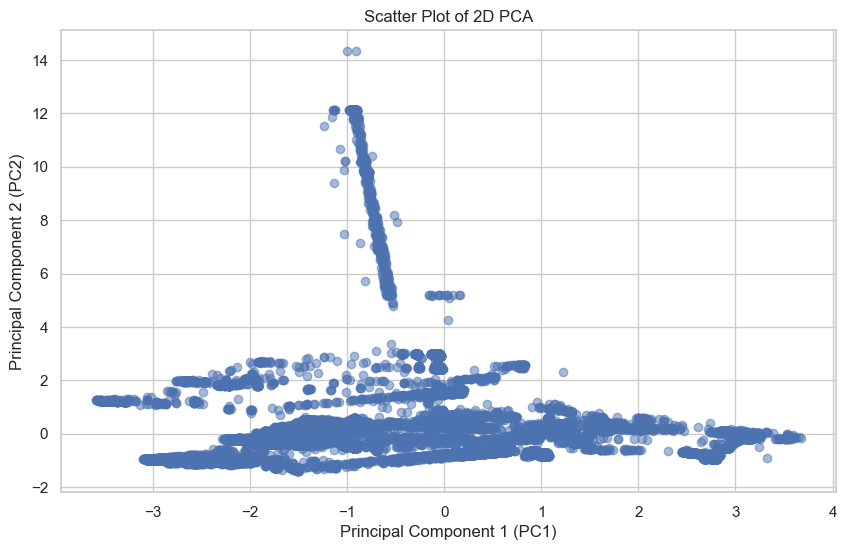

In [194]:
# 2D PCA
pca = PCA(n_components=2)
projection = pca.fit_transform(cluster_subAttack)
projection = pd.DataFrame(projection, columns=['PC1', 'PC2'])

plt.figure(figsize=(10, 6))
plt.scatter(projection['PC1'], projection['PC2'], alpha=0.5)
plt.title('Scatter Plot of 2D PCA')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.grid(True)

Best number of clusters (k): 10  with corresponding silhouette score: 0.4073852837823785


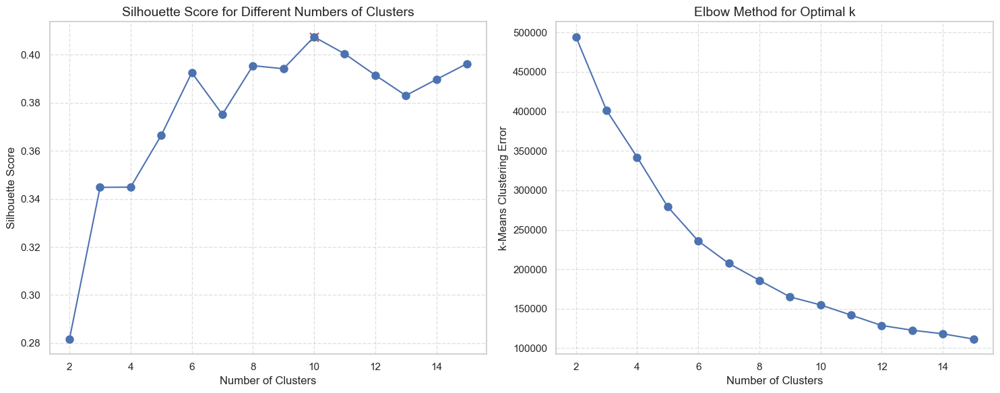

In [195]:
# Set n_init explicitly to suppress the warning
n_init_value = 10

n_cluster_list = []
shs_list = []
inertia_list = []

for n_clusters in range(2, 16):
    kmeans = KMeans(n_clusters=n_clusters, n_init=n_init_value)
    cl2_labels = kmeans.fit_predict(cluster_subAttack)
    
    silhouette = silhouette_score(cluster_subAttack, cl2_labels)
    
    n_cluster_list.append(n_clusters)
    shs_list.append(silhouette)
    inertia_list.append(kmeans.inertia_)

# Find the best number of clusters and the corresponding silhouette score
best_sh = np.max(shs_list)
best_n = n_cluster_list[np.argmax(shs_list)]

print("Best number of clusters (k):", best_n, " with corresponding silhouette score:", best_sh)

fig, axs = plt.subplots(1, 2, figsize=(15, 6))

axs[0].plot(n_cluster_list, shs_list, marker='o', markersize=8, linestyle='-', color='b')
axs[0].scatter(best_n, best_sh, color='r', marker='x', s=90)
axs[0].grid(True, linestyle='--', alpha=0.6)

axs[0].set_xlabel('Number of Clusters', fontsize=12)
axs[0].set_ylabel('Silhouette Score', fontsize=12)
axs[0].set_title('Silhouette Score for Different Numbers of Clusters', fontsize=14)

axs[1].plot(n_cluster_list, inertia_list, marker='o', markersize=8, linestyle='-', color='b')
axs[1].grid(True, linestyle='--', alpha=0.6)

axs[1].set_xlabel('Number of Clusters', fontsize=12)
axs[1].set_ylabel('k-Means Clustering Error', fontsize=12)
axs[1].set_title('Elbow Method for Optimal k', fontsize=14)

plt.tight_layout()

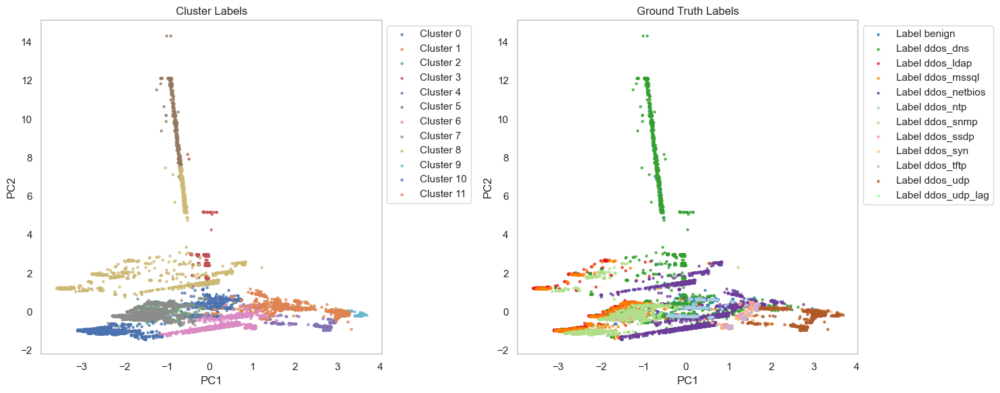

In [196]:
best_sub = 12
n_init_value = 10

# 2D PCA
pca = PCA(n_components=2)
projection = pca.fit_transform(cluster_subAttack)
projection = pd.DataFrame(projection)

kmeans = KMeans(n_clusters=best_sub, n_init=n_init_value)
cl2_labels = kmeans.fit_predict(cluster_subAttack)

projection['cl2_label'] = cl2_labels.reshape(-1)
projection['label'] = df_label['label']

fig, axs = plt.subplots(1, 2, figsize=(15, 6))

for i in np.unique(cl2_labels):
    subdf = projection[projection.cl2_label == i]
    axs[0].scatter(subdf[0], subdf[1], label=f'Cluster {i}', s=5, alpha=0.7)

axs[0].grid()
lgnd = axs[0].legend(bbox_to_anchor=(1, 1), loc="upper left")
axs[0].set_xlabel('PC1')
axs[0].set_ylabel('PC2')
axs[0].set_title('Cluster Labels')

distinct_colors = ['#1f78b4', '#33a02c', '#e31a1c', '#ff7f00', '#6a3d9a', '#a6cee3', '#b2df8a', '#fb9a99', '#fdbf6f', '#cab2d6', '#b15928', '#99ff99']

for i, color in zip(np.unique(df_label['label']), distinct_colors):
    subdf = projection[projection.label == i]
    axs[1].scatter(subdf[0], subdf[1], label=f'Label {i}', s=5, color=color, alpha=0.7)

axs[1].grid()
lgnd = axs[1].legend(bbox_to_anchor=(1, 1), loc="upper left")
axs[1].set_xlabel('PC1')
axs[1].set_ylabel('PC2')
axs[1].set_title('Ground Truth Labels')

plt.tight_layout()

In [197]:
cluster2_label = df_clusters[df_clusters['cluster'] == 2]['y']

In [198]:
# df_cluster2 = pd.DataFrame({'y': cluster2_label, 'sub-cluster': cl2_labels})

# Group by ground truth labels and count the occurrences of each cluster
# sub_clusters_counts = df_cluster2.groupby('y')['sub-cluster'].value_counts().unstack(fill_value=0)
# sub_clusters_counts

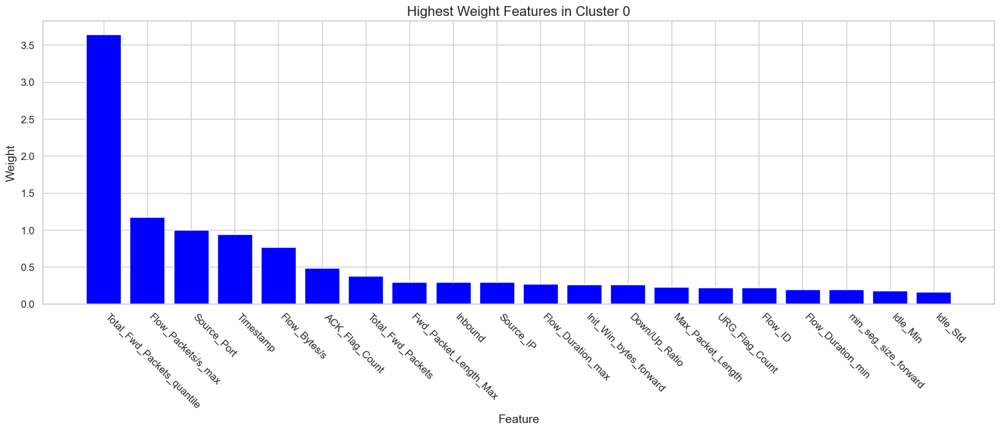

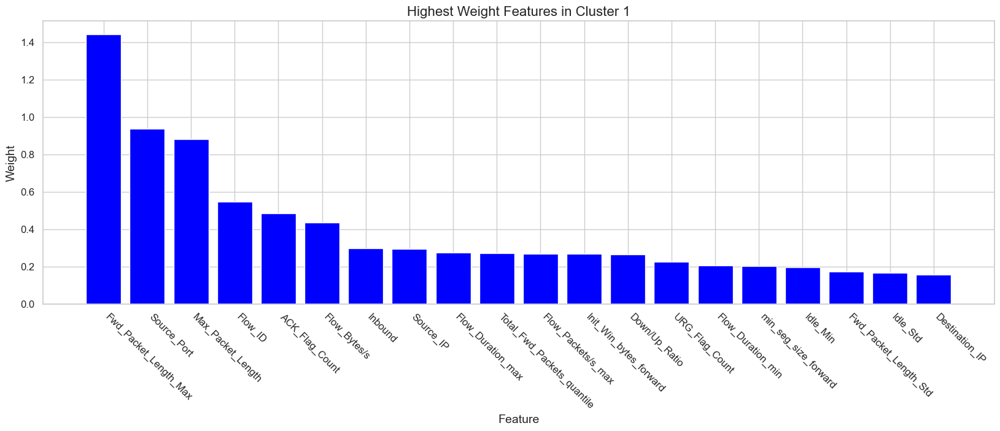

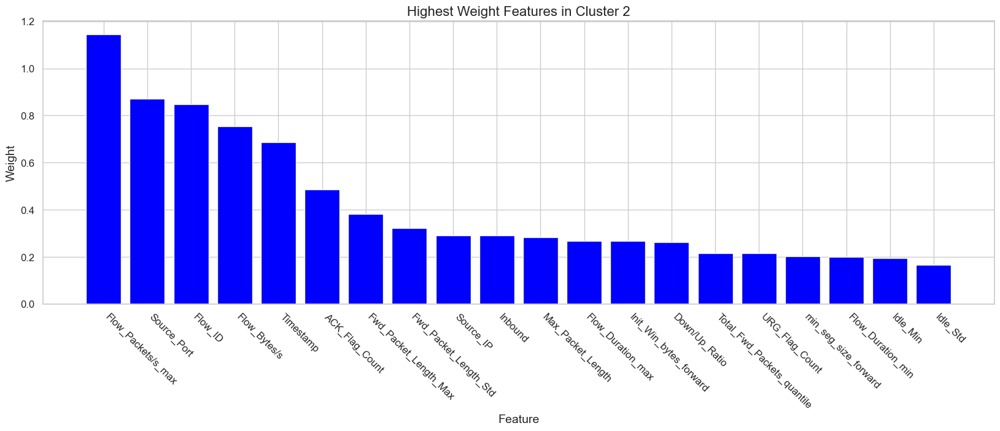

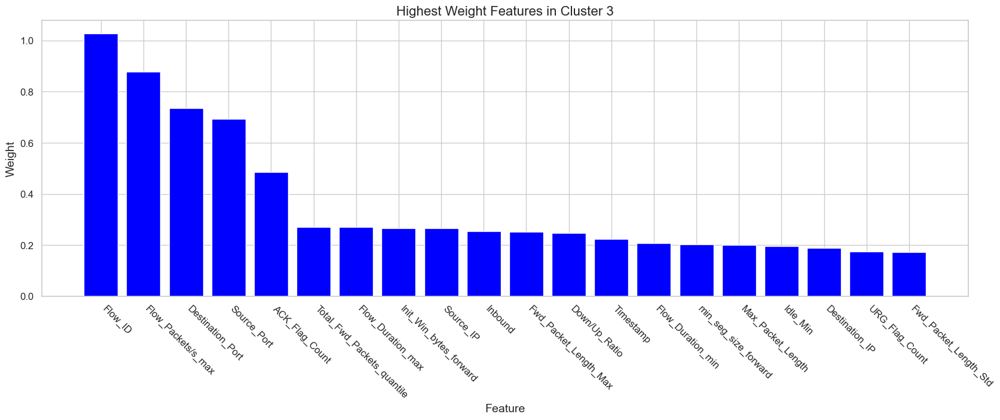

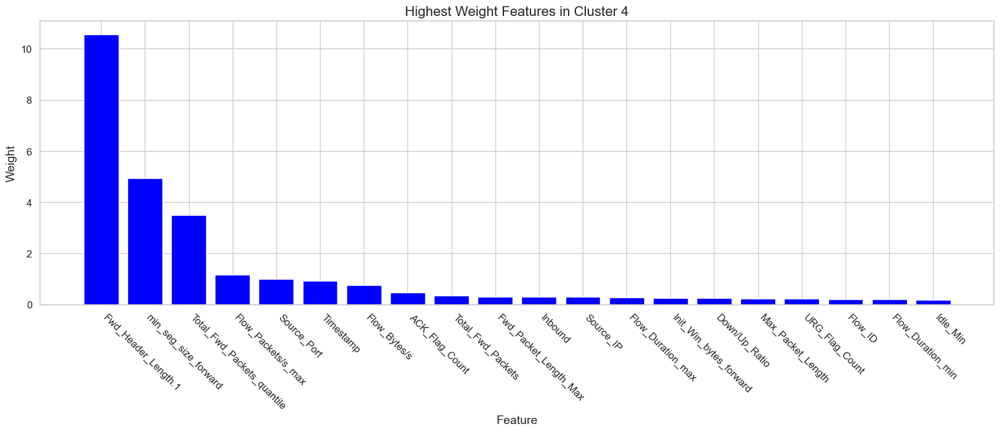

...

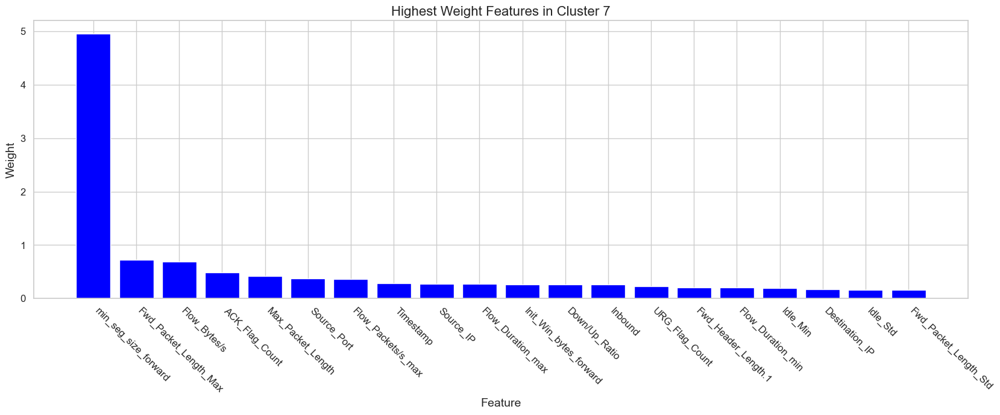

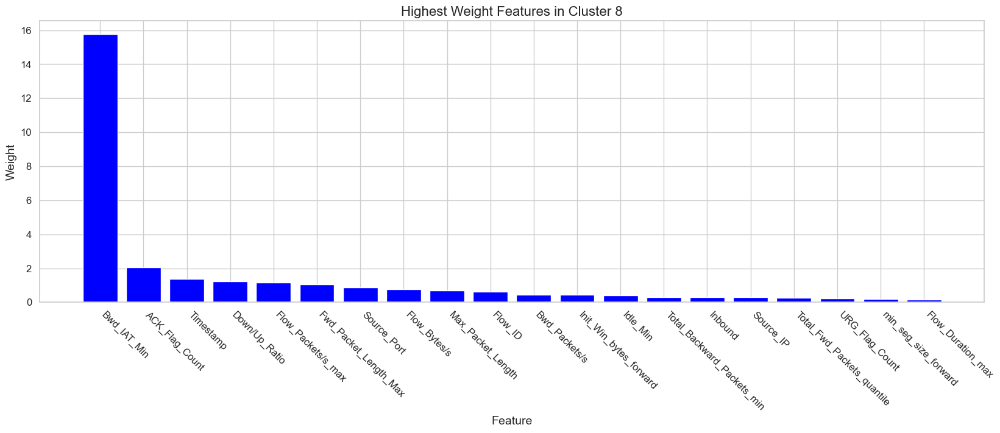

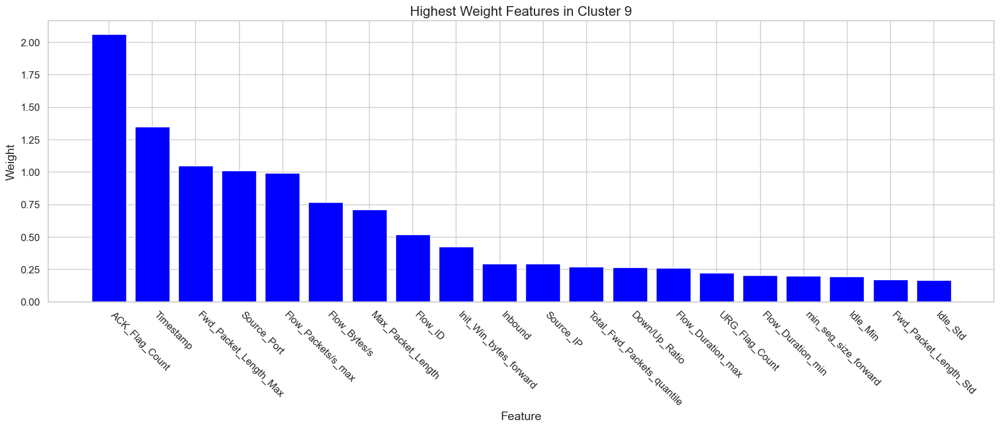

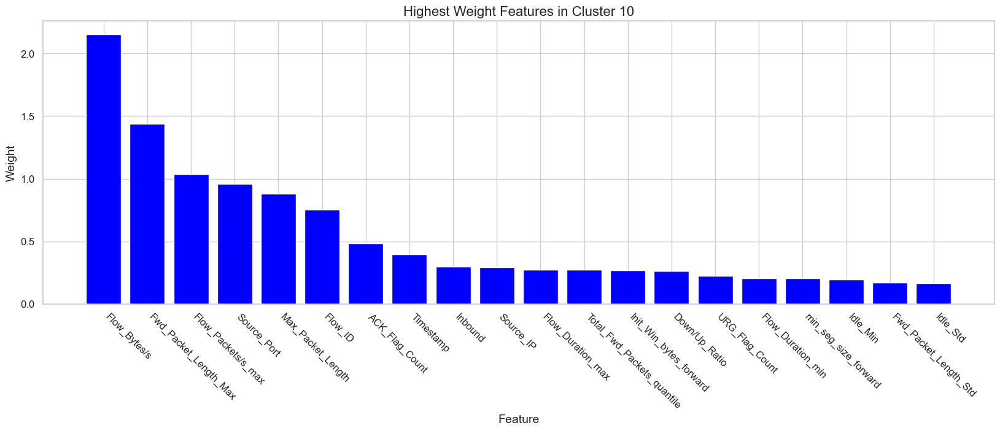

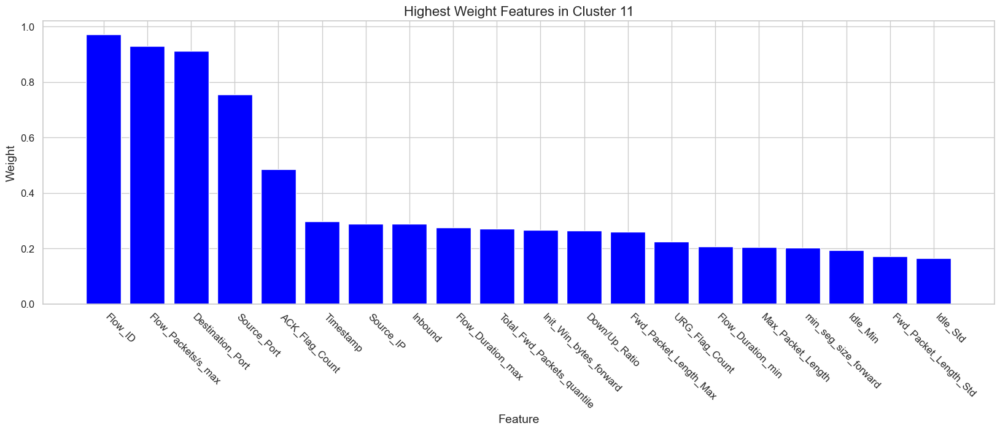

In [199]:
kms = KMeansInterp(n_clusters= best_sub, 
                   random_state=15, 
                   ordered_feature_names = cluster_subAttack.columns,
                   feature_importance_method='wcss_min',
                   n_init=10,
                  ).fit(cluster_subAttack)

labels = kms.labels_
cluster_subAttack['cluster']=labels

for cluster_label, feature_weights in kms.feature_importances_.items():    
    df_feature_weight = pd.DataFrame(feature_weights[:20], columns=["Feature", "Weight"])
    fig, ax = plt.subplots(figsize=(20, 6))
    
    features = df_feature_weight["Feature"]
    weights = df_feature_weight["Weight"]
    
    ax.bar(features, weights, color='blue')
    
    plt.xticks(rotation=-45, ha="left")
    ax.tick_params(axis='both', which='major', labelsize=12)
    plt.title(f'Highest Weight Features in Cluster {cluster_label}', fontsize=16)
    plt.xlabel('Feature', fontsize=14)
    plt.ylabel('Weight', fontsize=14)

In [200]:
sub_cl = pd.DataFrame({'y': cluster2_label, 'sub-cluster': labels})
sub_cl_count = sub_cl.groupby('y')['sub-cluster'].value_counts().unstack(fill_value=0)
sub_cl_count

sub-cluster,0,1,2,3,4,5,6,7,8,9,10,11
y,,,,,,,,,,,,
benign,0,0,0,0,0,4,85,1,0,0,0,0
ddos_dns,3400,556,31,84,531,29,221,245,0,0,113,54
ddos_ldap,0,1723,0,0,0,0,11,500,0,0,3691,0
ddos_mssql,0,2044,0,0,0,0,9,173,0,0,3683,0
ddos_netbios,0,19,365,2355,0,0,1,717,0,0,87,2285
ddos_ntp,0,0,4,56,0,94,2,0,0,1,0,0
ddos_snmp,0,0,23,98,0,0,5790,0,0,0,0,73
ddos_ssdp,0,4876,1,3,0,0,7,349,0,0,730,0
ddos_syn,0,0,0,0,0,826,0,0,18,2318,0,0


In [201]:
cluster_subAttack

,Flow_ID,Source_IP,Source_Port,Destination_IP,Destination_Port,Timestamp,Total_Fwd_Packets,Fwd_Packet_Length_Max,Fwd_Packet_Length_Std,Bwd_Packet_Length_Max,...,SimillarHTTP,Inbound,Total_Fwd_Packets_max,Total_Fwd_Packets_quantile,Total_Backward_Packets_mean,Total_Backward_Packets_min,Flow_Duration_min,Flow_Duration_max,Flow_Packets/s_max,cluster
0,0.269683,-0.294846,-0.996890,-0.156273,1.463534,-0.981207,0.169121,-0.297075,-0.172277,-0.069596,...,-0.086584,0.295752,0.038928,1.675266,-0.086732,-0.056847,-0.204912,-0.273600,-1.180782,0
1,-0.202971,2.322551,-0.996890,-2.966318,1.463534,-0.981205,-0.036372,-0.297075,-0.172277,-0.069596,...,-0.086584,-3.381206,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,-0.074012,6
2,0.214301,-0.294846,-0.996890,-0.156273,0.770389,-0.981198,0.391920,-0.297075,-0.172277,-0.069596,...,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203933,-0.272839,-1.179998,0
3,0.087634,-0.294846,-0.996890,-0.156273,-0.924976,-0.981189,0.391920,-0.297075,-0.172277,-0.069596,...,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.203944,-0.272847,-1.179978,0
4,0.146771,-0.294846,-0.996890,-0.156273,-0.139438,-0.981176,0.391920,-0.297075,-0.172277,-0.069596,...,-0.086584,0.295752,0.110547,3.785396,-0.086732,-0.056847,-0.204737,-0.273463,-1.177637,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,-1.202225,-0.294846,0.540571,-0.156273,1.589149,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548,11
64235,-0.289219,-0.294846,1.350236,-0.156273,-0.577568,0.942099,-0.027720,-0.377323,0.521580,-0.069596,...,-0.086584,0.295752,-0.024347,-0.189023,-0.086732,-0.056847,-0.195974,-0.266653,-1.184541,2
64236,-0.848784,-0.294846,0.843239,-0.156273,1.670387,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548,11
64237,-0.187013,-0.294846,1.433360,-0.156273,-0.996433,0.942099,-0.032046,-0.384152,0.501315,-0.069596,...,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.200996,-0.270556,-1.184532,2


In [204]:
cluster_subAttack['label']=cluster2_label

In [205]:
udp_df = cluster_subAttack[cluster_subAttack['label']=='ddos_udp'].drop(columns=['label','cluster'])
udp_df

,Flow_ID,Source_IP,Source_Port,Destination_IP,Destination_Port,Timestamp,Total_Fwd_Packets,Fwd_Packet_Length_Max,Fwd_Packet_Length_Std,Bwd_Packet_Length_Max,...,Idle_Min,SimillarHTTP,Inbound,Total_Fwd_Packets_max,Total_Fwd_Packets_quantile,Total_Backward_Packets_mean,Total_Backward_Packets_min,Flow_Duration_min,Flow_Duration_max,Flow_Packets/s_max
41635,-1.044692,-0.294846,0.735551,-0.156273,-1.182595,0.540187,-0.027720,-0.377323,0.521580,-0.069596,...,-0.194882,-0.086584,0.295752,-0.024347,-0.189023,-0.086732,-0.056847,-0.195674,-0.266420,-1.184542
41636,-0.467789,-0.294846,1.192771,-0.156273,-1.032211,0.540187,-0.032046,-0.418300,0.272979,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.201032,-0.270584,-1.184532
41637,-0.379222,-0.294846,1.267558,-0.156273,-1.279510,0.540187,-0.032046,-0.384152,0.501315,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.201209,-0.270721,-1.184530
41638,-1.136848,-0.294846,0.605645,-0.156273,-1.379570,0.540187,-0.032046,-0.384152,-0.103776,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.200898,-0.270480,-1.184533
41639,-1.569857,-0.294846,0.352956,-0.156273,-0.678905,0.540187,-0.036372,-0.394397,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47506,-1.523033,-0.294846,0.376267,-0.156273,-0.075057,0.540377,-0.032046,-0.418300,0.272979,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.201000,-0.270559,-1.184532
47507,-1.082239,-0.294846,0.685005,-0.156273,0.829953,0.540377,-0.027720,-0.377323,0.521580,-0.069596,...,-0.194882,-0.086584,0.295752,-0.024347,-0.189023,-0.086732,-0.056847,-0.195678,-0.266423,-1.184542
47508,-0.803672,-0.294846,0.865578,-0.156273,-0.866493,0.540377,-0.036372,-0.394397,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
47509,-0.498931,-0.294846,1.166709,-0.156273,0.863667,0.540377,-0.032046,-0.384152,0.501315,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.201087,-0.270627,-1.184531


cluster
0    1748
1    2406
2    1721
dtype: int64

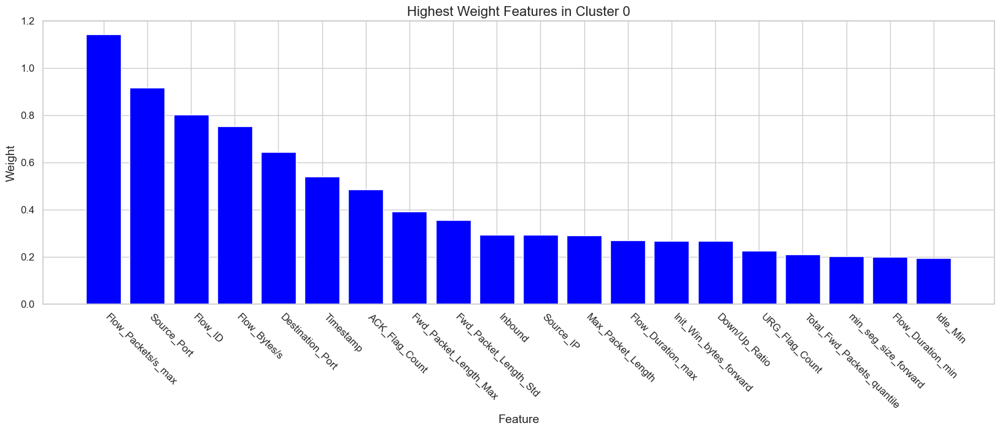

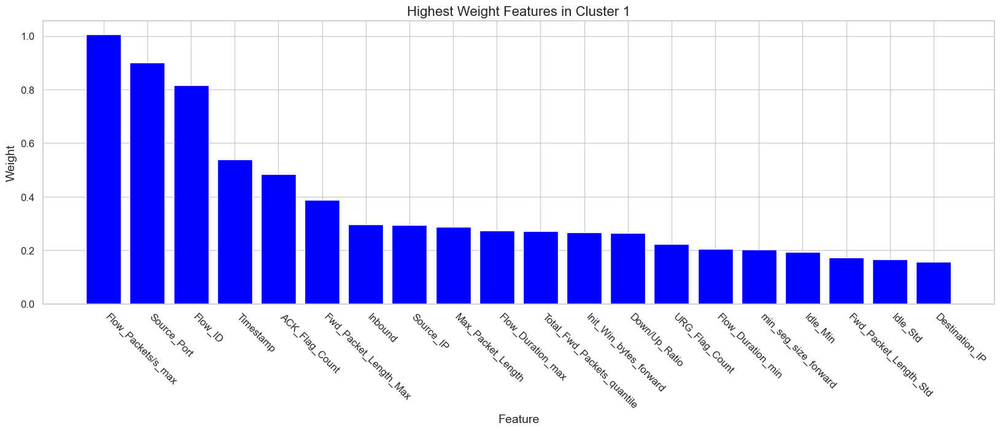

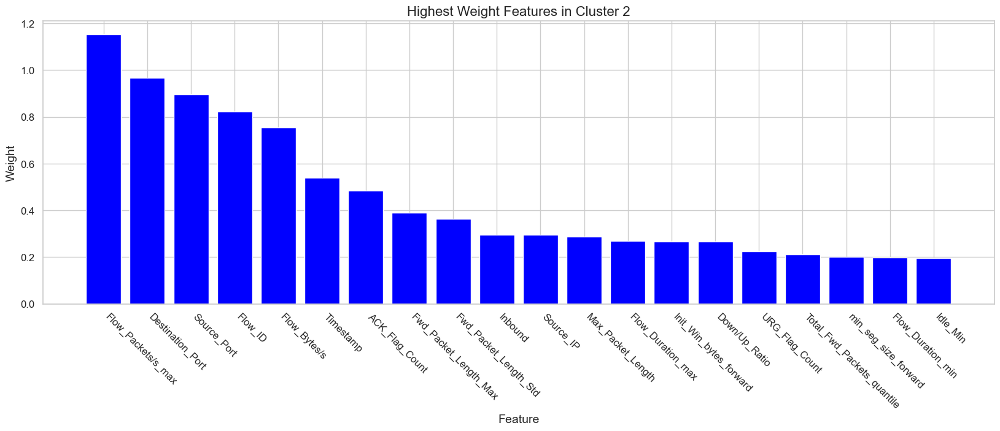

In [206]:
kms = KMeansInterp(n_clusters= 3, 
                   random_state=15, 
                   ordered_feature_names = udp_df.columns,
                   feature_importance_method='wcss_min',
                   n_init=10,
                  ).fit(udp_df)

labels = kms.labels_
udp_df['cluster']=labels

display(udp_df.groupby('cluster').size())

for cluster_label, feature_weights in kms.feature_importances_.items():    
    df_feature_weight = pd.DataFrame(feature_weights[:20], columns=["Feature", "Weight"])
    fig, ax = plt.subplots(figsize=(20, 6))
    
    features = df_feature_weight["Feature"]
    weights = df_feature_weight["Weight"]
    
    ax.bar(features, weights, color='blue')
    
    plt.xticks(rotation=-45, ha="left")
    ax.tick_params(axis='both', which='major', labelsize=12)
    plt.title(f'Highest Weight Features in Cluster {cluster_label}', fontsize=16)
    plt.xlabel('Feature', fontsize=14)
    plt.ylabel('Weight', fontsize=14)

In [207]:
udp_df_lag = cluster_subAttack[cluster_subAttack['label']=='ddos_udp_lag'].drop(columns=['label','cluster'])
udp_df_lag

,Flow_ID,Source_IP,Source_Port,Destination_IP,Destination_Port,Timestamp,Total_Fwd_Packets,Fwd_Packet_Length_Max,Fwd_Packet_Length_Std,Bwd_Packet_Length_Max,...,Idle_Min,SimillarHTTP,Inbound,Total_Fwd_Packets_max,Total_Fwd_Packets_quantile,Total_Backward_Packets_mean,Total_Backward_Packets_min,Flow_Duration_min,Flow_Duration_max,Flow_Packets/s_max
58253,-0.303907,-0.294846,1.342668,-0.156273,-1.290174,0.941930,-0.036372,-0.394397,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
58254,-1.341702,-0.294846,0.471086,-0.156273,-1.022283,0.941930,-0.036372,-0.384152,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
58255,-1.103939,-0.294846,0.666106,-0.156273,0.080881,0.941930,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,-0.074012
58256,-0.430242,-0.294846,1.221342,-0.156273,-1.229824,0.941930,-0.036372,-0.418300,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,-0.074012
58257,-0.284194,-0.294846,1.356792,-0.156273,1.259090,0.941930,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64234,-1.202225,-0.294846,0.540571,-0.156273,1.589149,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64235,-0.289219,-0.294846,1.350236,-0.156273,-0.577568,0.942099,-0.027720,-0.377323,0.521580,-0.069596,...,-0.194882,-0.086584,0.295752,-0.024347,-0.189023,-0.086732,-0.056847,-0.195974,-0.266653,-1.184541
64236,-0.848784,-0.294846,0.843239,-0.156273,1.670387,0.942099,-0.036372,-0.408056,-0.172277,-0.069596,...,-0.194882,-0.086584,0.295752,-0.027128,-0.270970,-0.086732,-0.056847,-0.206294,-0.274673,1.036548
64237,-0.187013,-0.294846,1.433360,-0.156273,-0.996433,0.942099,-0.032046,-0.384152,0.501315,-0.069596,...,-0.194882,-0.086584,0.295752,-0.025738,-0.229997,-0.086732,-0.056847,-0.200996,-0.270556,-1.184532


cluster
0    2305
1    1870
2    1811
dtype: int64

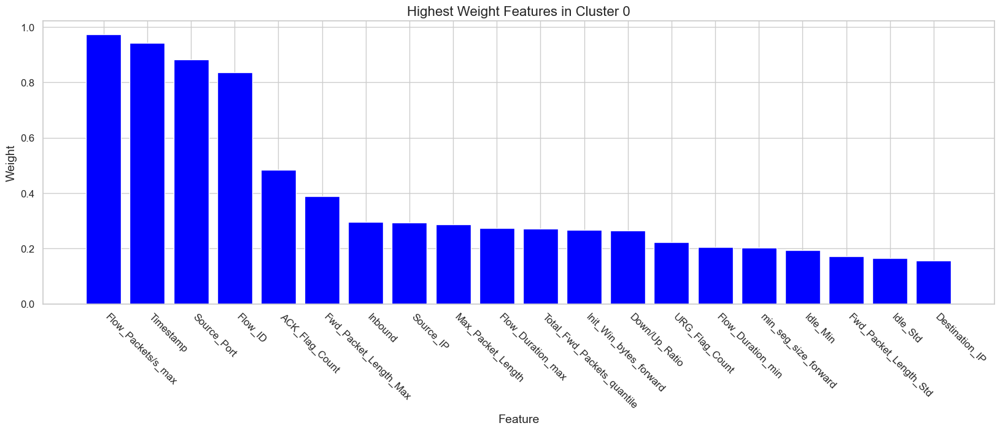

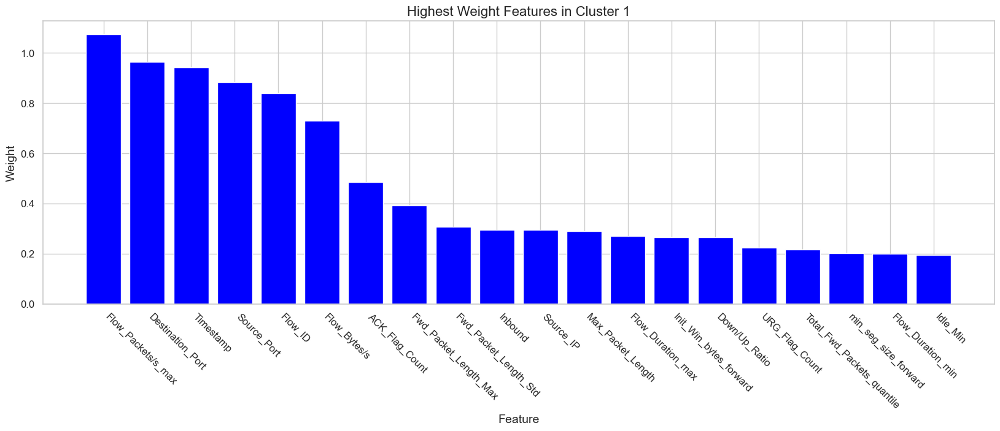

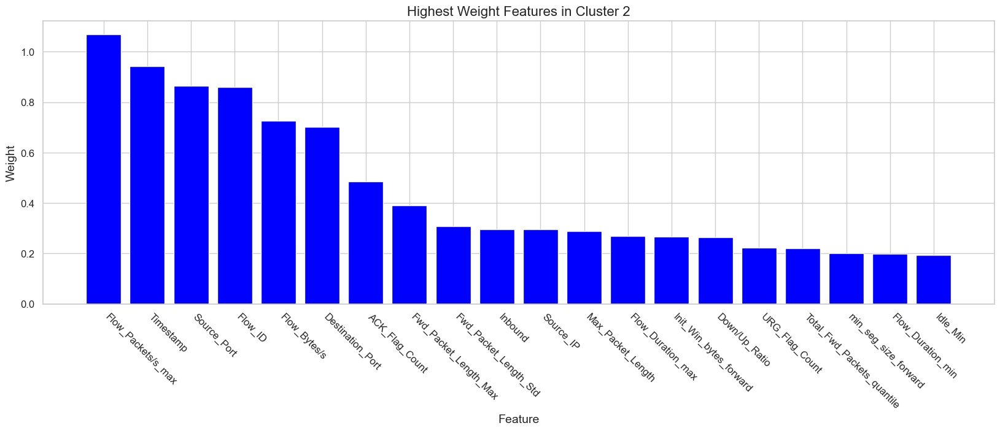

In [208]:
kms = KMeansInterp(n_clusters= 3, 
                   random_state=15, 
                   ordered_feature_names = udp_df_lag.columns,
                   feature_importance_method='wcss_min',
                   n_init=10,
                  ).fit(udp_df_lag)

labels = kms.labels_
udp_df_lag['cluster']=labels

display(udp_df_lag.groupby('cluster').size())

for cluster_label, feature_weights in kms.feature_importances_.items():    
    df_feature_weight = pd.DataFrame(feature_weights[:20], columns=["Feature", "Weight"])
    fig, ax = plt.subplots(figsize=(20, 6))
    
    features = df_feature_weight["Feature"]
    weights = df_feature_weight["Weight"]
    
    ax.bar(features, weights, color='blue')
    
    plt.xticks(rotation=-45, ha="left")
    ax.tick_params(axis='both', which='major', labelsize=12)
    plt.title(f'Highest Weight Features in Cluster {cluster_label}', fontsize=16)
    plt.xlabel('Feature', fontsize=14)
    plt.ylabel('Weight', fontsize=14)